# NGC 6121 Analysis

In [1]:
import matplotlib.pyplot as mp
import read_dao
import sys
import coordinates
import numpy as np
from matplotlib.ticker import ScalarFormatter
from astropy.wcs import WCS
from astropy.io import fits
import optical
import lightcurves
import calibration
import analysis_routines
import variables
%matplotlib inline 

In [2]:
target = 'NGC6121'
folder = '/Volumes/Annie/CRRP/'+target+'/'
optical_dir = '/Volumes/Annie/CRRP/OpticalCatalogs/'
cluster_ra = '16:23:35.22'
cluster_dec = '-26:31:32.7'

## Cluster Snapshot

In [3]:
dtype1 = np.dtype([('img', 'S30'), ('ra', float), ('dec', float)])
ch1_data = np.loadtxt(folder+'I1_centers.txt', dtype=dtype1, usecols=(0,1,2))
ch2_data = np.loadtxt(folder+'I2_centers.txt', dtype=dtype1, usecols=(0,1,2))

#### Plot AOR footprint

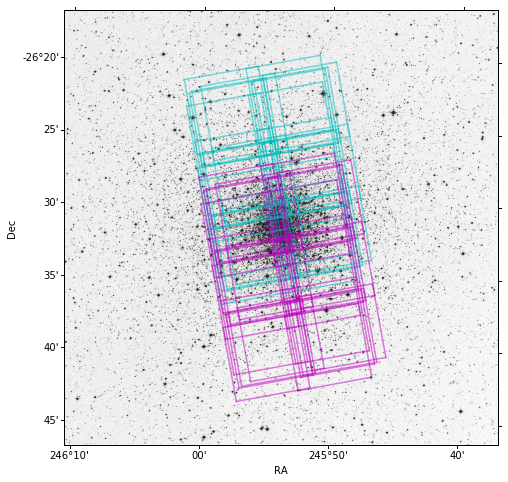

In [4]:
from matplotlib.colors import LogNorm
hdu = fits.open(folder+'dss-'+target+'.fits')[0]
wcs = WCS(hdu.header)
fig = mp.figure(figsize=(8,8))
ax = fig.add_subplot(111, projection=wcs)
mp.imshow(hdu.data, origin='lower', cmap='gray_r')#, norm=LogNorm())

for ind, fits_file in enumerate(ch1_data['img']):
    w = WCS(folder+fits_file)
    ra1, dec1 = w.wcs_pix2world(1, 1, 0)
    ra2, dec2 = w.wcs_pix2world(1, 256, 0)
    ra3, dec3 = w.wcs_pix2world(256, 256, 0)
    ra4, dec4 = w.wcs_pix2world(256, 1, 0)
# Plot [3.6] AOR footprint
  #  mp.plot(ch1_data['ra'][ind], ch1_data['dec'][ind], 'ro')
    ax.plot([ra1, ra2], [dec1, dec2], '-', color='c', alpha=0.5, transform=ax.get_transform('fk5'))
    ax.plot([ra2, ra3], [dec2, dec3], '-', color='c', alpha=0.5, transform=ax.get_transform('fk5'))
    ax.plot([ra3, ra4], [dec3, dec4], '-', color='c', alpha=0.5, transform=ax.get_transform('fk5'))
    ax.plot([ra4, ra1], [dec4, dec1], '-', color='c', alpha=0.5, transform=ax.get_transform('fk5'))
for ind, fits_file in enumerate(ch2_data['img']):
    w = WCS(folder+fits_file)
    ra1, dec1 = w.wcs_pix2world(1, 1, 0)
    ra2, dec2 = w.wcs_pix2world(1, 256, 0)
    ra3, dec3 = w.wcs_pix2world(256, 256, 0)
    ra4, dec4 = w.wcs_pix2world(256, 1, 0)
# Plot [4.5] AOR footprint
  #  mp.plot(ch2_data['ra'][ind], ch2_data['dec'][ind], 'ro')
    ax.plot([ra1, ra2], [dec1, dec2], '-', color='m', alpha=0.5, transform=ax.get_transform('fk5'))
    ax.plot([ra2, ra3], [dec2, dec3], '-', color='m', alpha=0.5, transform=ax.get_transform('fk5'))
    ax.plot([ra3, ra4], [dec3, dec4], '-', color='m', alpha=0.5, transform=ax.get_transform('fk5'))
    ax.plot([ra4, ra1], [dec4, dec1], '-', color='m', alpha=0.5, transform=ax.get_transform('fk5'))
ax.set_xlabel('RA')
ax.set_ylabel('Dec')

x_formatter = ScalarFormatter(useOffset=False)
mp.gca().xaxis.set_major_formatter(x_formatter)
mp.show()

#### Map of source catalog with field boundaries shown

Reading optical catalog for NGC6121...
Finished reading optical catalog.


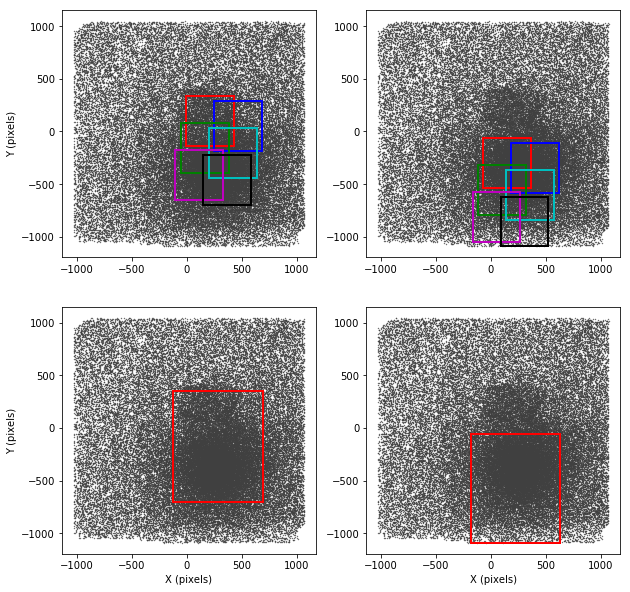

In [5]:
fig = mp.figure(figsize=(10,10))
ax1 = fig.add_subplot(221)
ax2 = fig.add_subplot(222)
ax3 = fig.add_subplot(223)
ax4 = fig.add_subplot(224)

# read optical catalog and add to plots
ids, xcat, ycat, ra, dec = optical.read_optical_fnl(optical_dir, target)
ax1.plot(xcat, ycat, '.', color='0.25', markersize=0.75)
ax2.plot(xcat, ycat, '.', color='0.25', markersize=0.75)
ax3.plot(xcat, ycat, '.', color='0.25', markersize=0.75)
ax4.plot(xcat, ycat, '.', color='0.25', markersize=0.75)

# read boundaries of IRAC data
dtype1 = np.dtype([('xmin', float), ('xmax', float), ('ymin', float), ('ymax', float)])
I1cuts = np.loadtxt(folder+'I1-catalog-cuts.txt', dtype=dtype1, usecols=(1,2,3,4))
I2cuts = np.loadtxt(folder+'I2-catalog-cuts.txt', dtype=dtype1, usecols=(1,2,3,4))

colors=['r', 'b', 'g', 'c', 'm', 'k']
for ind in range(len(I1cuts['xmin'])):
    ax1.plot([I1cuts['xmin'][ind], I1cuts['xmax'][ind]], [I1cuts['ymin'][ind], I1cuts['ymin'][ind]],
        '-', color=colors[ind], linewidth=2)
    ax1.plot([I1cuts['xmin'][ind], I1cuts['xmax'][ind]], [I1cuts['ymax'][ind], I1cuts['ymax'][ind]],
        '-', color=colors[ind], linewidth=2)
    ax1.plot([I1cuts['xmin'][ind], I1cuts['xmin'][ind]], [I1cuts['ymin'][ind], I1cuts['ymax'][ind]],
        '-', color=colors[ind], linewidth=2)
    ax1.plot([I1cuts['xmax'][ind], I1cuts['xmax'][ind]], [I1cuts['ymin'][ind], I1cuts['ymax'][ind]],
        '-', color=colors[ind], linewidth=2)
ax1.set_ylabel('Y (pixels)')
for ind in range(len(I1cuts['xmin'])):
    ax2.plot([I2cuts['xmin'][ind], I2cuts['xmax'][ind]], [I2cuts['ymin'][ind], I2cuts['ymin'][ind]],
        '-', color=colors[ind], linewidth=2)
    ax2.plot([I2cuts['xmin'][ind], I2cuts['xmax'][ind]], [I2cuts['ymax'][ind], I2cuts['ymax'][ind]],
        '-', color=colors[ind], linewidth=2)
    ax2.plot([I2cuts['xmin'][ind], I2cuts['xmin'][ind]], [I2cuts['ymin'][ind], I2cuts['ymax'][ind]],
        '-', color=colors[ind], linewidth=2)
    ax2.plot([I2cuts['xmax'][ind], I2cuts['xmax'][ind]], [I2cuts['ymin'][ind], I2cuts['ymax'][ind]],
        '-', color=colors[ind], linewidth=2)

## Mosaics
I2mcuts = np.loadtxt(folder+'I2-mosaic-catalog-cuts.txt', dtype=dtype1, usecols=(1,2,3,4))
I1mcuts = np.loadtxt(folder+'I1-mosaic-catalog-cuts.txt', dtype=dtype1, usecols=(1,2,3,4))

colors=['r']
ind=0
ax3.plot([I1mcuts['xmin'], I1mcuts['xmax']], [I1mcuts['ymin'], I1mcuts['ymin']],
    '-', color=colors[ind], linewidth=2)
ax3.plot([I1mcuts['xmin'], I1mcuts['xmax']], [I1mcuts['ymax'], I1mcuts['ymax']],
    '-', color=colors[ind], linewidth=2)
ax3.plot([I1mcuts['xmin'], I1mcuts['xmin']], [I1mcuts['ymin'], I1mcuts['ymax']],
    '-', color=colors[ind], linewidth=2)
ax3.plot([I1mcuts['xmax'], I1mcuts['xmax']], [I1mcuts['ymin'], I1mcuts['ymax']],
    '-', color=colors[ind], linewidth=2)
ax3.set_xlabel('X (pixels)')
ax3.set_ylabel('Y (pixels)')
ax4.plot([I2mcuts['xmin'], I2mcuts['xmax']], [I2mcuts['ymin'], I2mcuts['ymin']],
    '-', color=colors[ind], linewidth=2)
ax4.plot([I2mcuts['xmin'], I2mcuts['xmax']], [I2mcuts['ymax'], I2mcuts['ymax']],
    '-', color=colors[ind], linewidth=2)
ax4.plot([I2mcuts['xmin'], I2mcuts['xmin']], [I2mcuts['ymin'], I2mcuts['ymax']],
    '-', color=colors[ind], linewidth=2)
ax4.plot([I2mcuts['xmax'], I2mcuts['xmax']], [I2mcuts['ymin'], I2mcuts['ymax']],
    '-', color=colors[ind], linewidth=2)
ax4.set_xlabel('X (pixels)')
mp.show()

#### Check transformed catalogs

Reading optical catalog for NGC6121...
Finished reading optical catalog.


IndexError: list index out of range

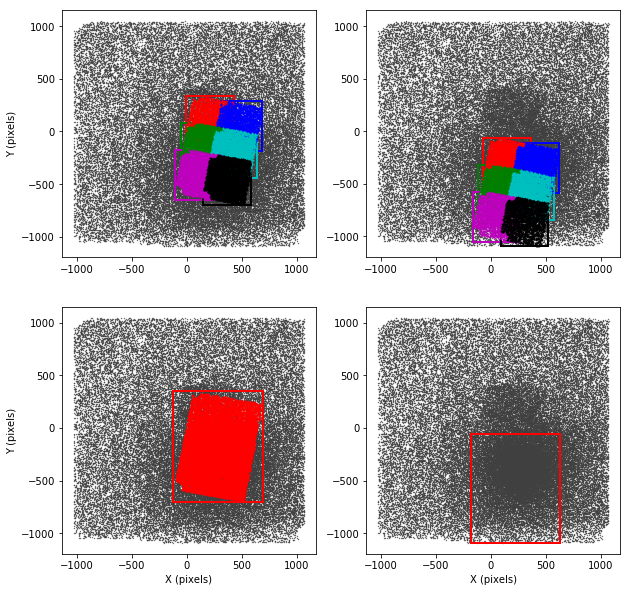

In [6]:
fig = mp.figure(figsize=(10,10))
ax1 = fig.add_subplot(221)
ax2 = fig.add_subplot(222)
ax3 = fig.add_subplot(223)
ax4 = fig.add_subplot(224)

# read optical catalog and add to plots
ids, xcat, ycat, ra, dec = optical.read_optical_fnl(optical_dir, target)
ax1.plot(xcat, ycat, '.', color='0.25', markersize=0.75)
ax2.plot(xcat, ycat, '.', color='0.25', markersize=0.75)
ax3.plot(xcat, ycat, '.', color='0.25', markersize=0.75)
ax4.plot(xcat, ycat, '.', color='0.25', markersize=0.75)

# read boundaries of IRAC data
dtype1 = np.dtype([('xmin', float), ('xmax', float), ('ymin', float), ('ymax', float)])
I1cuts = np.loadtxt(folder+'I1-catalog-cuts.txt', dtype=dtype1, usecols=(1,2,3,4))
I2cuts = np.loadtxt(folder+'I2-catalog-cuts.txt', dtype=dtype1, usecols=(1,2,3,4))

colors=['r', 'b', 'g', 'c', 'm', 'k']
for ind in range(len(I1cuts['xmin'])):
    ax1.plot([I1cuts['xmin'][ind], I1cuts['xmax'][ind]], [I1cuts['ymin'][ind], I1cuts['ymin'][ind]],
        '-', color=colors[ind], linewidth=2)
    ax1.plot([I1cuts['xmin'][ind], I1cuts['xmax'][ind]], [I1cuts['ymax'][ind], I1cuts['ymax'][ind]],
        '-', color=colors[ind], linewidth=2)
    ax1.plot([I1cuts['xmin'][ind], I1cuts['xmin'][ind]], [I1cuts['ymin'][ind], I1cuts['ymax'][ind]],
        '-', color=colors[ind], linewidth=2)
    ax1.plot([I1cuts['xmax'][ind], I1cuts['xmax'][ind]], [I1cuts['ymin'][ind], I1cuts['ymax'][ind]],
        '-', color=colors[ind], linewidth=2)
ax1.set_ylabel('Y (pixels)')
for ind in range(len(I1cuts['xmin'])):
    IRids, IRx, IRy, IRmag, IRerr = read_dao.read_mag(folder+'I1_field'+str(ind+1)+'.mag')
    files, x_off, y_off, transform, dof = read_dao.read_mch(folder+'op-I1-f'+str(ind+1)+'.mch')
    x = float(x_off[1])+float(transform[1][0])*IRx+float(transform[1][1])*IRy
    y = float(y_off[1])+float(transform[1][2])*IRx+float(transform[1][3])*IRy
    ax1.plot(x, y, '.', markersize=1.8, color=colors[ind])
for ind in range(len(I1cuts['xmin'])):
    ax2.plot([I2cuts['xmin'][ind], I2cuts['xmax'][ind]], [I2cuts['ymin'][ind], I2cuts['ymin'][ind]],
        '-', color=colors[ind], linewidth=2)
    ax2.plot([I2cuts['xmin'][ind], I2cuts['xmax'][ind]], [I2cuts['ymax'][ind], I2cuts['ymax'][ind]],
        '-', color=colors[ind], linewidth=2)
    ax2.plot([I2cuts['xmin'][ind], I2cuts['xmin'][ind]], [I2cuts['ymin'][ind], I2cuts['ymax'][ind]],
        '-', color=colors[ind], linewidth=2)
    ax2.plot([I2cuts['xmax'][ind], I2cuts['xmax'][ind]], [I2cuts['ymin'][ind], I2cuts['ymax'][ind]],
        '-', color=colors[ind], linewidth=2)
for ind in range(len(I2cuts['xmin'])):
    IRids, IRx, IRy, IRmag, IRerr = read_dao.read_mag(folder+'I2_field'+str(ind+1)+'.mag')
    files, x_off, y_off, transform, dof = read_dao.read_mch(folder+'op-I2-f'+str(ind+1)+'.mch')
    x = float(x_off[1])+float(transform[1][0])*IRx+float(transform[1][1])*IRy
    y = float(y_off[1])+float(transform[1][2])*IRx+float(transform[1][3])*IRy
    ax2.plot(x, y, '.', markersize=1.8, color=colors[ind])
    
## Mosaics
I2mcuts = np.loadtxt(folder+'I2-mosaic-catalog-cuts.txt', dtype=dtype1, usecols=(1,2,3,4))
I1mcuts = np.loadtxt(folder+'I1-mosaic-catalog-cuts.txt', dtype=dtype1, usecols=(1,2,3,4))

colors=['r']
ind=0
ax3.plot([I1mcuts['xmin'], I1mcuts['xmax']], [I1mcuts['ymin'], I1mcuts['ymin']],
    '-', color=colors[ind], linewidth=2)
ax3.plot([I1mcuts['xmin'], I1mcuts['xmax']], [I1mcuts['ymax'], I1mcuts['ymax']],
    '-', color=colors[ind], linewidth=2)
ax3.plot([I1mcuts['xmin'], I1mcuts['xmin']], [I1mcuts['ymin'], I1mcuts['ymax']],
    '-', color=colors[ind], linewidth=2)
ax3.plot([I1mcuts['xmax'], I1mcuts['xmax']], [I1mcuts['ymin'], I1mcuts['ymax']],
    '-', color=colors[ind], linewidth=2)
ax3.set_xlabel('X (pixels)')
ax3.set_ylabel('Y (pixels)')
IRids, IRx, IRy, IRmag, IRerr = read_dao.read_mag(folder+'I1_mosaic.mag')
files, x_off, y_off, transform, dof = read_dao.read_mch(folder+'op-I1-mosaics.mch')
x = float(x_off[1])+float(transform[1][0])*IRx+float(transform[1][1])*IRy
y = float(y_off[1])+float(transform[1][2])*IRx+float(transform[1][3])*IRy
ax3.plot(x, y, '.', markersize=1.8, color=colors[ind])
ax4.plot([I2mcuts['xmin'], I2mcuts['xmax']], [I2mcuts['ymin'], I2mcuts['ymin']],
    '-', color=colors[ind], linewidth=2)
ax4.plot([I2mcuts['xmin'], I2mcuts['xmax']], [I2mcuts['ymax'], I2mcuts['ymax']],
    '-', color=colors[ind], linewidth=2)
ax4.plot([I2mcuts['xmin'], I2mcuts['xmin']], [I2mcuts['ymin'], I2mcuts['ymax']],
    '-', color=colors[ind], linewidth=2)
ax4.plot([I2mcuts['xmax'], I2mcuts['xmax']], [I2mcuts['ymin'], I2mcuts['ymax']],
    '-', color=colors[ind], linewidth=2)
ax4.set_xlabel('X (pixels)')
IRids, IRx, IRy, IRmag, IRerr = read_dao.read_mag(folder+'I2_mosaic.mag')
files, x_off, y_off, transform, dof = read_dao.read_mch(folder+'op-I2-mosaics.mch')
x = float(x_off[1])+float(transform[1][0])*IRx+float(transform[1][1])*IRy
y = float(y_off[1])+float(transform[1][2])*IRx+float(transform[1][3])*IRy
mp.plot(x, y, '.', markersize=1.8, color=colors[ind])
mp.show()

# Calibration

In [8]:
calibration.find_stars_in_cat(optical_dir, target, 'I1', data_dir=folder)
calibration.find_stars_in_cat(optical_dir, target, 'I2', data_dir=folder)

Reading optical catalog for NGC3201...
Finished reading optical catalog.
Writing files...
Reading optical catalog for NGC3201...
Finished reading optical catalog.
Writing files...


### Go to IDL and run aperture photometry script before the following steps

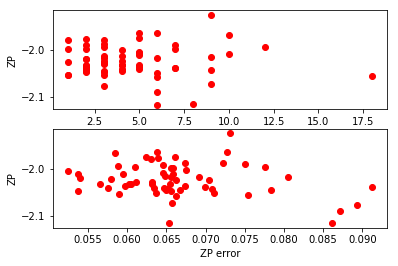

Maximum number of neighbors?: 5
Maximum standard deviation?:0.065
18 final calibration stars.
Mean, median zero point and standard deviation:
-2.02102971144 -2.02879613095 0.0243649129442


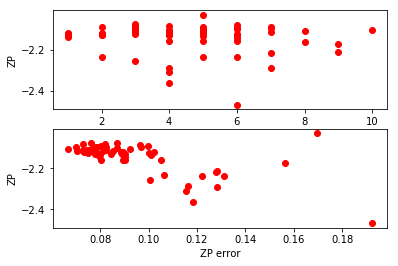

Maximum number of neighbors?: 5
Maximum standard deviation?:0.1
17 final calibration stars.
Mean, median zero point and standard deviation:
-2.12187331396 -2.12256521739 0.00737345375311


In [5]:
calibration.find_zp('I1', verbose=0, data_dir=folder)
calibration.find_zp('I2', verbose=0, data_dir=folder)

In [ ]:
calibration.apply_calibration('I1', -2.02, data_dir=folder)
calibration.apply_calibration('I2', -2.11, data_dir=folder)

## MIR catalog

In [7]:
analysis_routines.make_mir_catalog(['I1', 'I2'], target, ids, data_dir=folder)

In [3]:
center_ra, center_dec = coordinates.radec_string2deg(cluster_ra, cluster_dec)
analysis_routines.merge_opt_deep_catalogs(target, optical_dir, folder, cluster_coord=[center_ra, center_dec])

Reading optical catalog for NGC6121...
Finished reading optical catalog.
Reading MIR catalog for NGC6121...


In [3]:
analysis_routines.merge_catalogs(target, optical_dir, folder)

Reading optical catalog for NGC6121...
Finished reading optical catalog.
Reading MIR catalog for NGC6121...


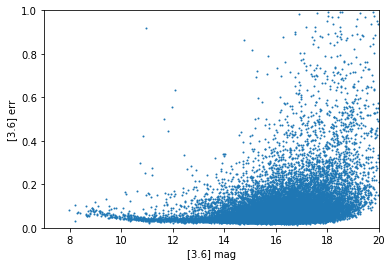

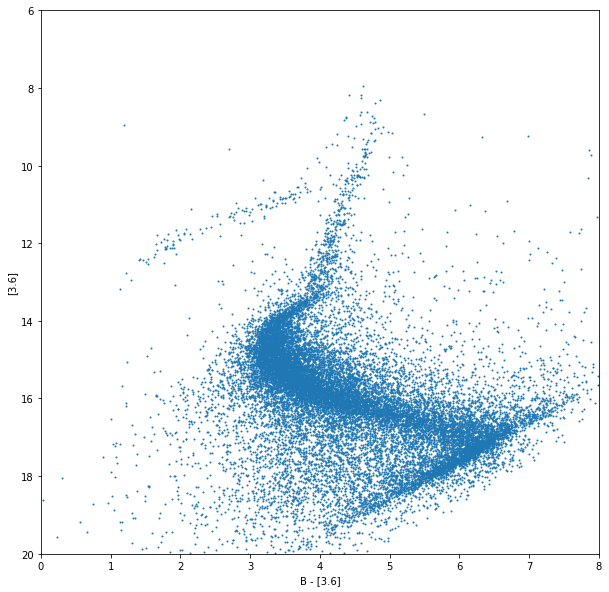

In [7]:
#center_ra, center_dec = coordinates.radec_string2deg(cluster_ra, cluster_dec)
# change to read merged catalog
catalog_data = analysis_routines.read_merged_catalog(folder)

thres = 300
thres2 = 12
dist = catalog_data['rad_dist']
color = catalog_data['B'][dist > thres2] - catalog_data['3.6'][dist > thres2]
mag = catalog_data['3.6'][dist > thres2]
err = catalog_data['3.6er'][dist > thres2]

fig = mp.figure()
ax1 = fig.add_subplot(111)
ax1.scatter(mag, err, s=1, edgecolor=None)
ax1.set_ylim((0,1.0))
ax1.set_xlim((7,20))
ax1.set_xlabel('[3.6] mag')
ax1.set_ylabel('[3.6] err')

good_mag = mag[err < 1]
good_color = color[err < 1]

scale = dist[dist < thres]
fig2 = mp.figure(figsize=(10,10))
ax2 = fig2.add_subplot(111)
ax2.scatter(good_color, good_mag, s=1, edgecolor=None)
ax2.set_ylim((20,6))
ax2.set_xlim((0,8))
ax2.set_xlabel('B - [3.6]')
ax2.set_ylabel('[3.6]')

# Variable stars

In [ ]:
# Find all stars identified as possible variables in optical catalog and list them in PeterIDs.txt

center_ra, center_dec = coordinates.radec_string2deg(cluster_ra, cluster_dec)
optical.find_variables_fnl(optical_dir, target, center_ra, center_dec, data_dir=folder)

##  Generate MIR light curves matching optical ID numbers  

In [6]:
dtype1 = np.dtype([('star', 'S10'), ('dao', int)])
data = np.loadtxt(folder+'PeterIDs.txt', dtype=dtype1, usecols=(0,1))

lightcurves.make_lcv(['I1', 'I2'], data['star'], data['dao'], data_dir=folder)

#### Phase MIR light curves

In [7]:
dtype1 = np.dtype([('id', 'S4'), ('cc_period', float), ('new_period', float)])
data = np.loadtxt(folder+target+'-variables.txt', dtype=dtype1, usecols=(0,1,2))

for ind, lcv in enumerate(data['id']):
    lcv_file = folder+'lcvs/mir/'+lcv+'.lcv'
    try:
        lightcurves.phase_lcv(lcv_file, data['new_period'][ind], 0, bin=1)
    except:
        print lcv +' not found.'

V30 not found.
V31 not found.
V32 not found.
V33 not found.
V34 not found.
V35 not found.
V43 not found.
V64 not found.
V75 not found.
V76 not found.


#### Create figure with all bands phased together

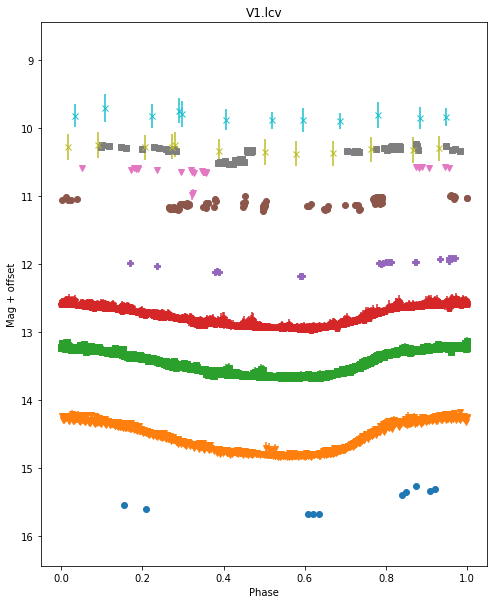

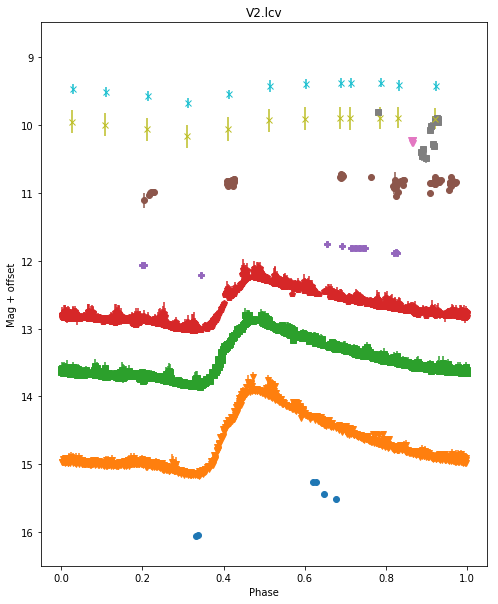

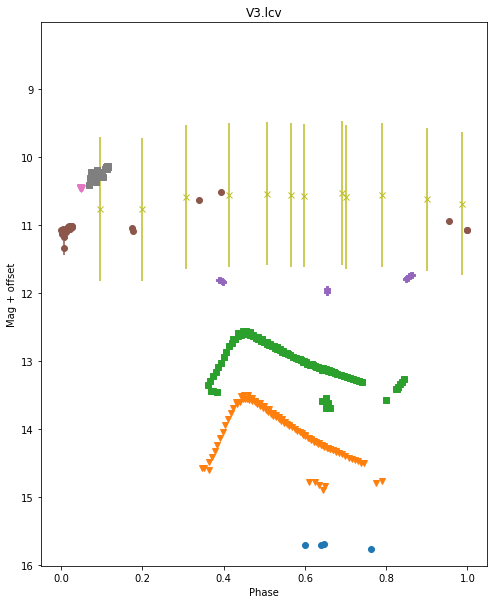

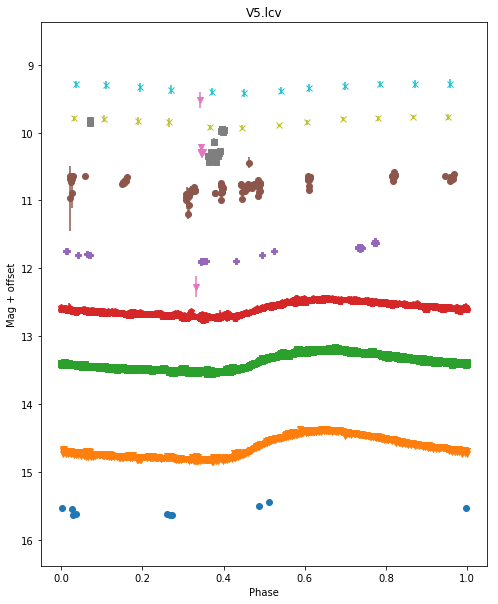

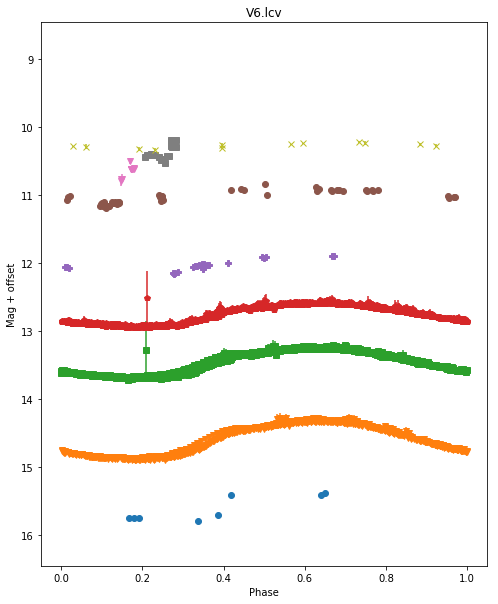

...

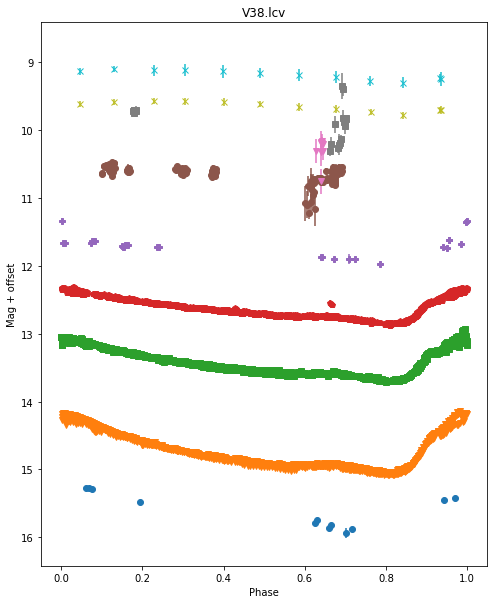

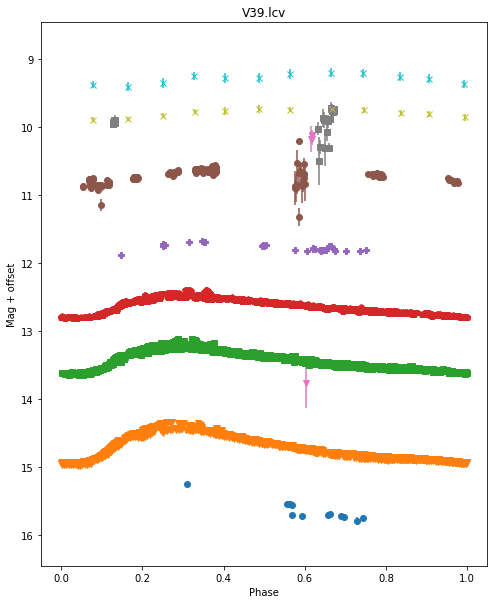

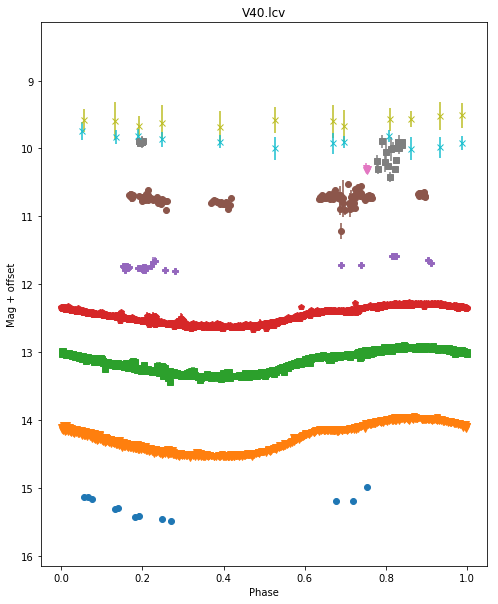

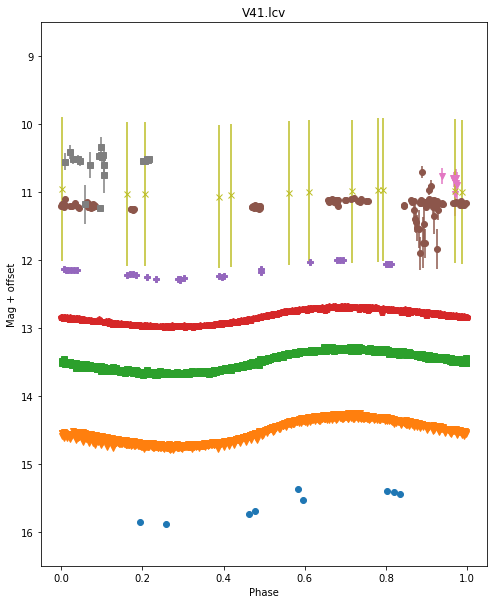

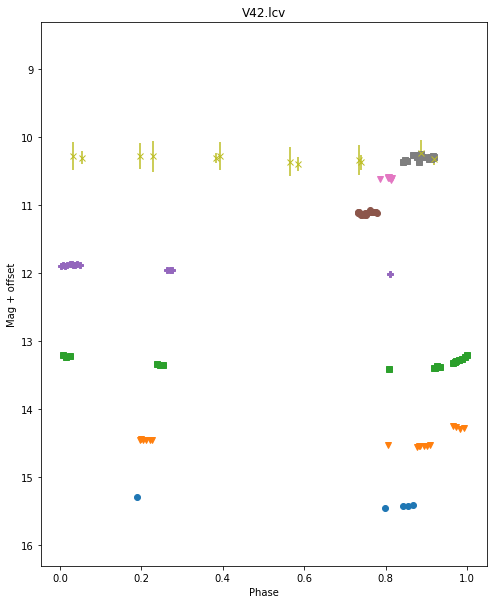

V43  not found.


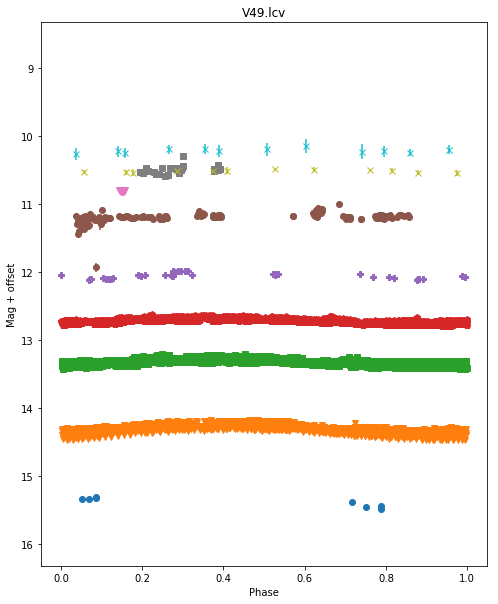

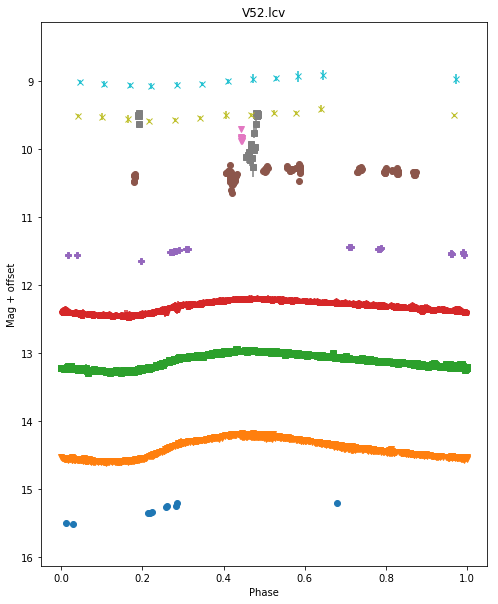

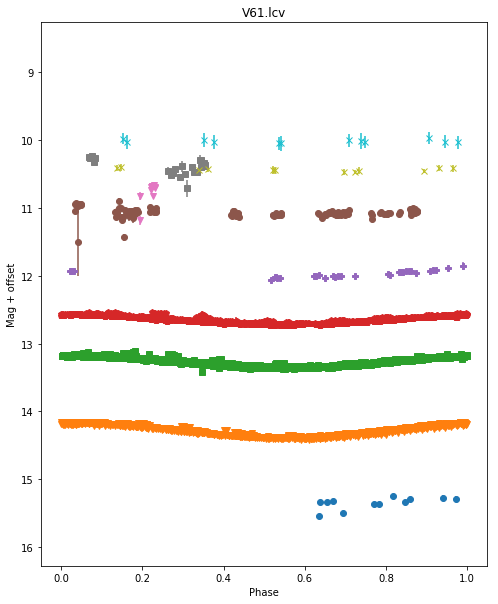

V64  not found.


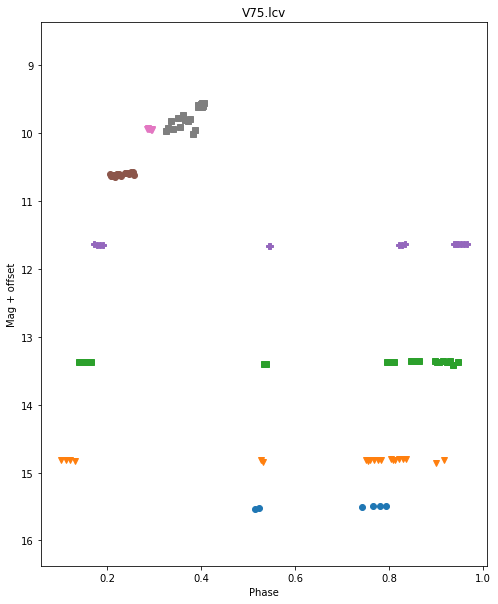

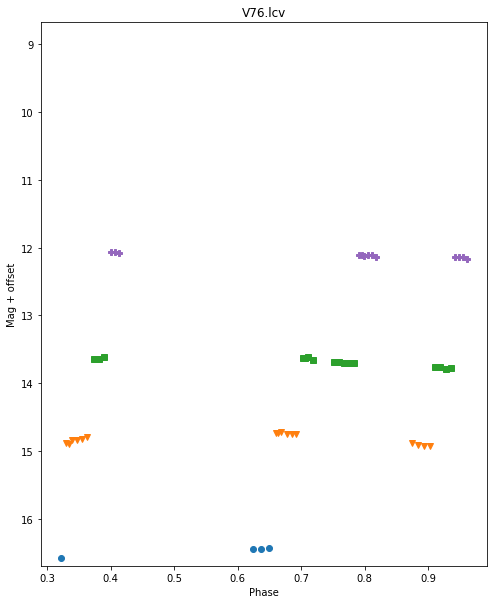

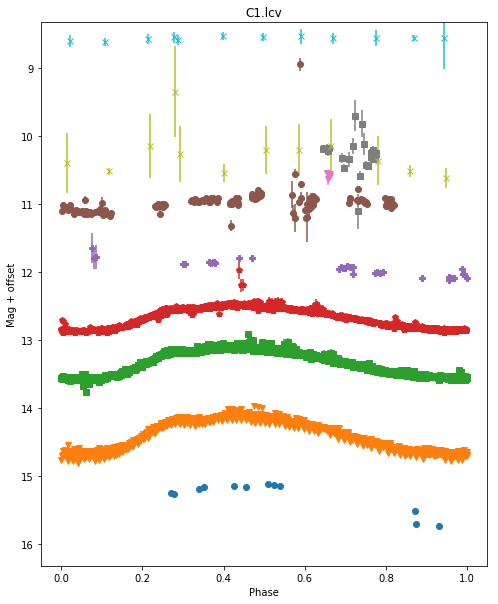

In [17]:
dtype1 = np.dtype([('id', 'S4'), ('cc_period', float), ('new_period', float)])
data = np.loadtxt(folder+target+'-variables.txt', dtype=dtype1, usecols=(0,1,2))
for ind, star in enumerate(data['id']):
    try:
        if np.isnan(data['new_period'][ind]):
            lightcurves.phase_lcv_all_bands(target, star+'.lcv',data['cc_period'][ind], 0, bin_mir=1, data_dir=folder)
        else:
            lightcurves.phase_lcv_all_bands(target, star+'.lcv',data['new_period'][ind], 0, bin_mir=1, data_dir=folder, old=1)
    except:
        print star, ' not found.'
        continue

## Fit light curves

V1
/Volumes/Annie/CRRP/NGC6121/lcvs/V1.phased


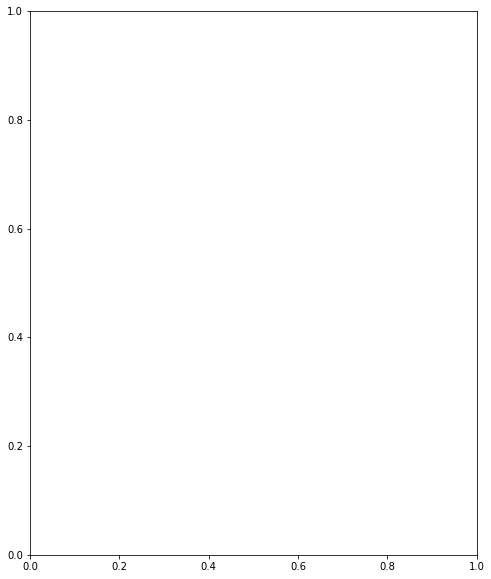

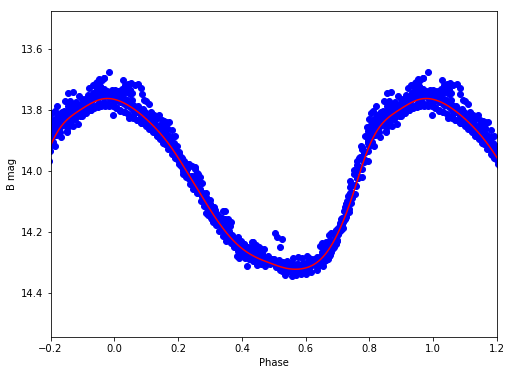

B 14.0284391037 0.55863065532


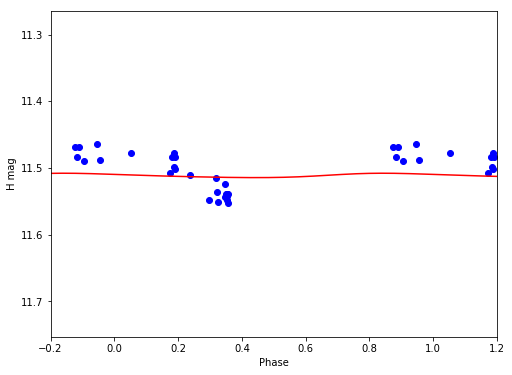

H 11.5113732208 0.00657636630375


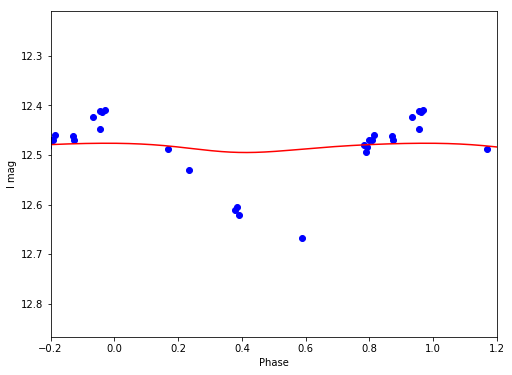

I 12.4841619072 0.0186436120851


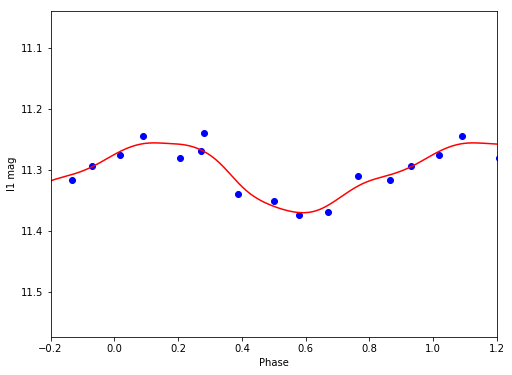

I1 11.3084568188 0.114568713252


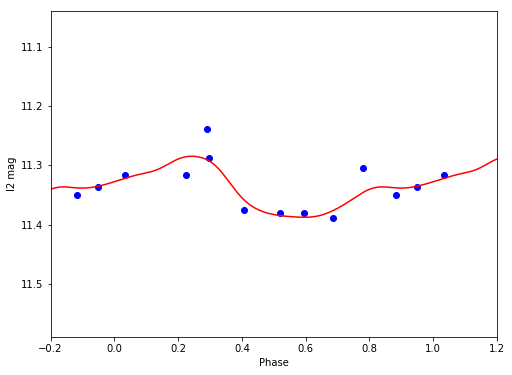

I2 11.3393840724 0.102887810195


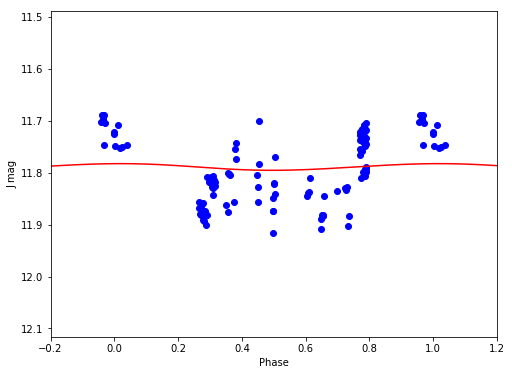

J 11.788953241 0.0128682061413


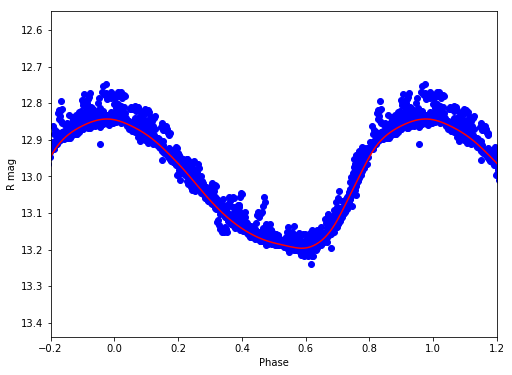

R 13.0128253857 0.353853920625


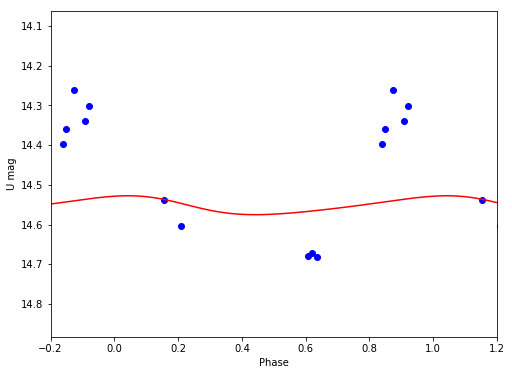

U 14.5526646745 0.0477101141126


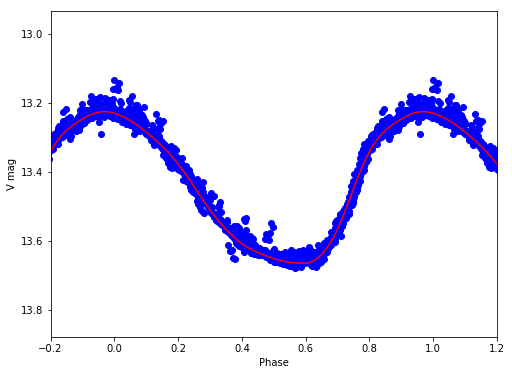

V 13.4353848614 0.43976334192
V2
/Volumes/Annie/CRRP/NGC6121/lcvs/V2.phased


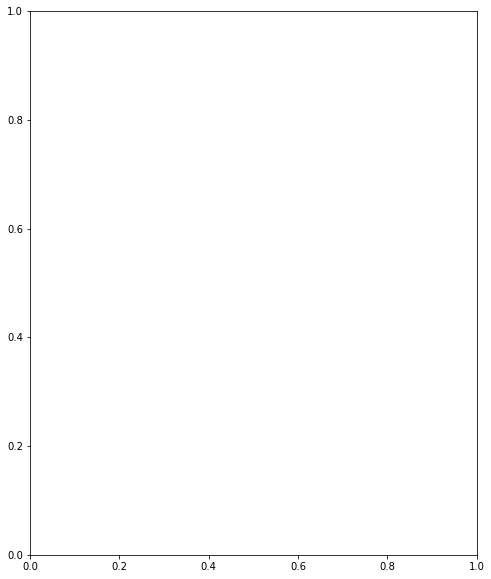

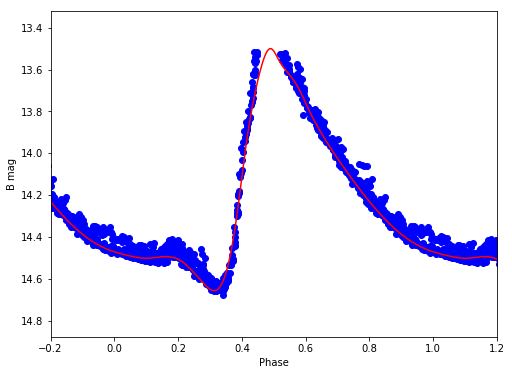

B 14.1578422284 1.15695131967


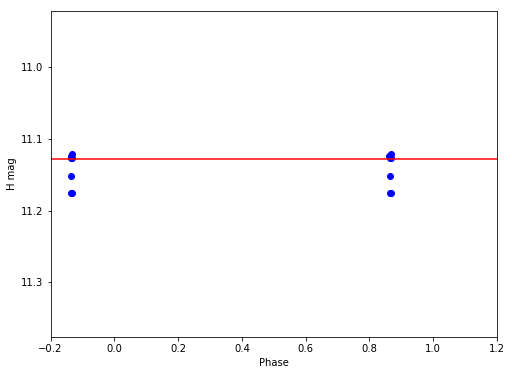

H 11.1279536837 1.9025584864e-05


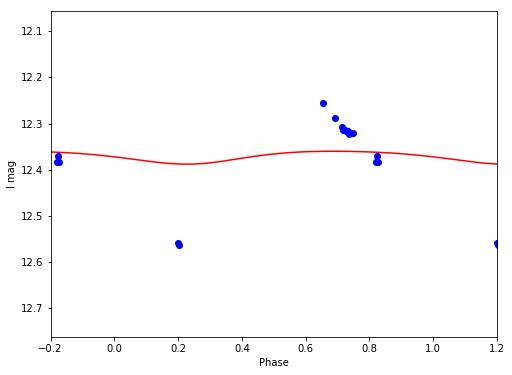

I 12.3716508697 0.0280510966479


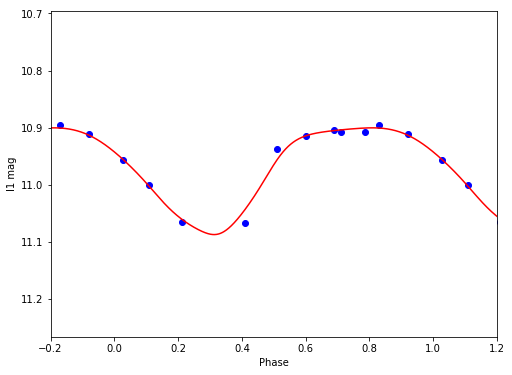

I1 10.970736278 0.187192767775


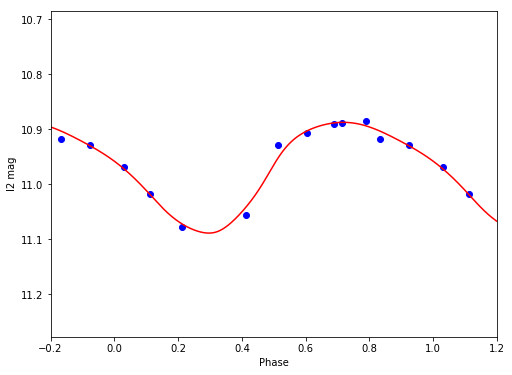

I2 10.9724570454 0.201383833083


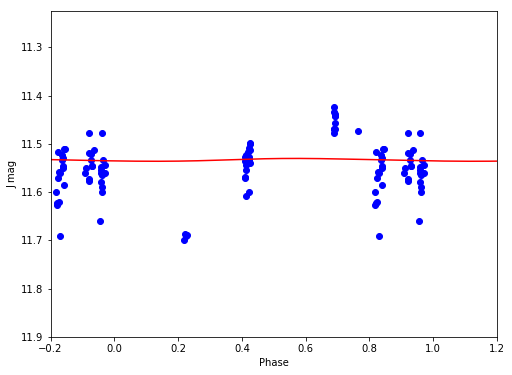

J 11.5333578433 0.00587569595723


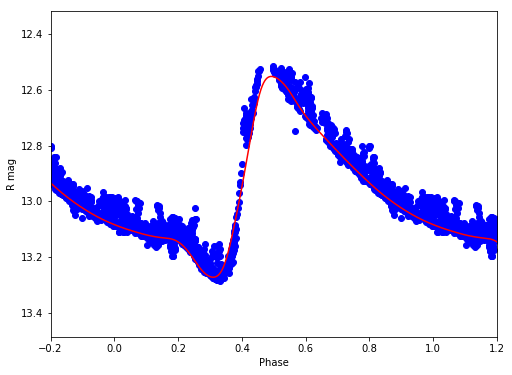

R 12.9375498125 0.719179668535


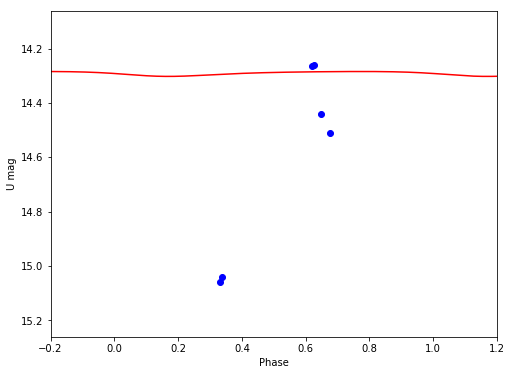

U 14.2905975461 0.018027589219


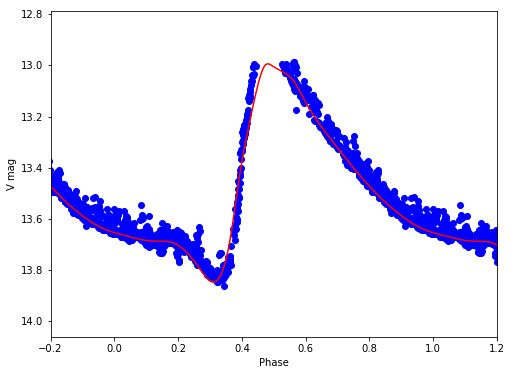

V 13.4479323408 0.852429611674
V3
/Volumes/Annie/CRRP/NGC6121/lcvs/V3.phased


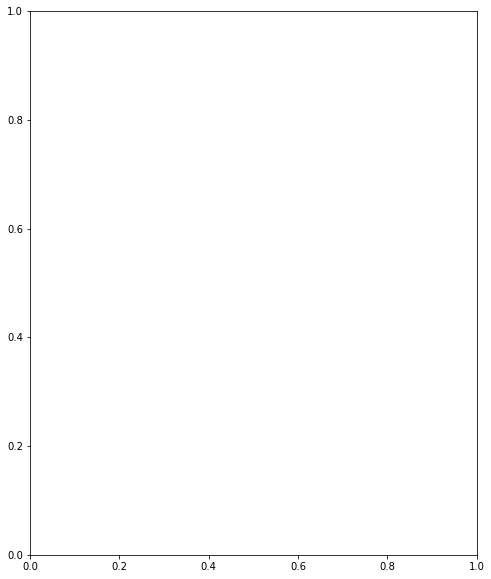

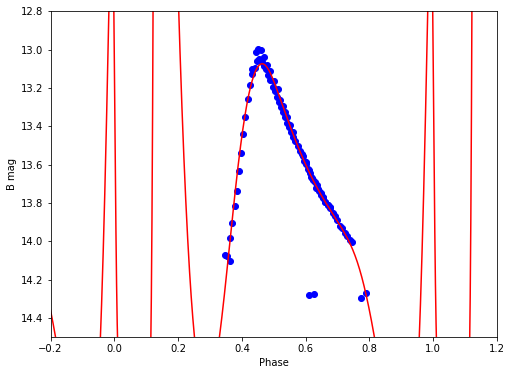

B 11.6242637394 7.87936675367


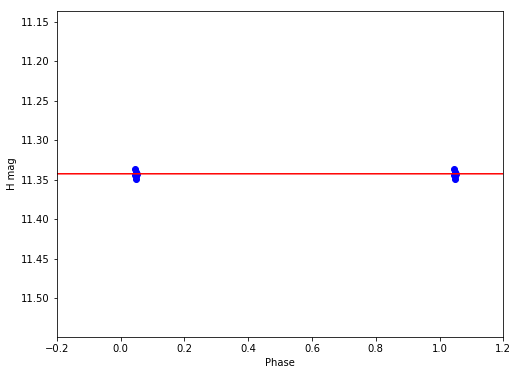

H 11.3425910479 9.61966406798e-06


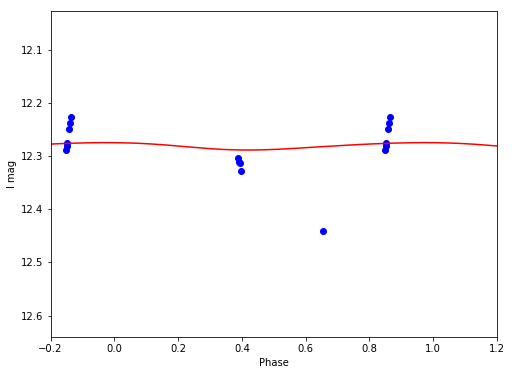

I 12.2809654348 0.0139430482672


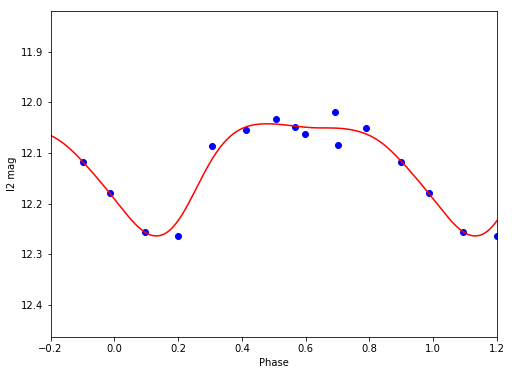

I2 12.1151120855 0.221408728417


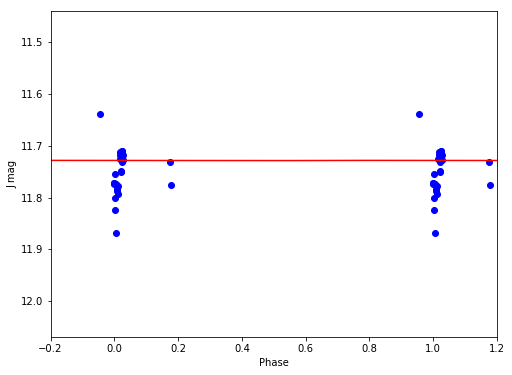

J 11.7284352917 0.000464573682185


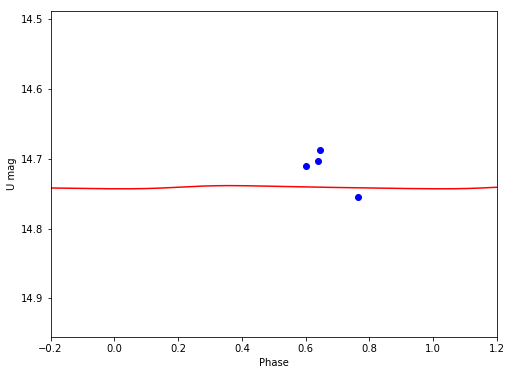

U 14.7409854418 0.00455686888114


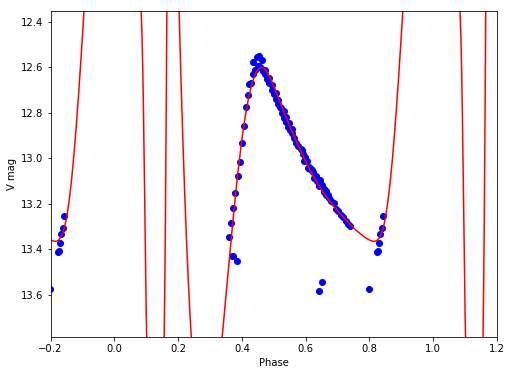

V 12.0857804548 4.91031263589
V5
/Volumes/Annie/CRRP/NGC6121/lcvs/V5.phased


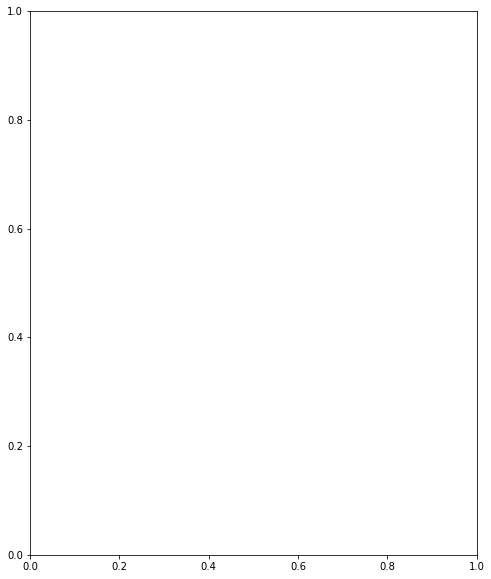

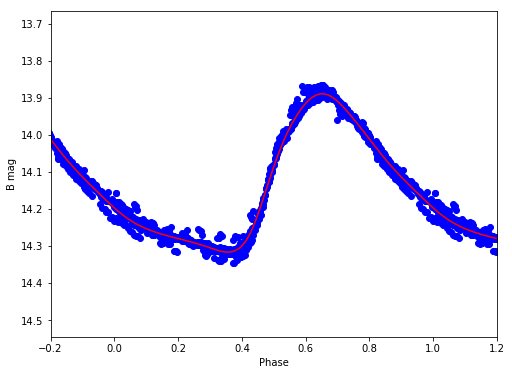

B 14.1267507828 0.426575909


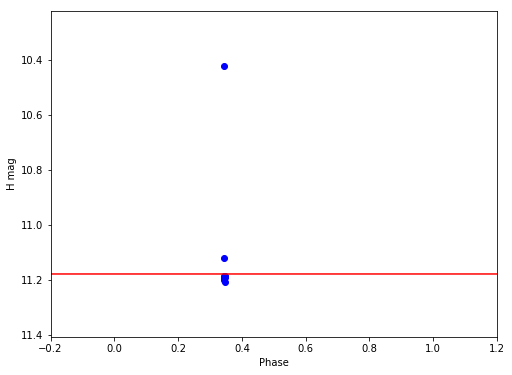

H 11.1783612678 6.49347557005e-05


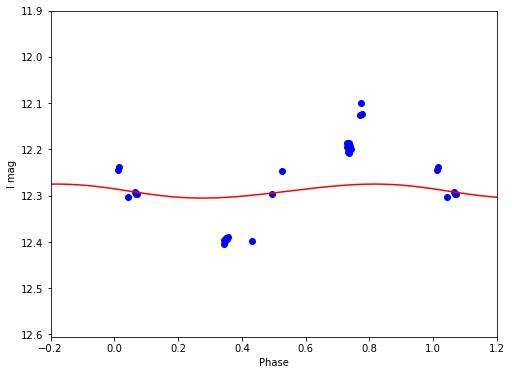

I 12.2899792178 0.0302650117376


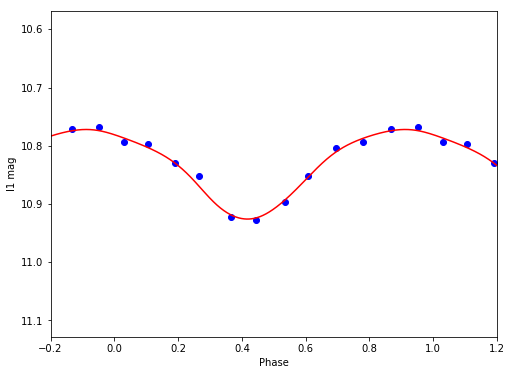

I1 10.8350103529 0.15380709008


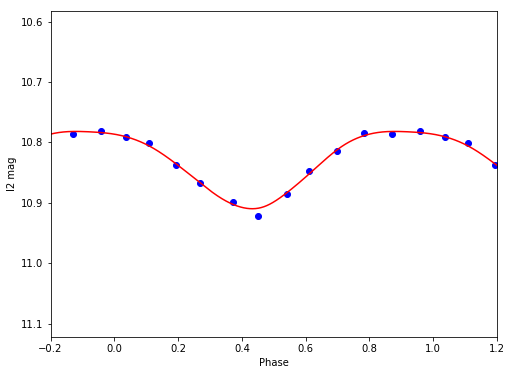

I2 10.83429062 0.127973669271


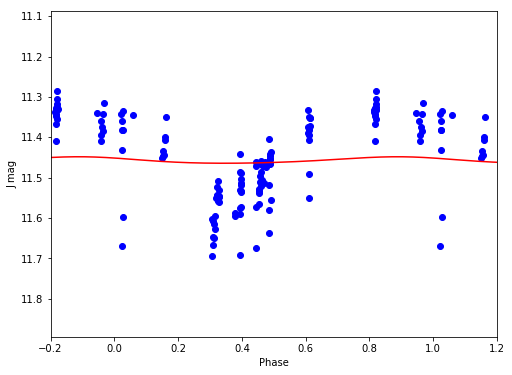

J 11.4570224174 0.0160634912311


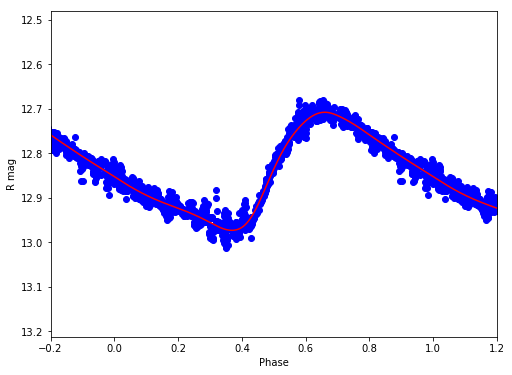

R 12.8396469375 0.265344661933


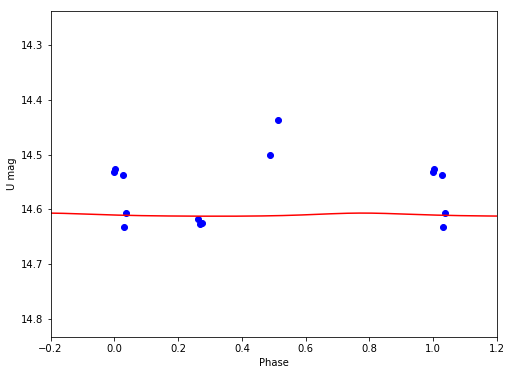

U 14.6102301583 0.00569270247441


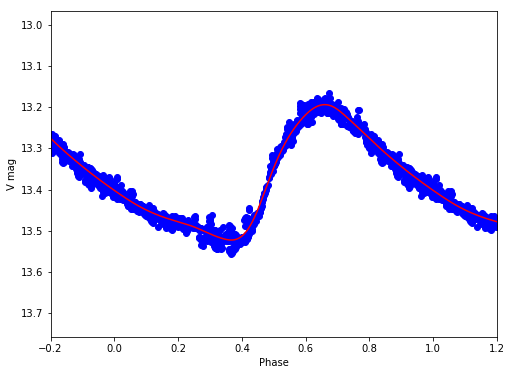

V 13.3685953678 0.328340323357
V6
/Volumes/Annie/CRRP/NGC6121/lcvs/V6.phased


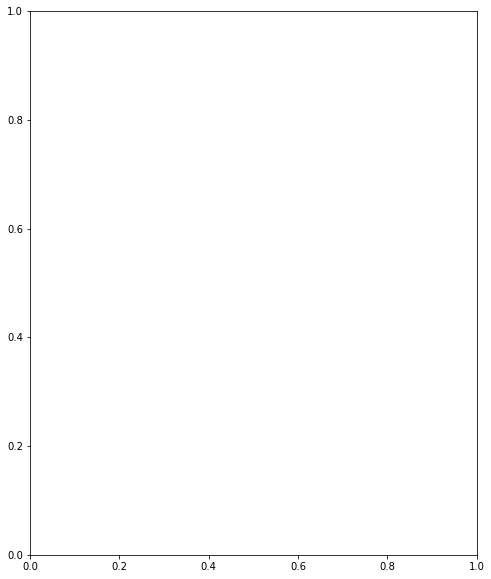

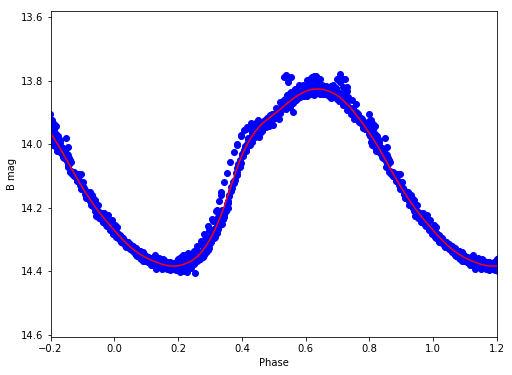

B 14.0846379216 0.55761954828


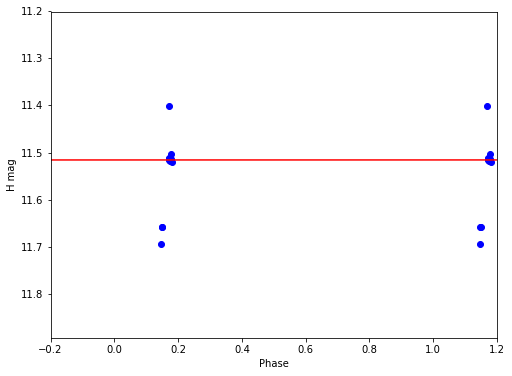

H 11.5156399266 8.28347362951e-05


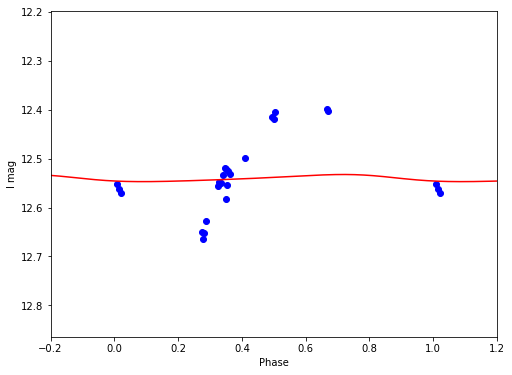

I 12.5405491659 0.0145697139716


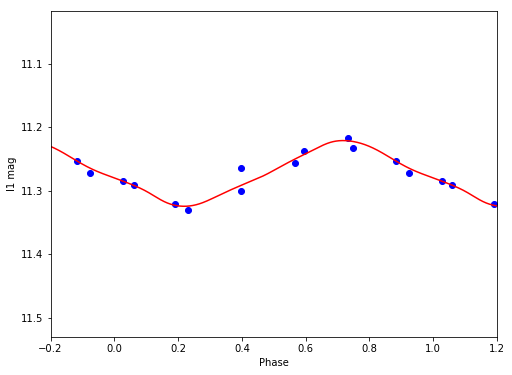

I1 11.2722268183 0.103536804097


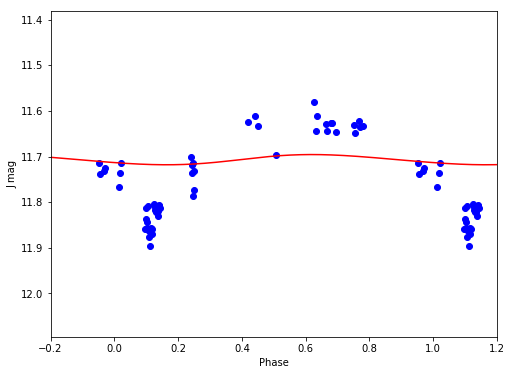

J 11.7067632565 0.0223859675543


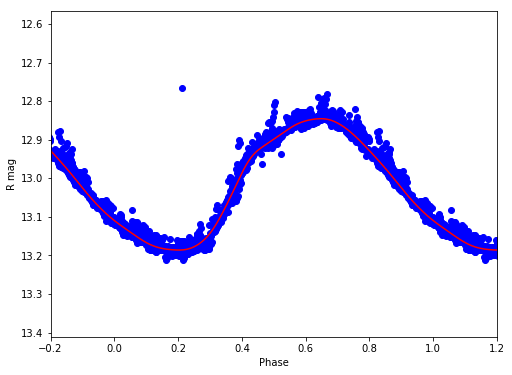

R 13.0078092713 0.340655060039


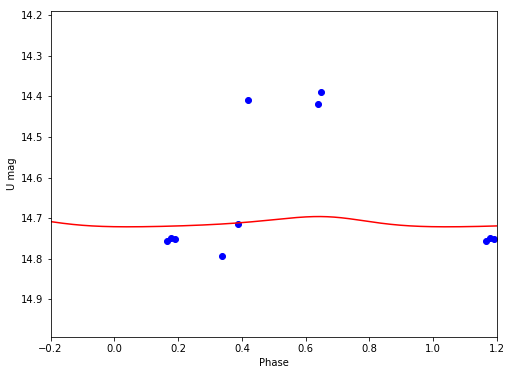

U 14.7111624646 0.0252532888771


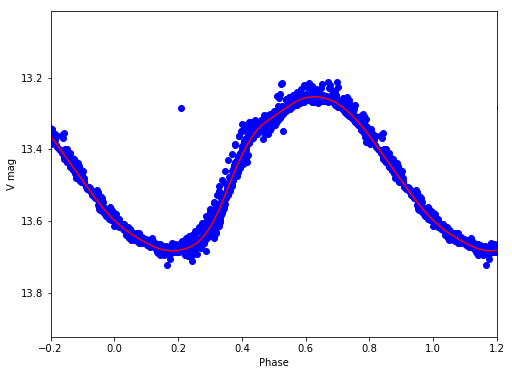

V 13.4547907649 0.429631433854
V7
/Volumes/Annie/CRRP/NGC6121/lcvs/V7.phased


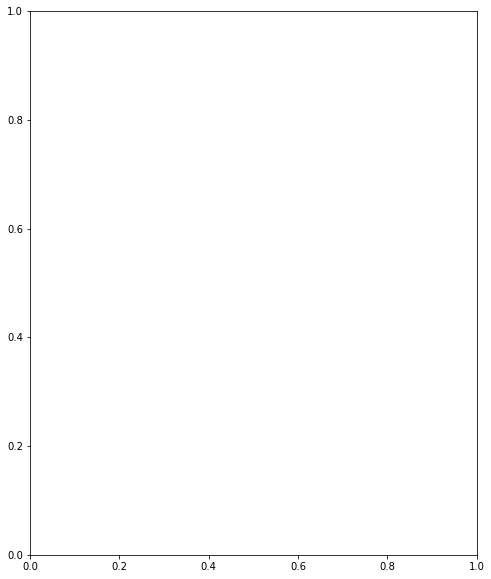

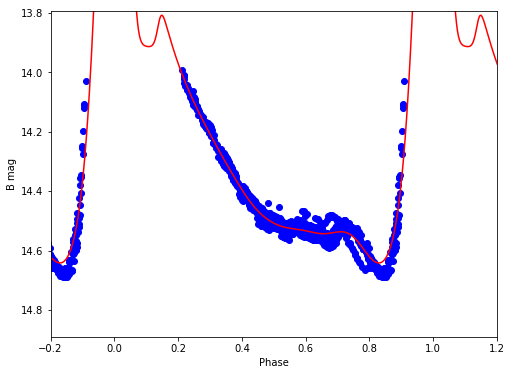

B 14.1266911101 1.91018522314


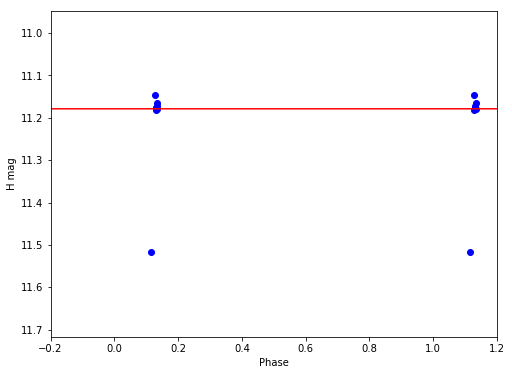

H 11.1787074134 7.2039036553e-05


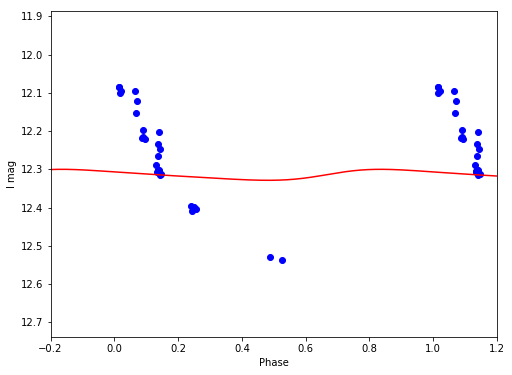

I 12.3148332088 0.0287250922164


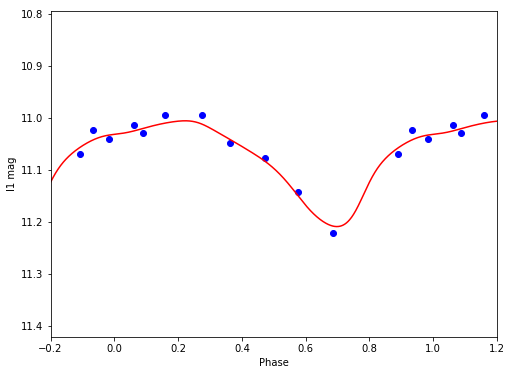

I1 11.0761011779 0.20299854041


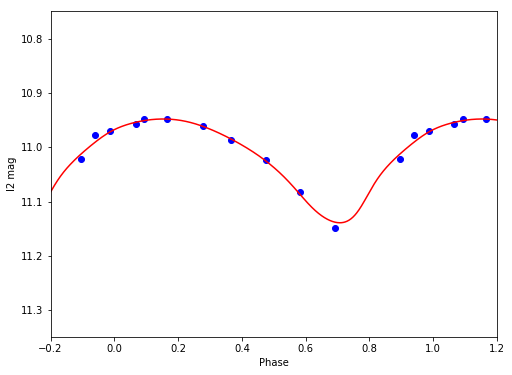

I2 11.0177248242 0.191211324612


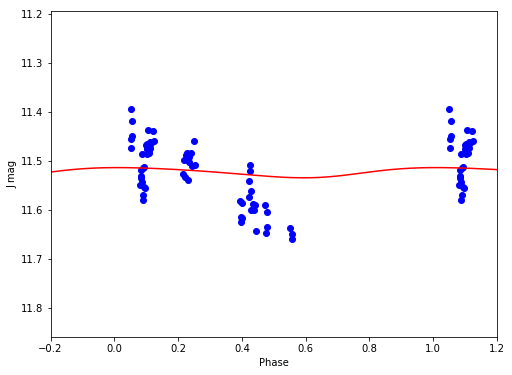

J 11.5224868959 0.0208302835639


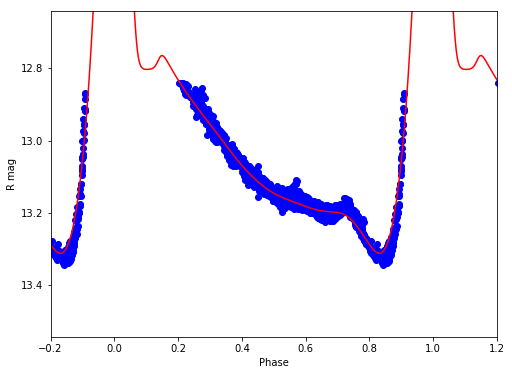

R 12.9295006753 1.37865131096


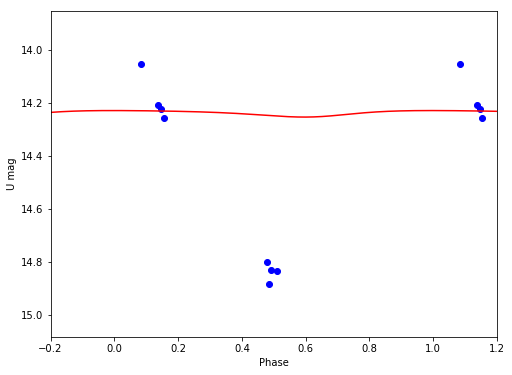

U 14.2366527437 0.0246079354746


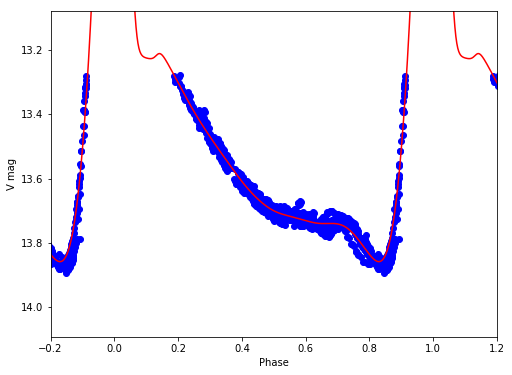

V 13.3902063354 1.58375262995
V8
/Volumes/Annie/CRRP/NGC6121/lcvs/V8.phased


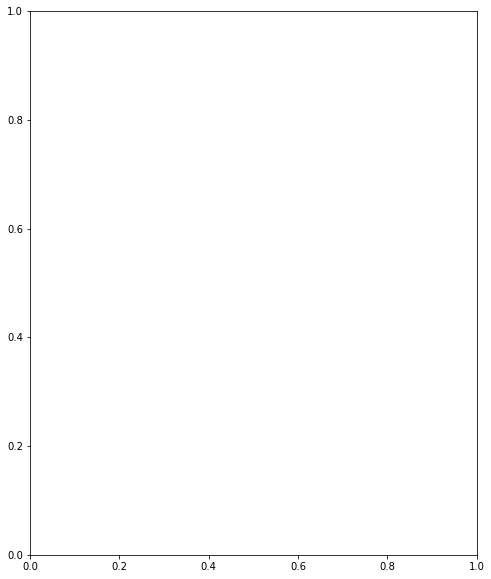

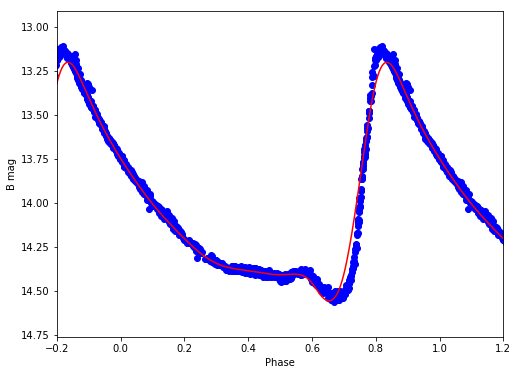

B 13.9857280066 1.35733055031


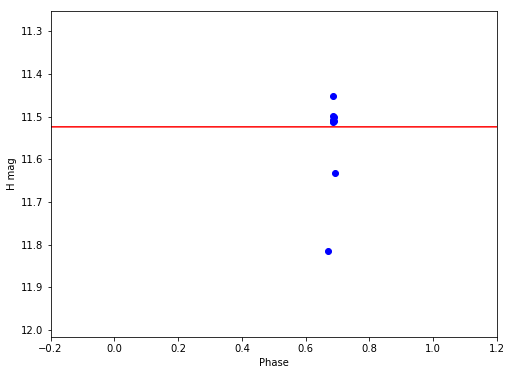

H 11.5241886714 0.000147031831389


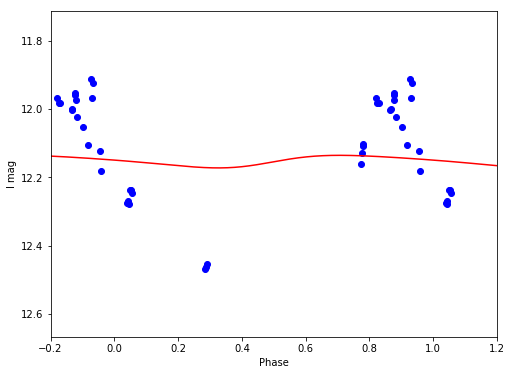

I 12.1519440225 0.0368965487561


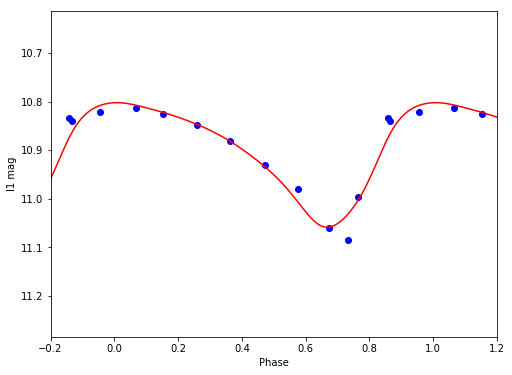

I1 10.8985522365 0.256594401937


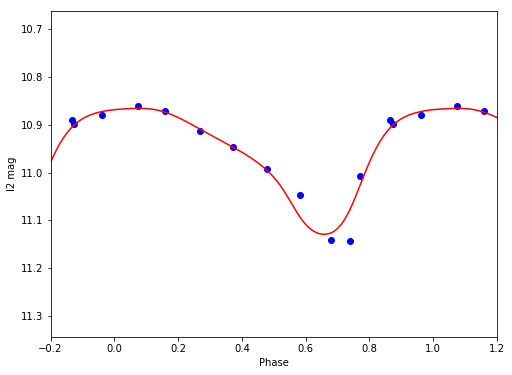

I2 10.9564948794 0.26294938179


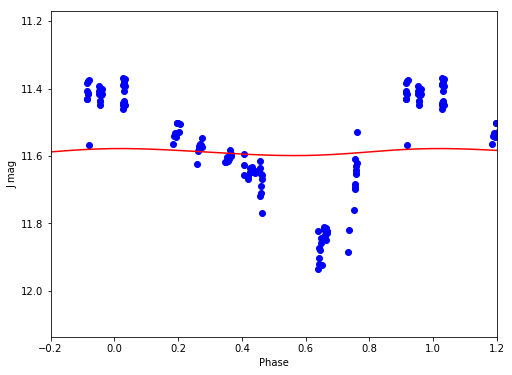

J 11.5883477719 0.0208078043859


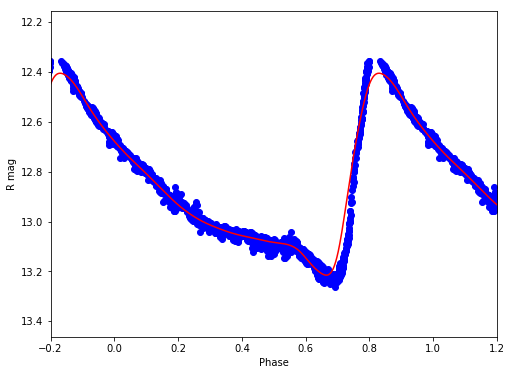

R 12.8499782031 0.809841029131


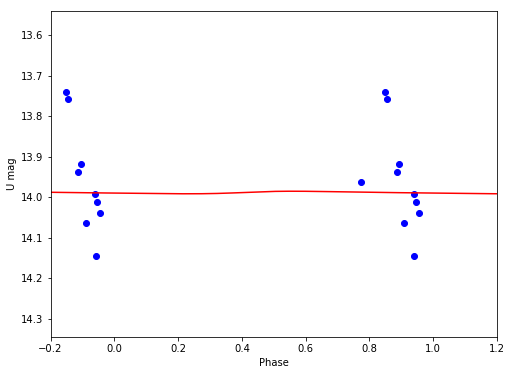

U 13.9886309241 0.00633363779528


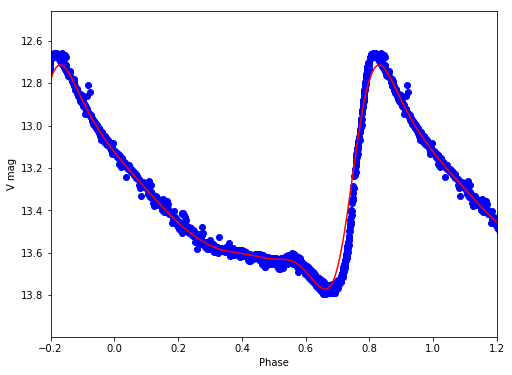

V 13.3218377222 1.05609997996
V9
/Volumes/Annie/CRRP/NGC6121/lcvs/V9.phased


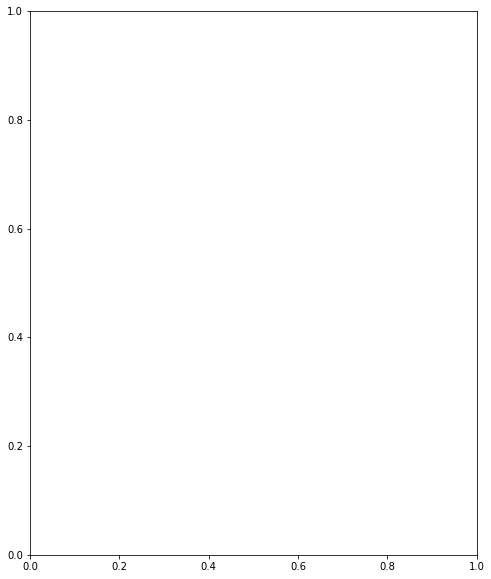

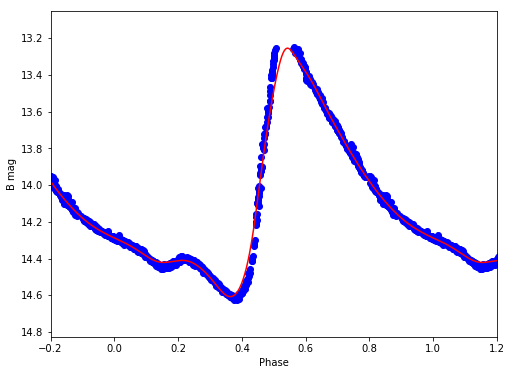

B 14.0027142253 1.35361937419


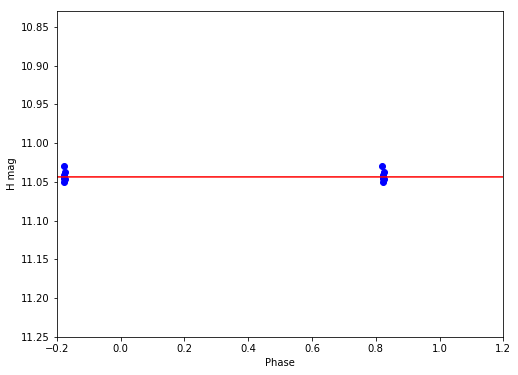

H 11.0436238926 1.63403682052e-06


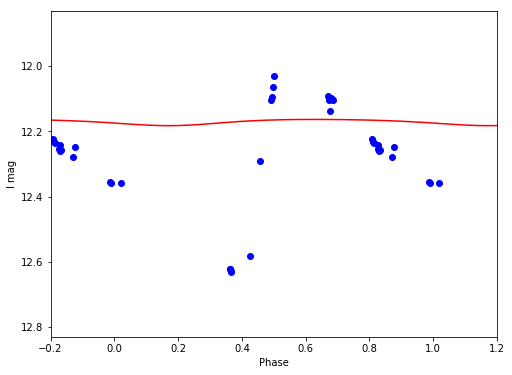

I 12.1707632234 0.0190946896167


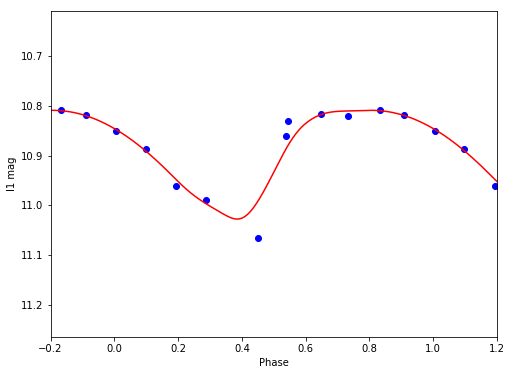

I1 10.8894629487 0.219143083322


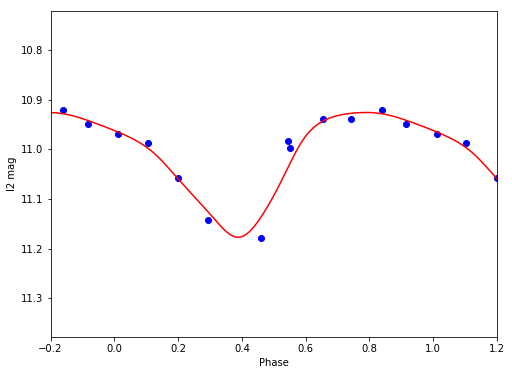

I2 11.0151116804 0.251677594283


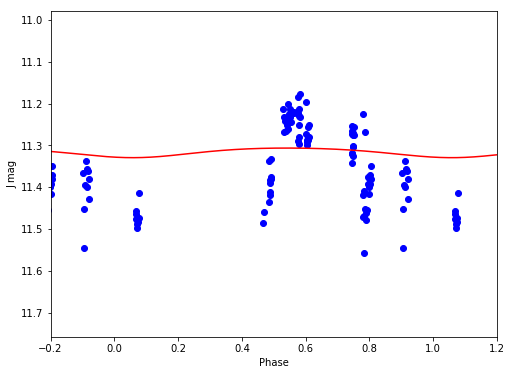

J 11.3159528904 0.0229423749789


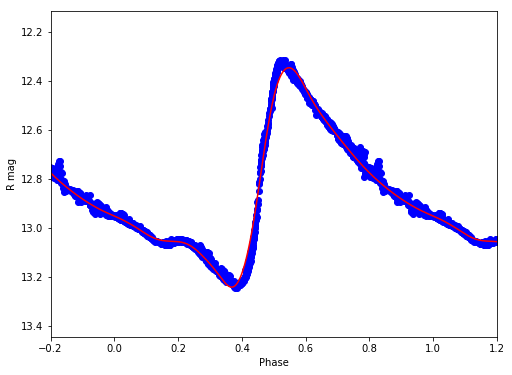

R 12.8231546338 0.897287834103


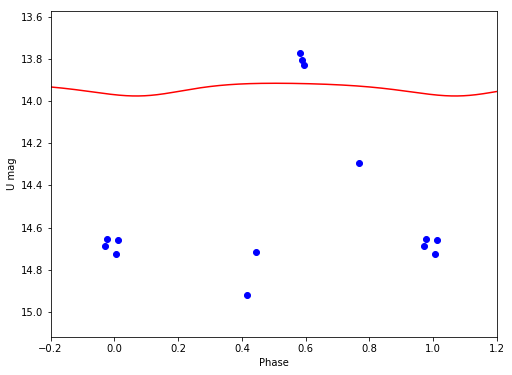

U 13.9379072758 0.0603937639413


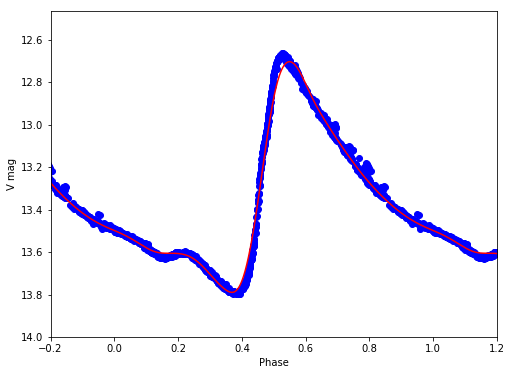

V 13.3072810288 1.08627222143
V10
/Volumes/Annie/CRRP/NGC6121/lcvs/V10.phased


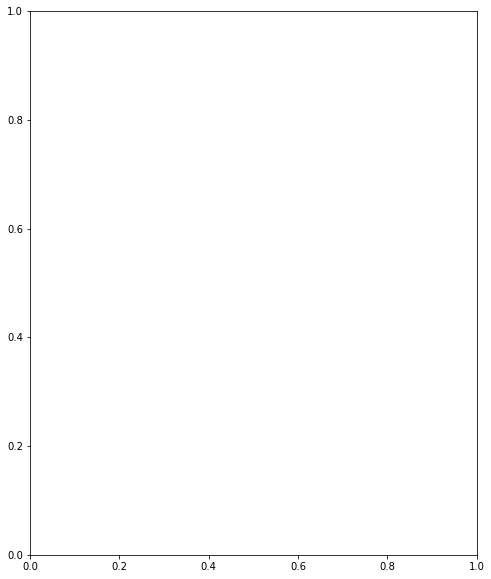

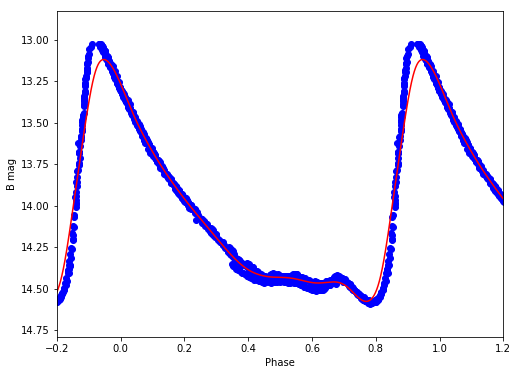

B 13.9709772715 1.45822248112


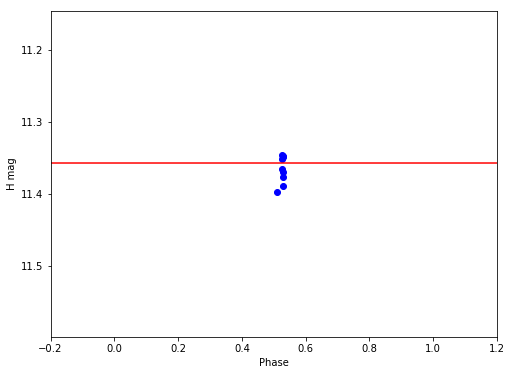

H 11.3571544964 3.29126007692e-06


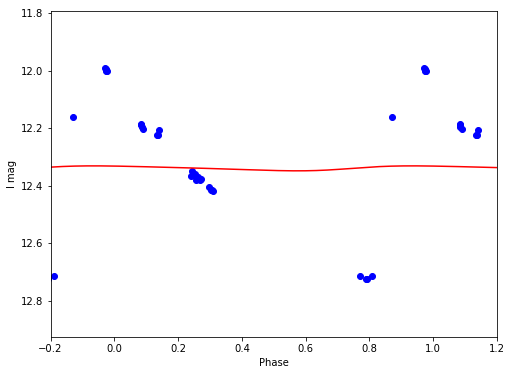

I 12.3393463081 0.0172672886122


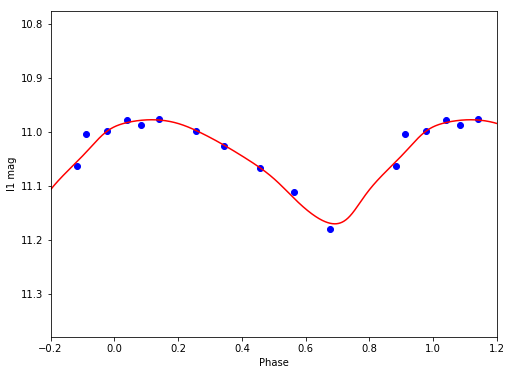

I1 11.0535223754 0.192733717953


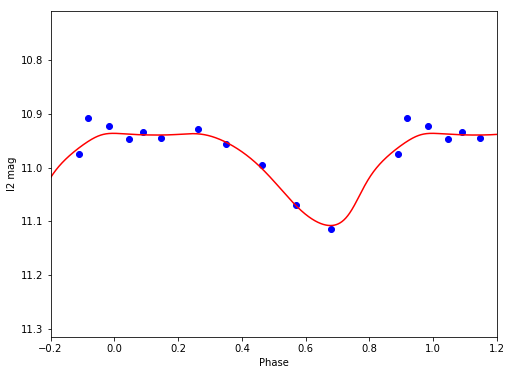

I2 10.9905222422 0.171576104515


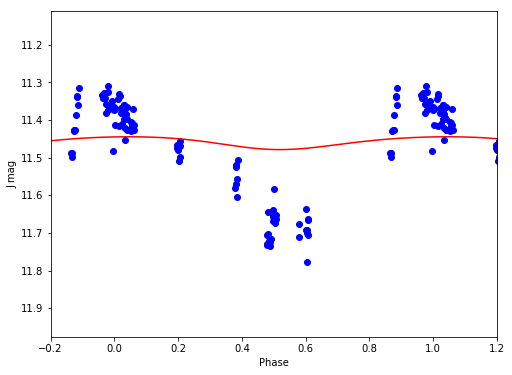

J 11.45897798 0.0341511256939


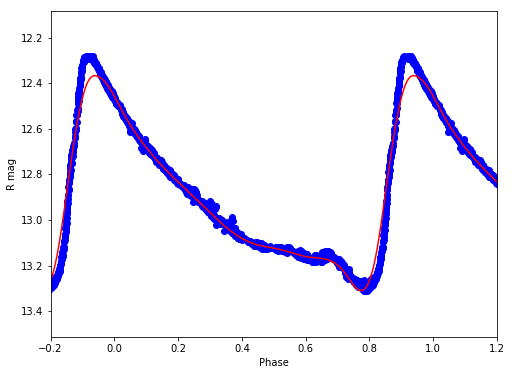

R 12.8860733774 0.942312250467


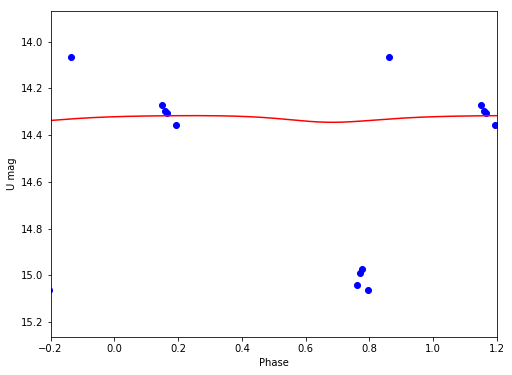

U 14.32744987 0.028520057887


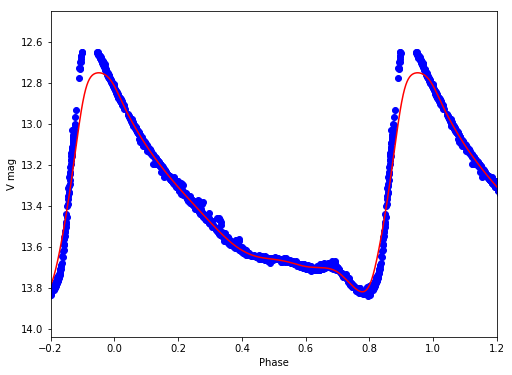

V 13.3566692221 1.06838758847
V11
/Volumes/Annie/CRRP/NGC6121/lcvs/V11.phased


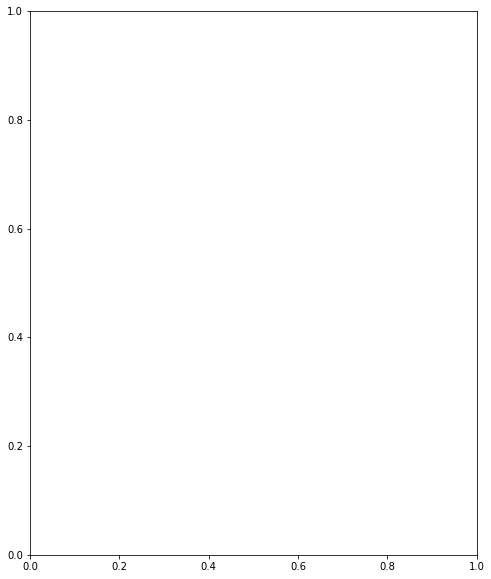

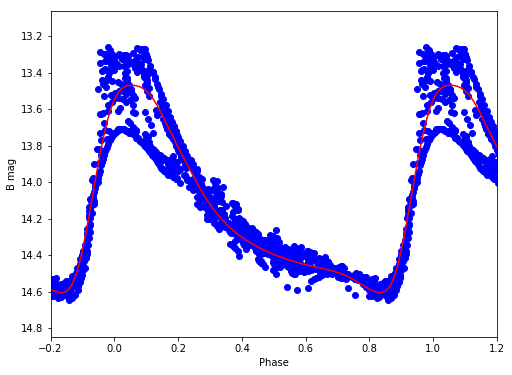

B 14.087664742 1.13629544052


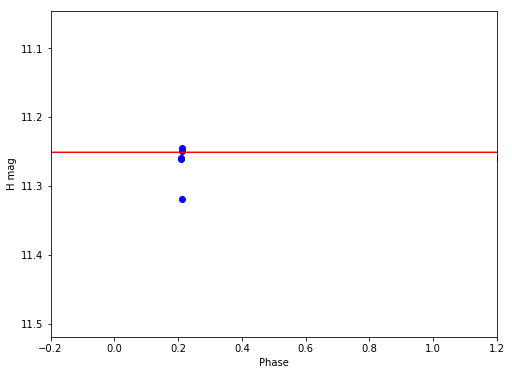

H 11.2508746954 1.20846084908e-05


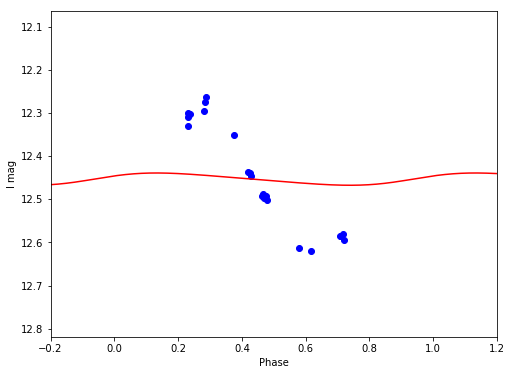

I 12.4530717273 0.0284867883186


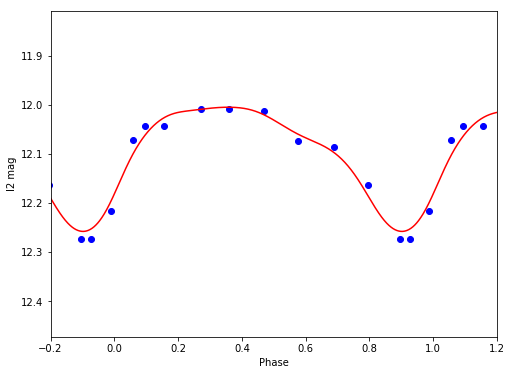

I2 12.0877481171 0.25320086199


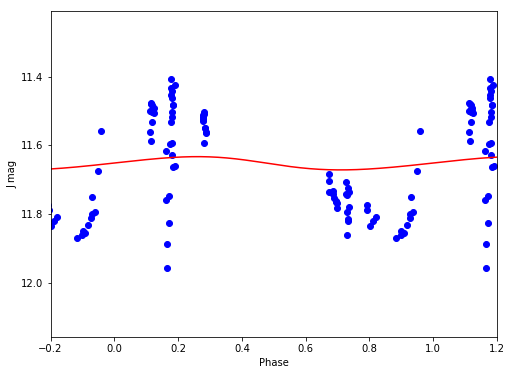

J 11.652341481 0.0386457323284


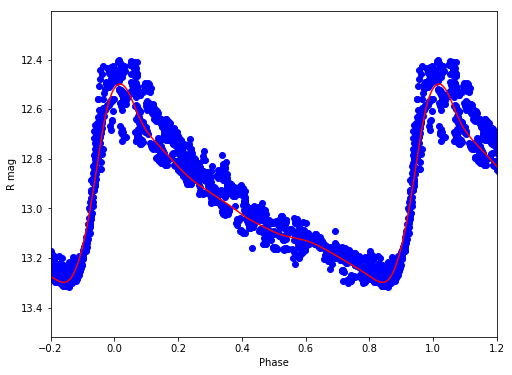

R 12.9588112453 0.799150798752


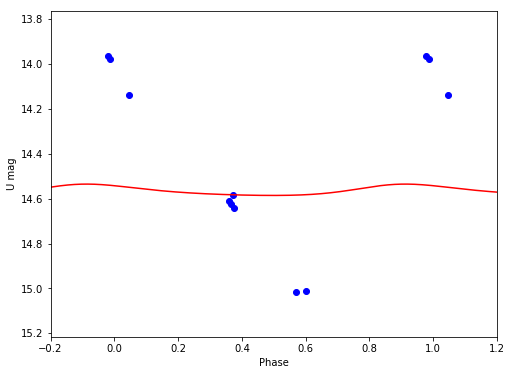

U 14.5659984964 0.0504940739589


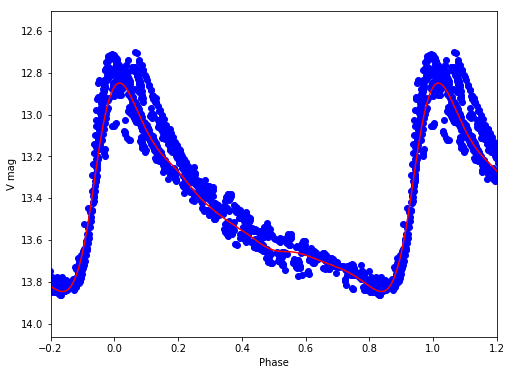

V 13.4320265441 0.997575155959
V12
/Volumes/Annie/CRRP/NGC6121/lcvs/V12.phased


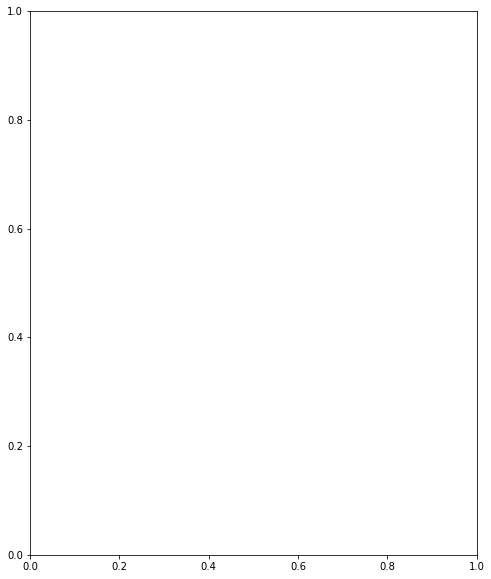

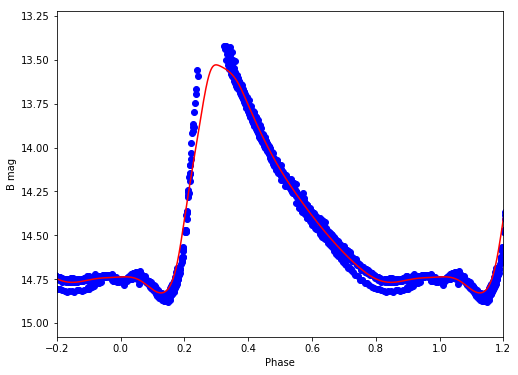

B 14.2958571361 1.29631070095


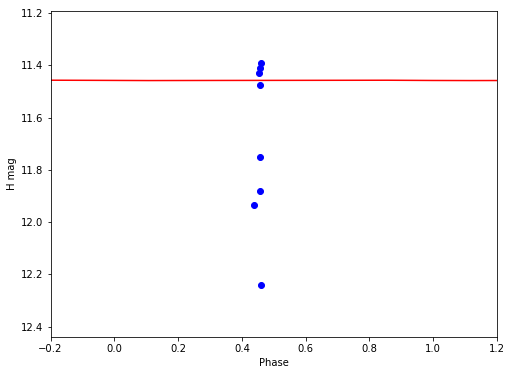

H 11.4578390539 0.00135400515081


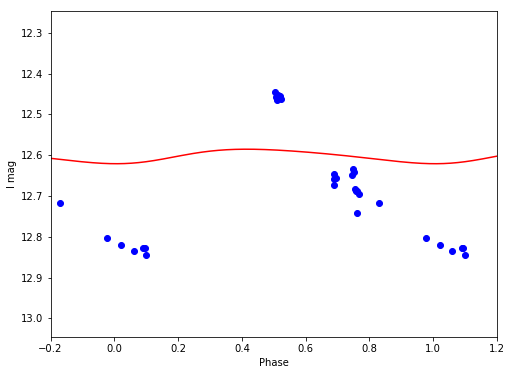

I 12.6017598618 0.0355507087442


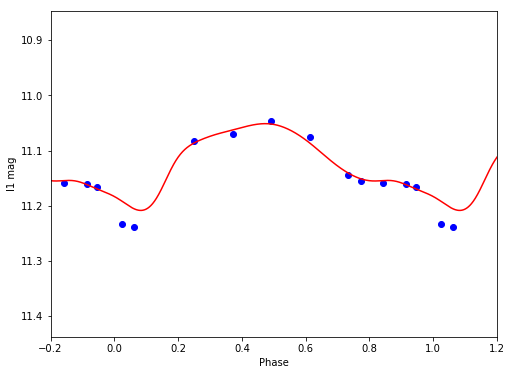

I1 11.1197468307 0.157496840659


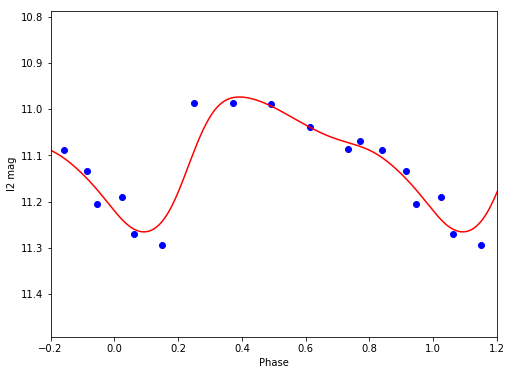

I2 11.0937041797 0.292344568577


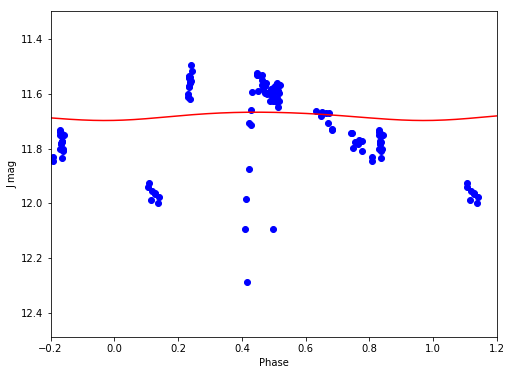

J 11.6813070736 0.0302919418158


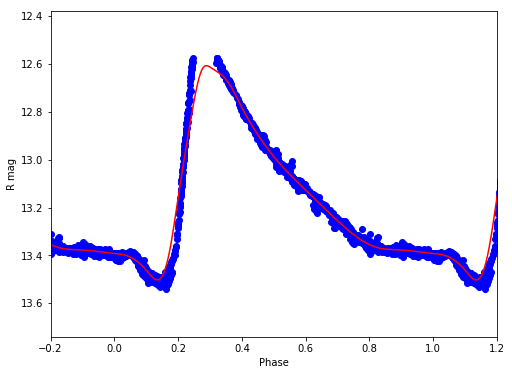

R 13.1151586603 0.895990988754


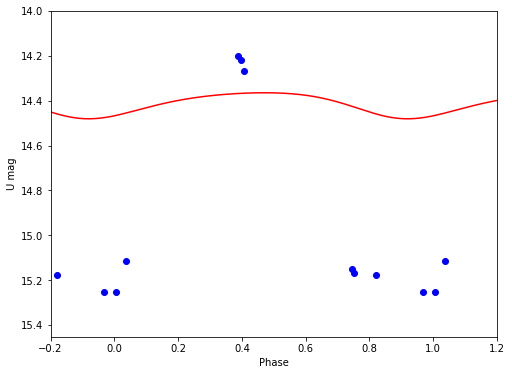

U 14.4113407367 0.115980564508


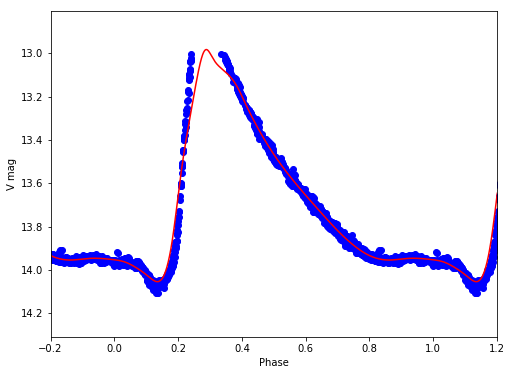

V 13.6141760591 1.0711449776
V14
/Volumes/Annie/CRRP/NGC6121/lcvs/V14.phased


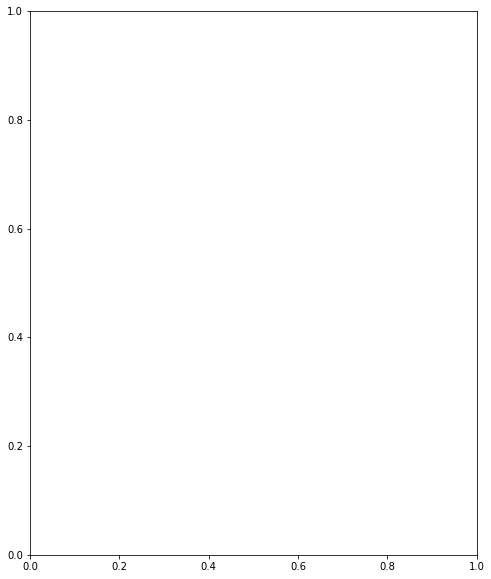

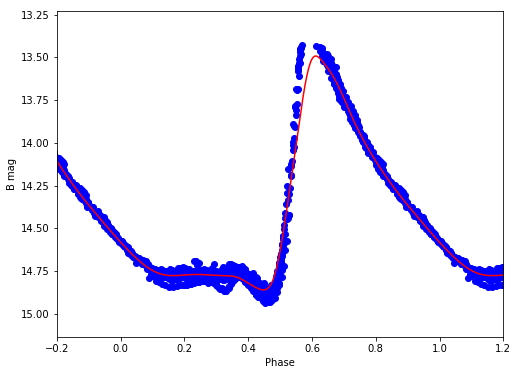

B 14.3127231992 1.36730431959


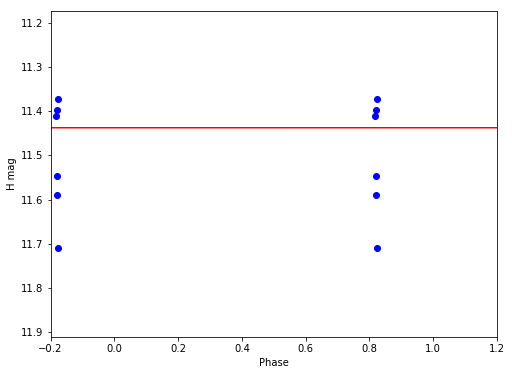

H 11.4376201058 2.64231600546e-05


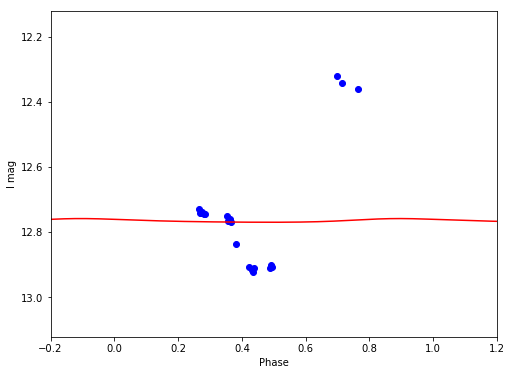

I 12.7643424333 0.0113468355303


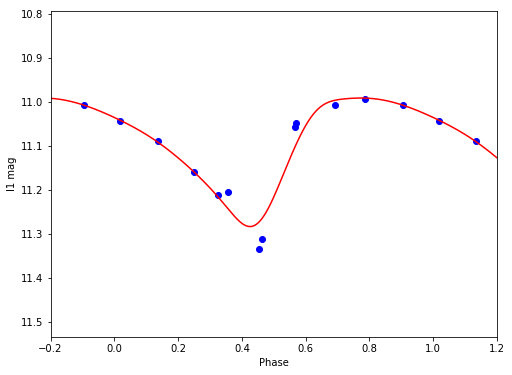

I1 11.0926176808 0.292369970944


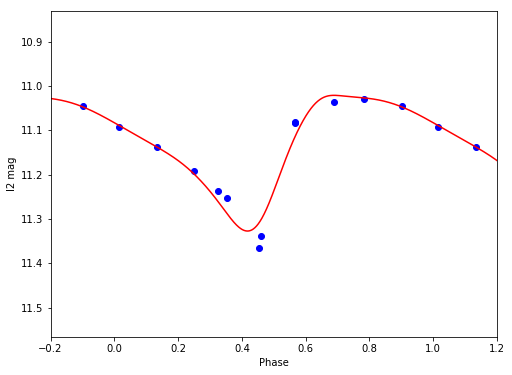

I2 11.129362768 0.306256419689


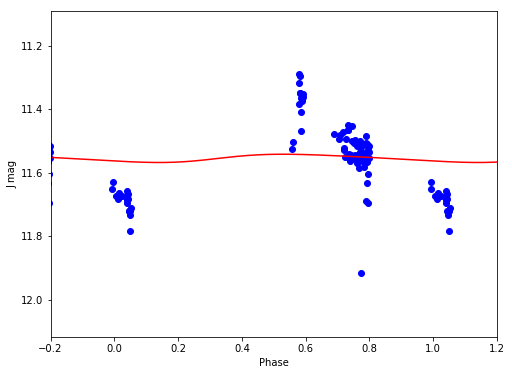

J 11.5540882547 0.0260092832477


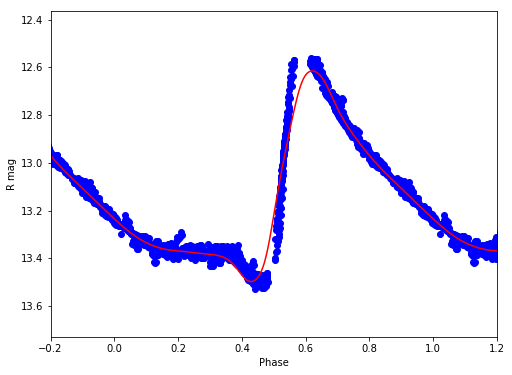

R 13.1162165287 0.882853908106


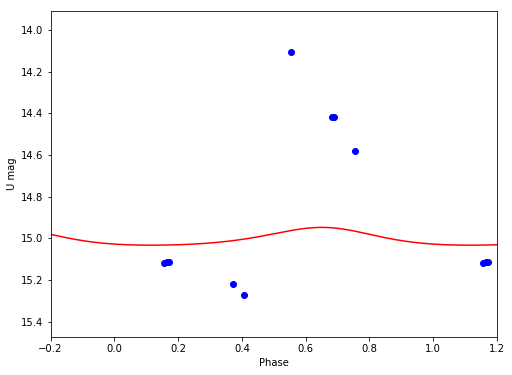

U 14.9987006964 0.0853570182191


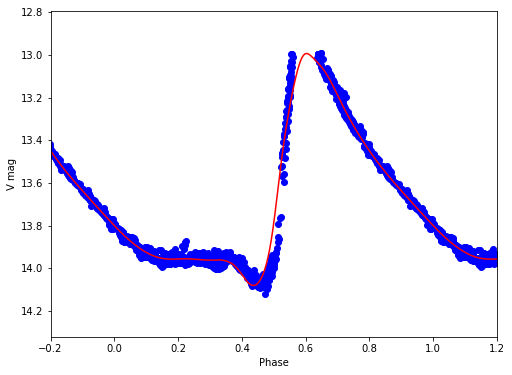

V 13.6163945095 1.08743646415
V15
/Volumes/Annie/CRRP/NGC6121/lcvs/V15.phased


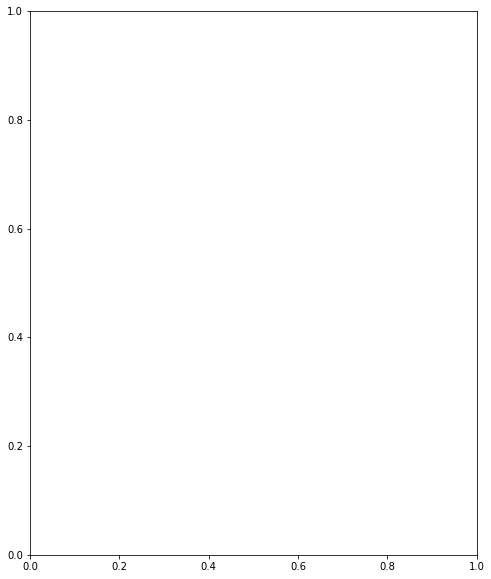

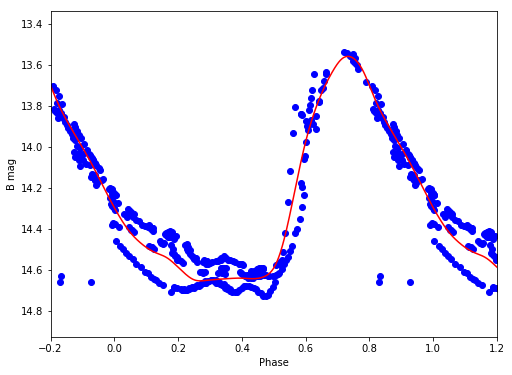

B 14.1830552943 1.09370116506


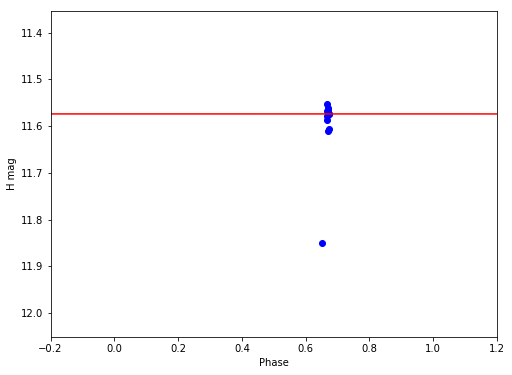

H 11.5740622123 0.000123002611392


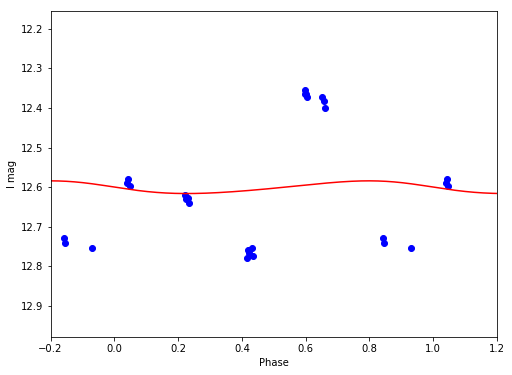

I 12.6007459046 0.0320686729462


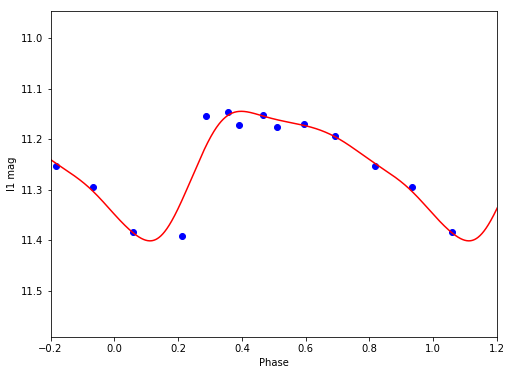

I1 11.2454568616 0.256150605398


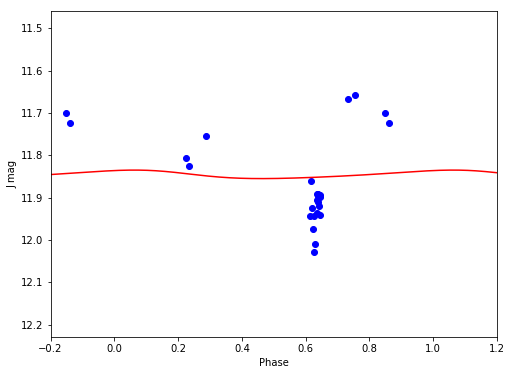

J 11.8459362001 0.0201037797951


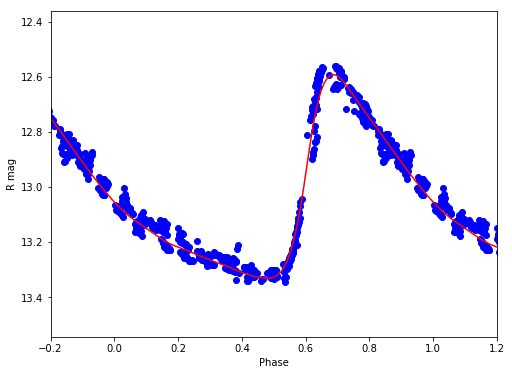

R 13.0243220475 0.738756577975


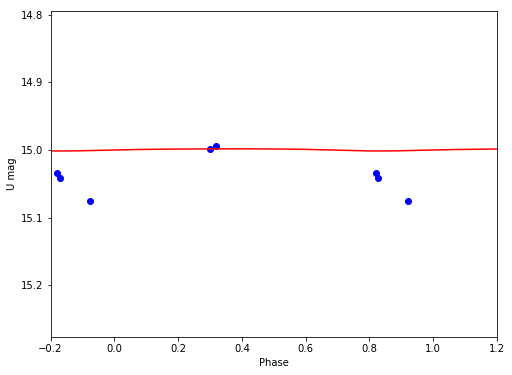

U 14.9994016481 0.00317635518934


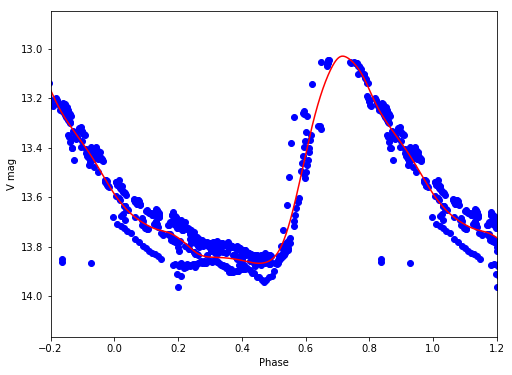

V 13.5247108191 0.835816807194
V16
/Volumes/Annie/CRRP/NGC6121/lcvs/V16.phased


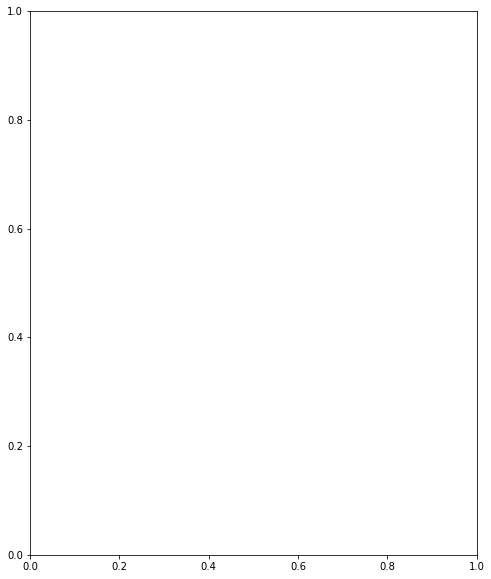

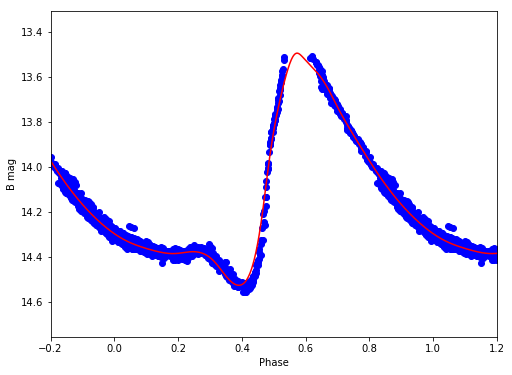

B 14.071359712 1.03342324784


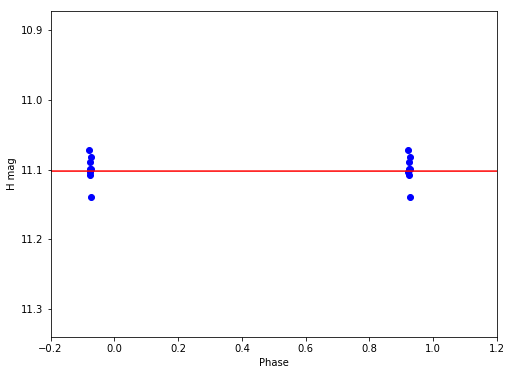

H 11.1022121823 4.61970135834e-05


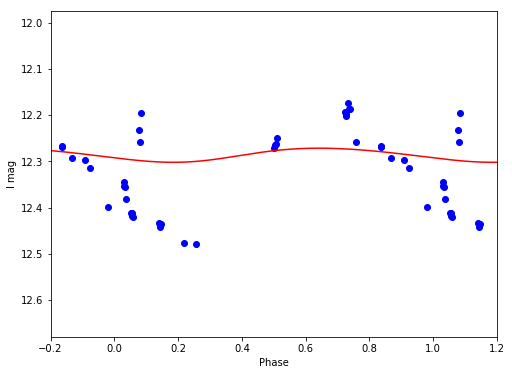

I 12.2856878448 0.0305257493739


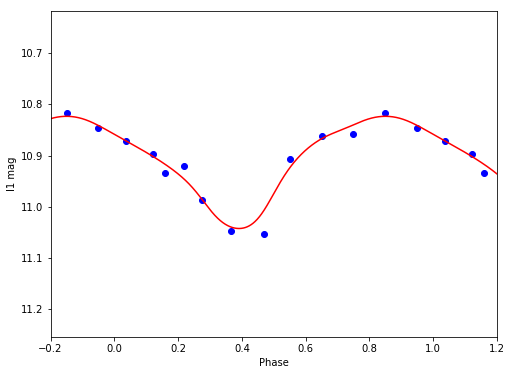

I1 10.9085635927 0.219107987918


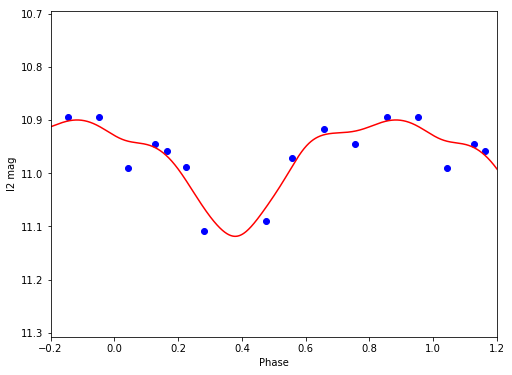

I2 10.9765958868 0.219415476829


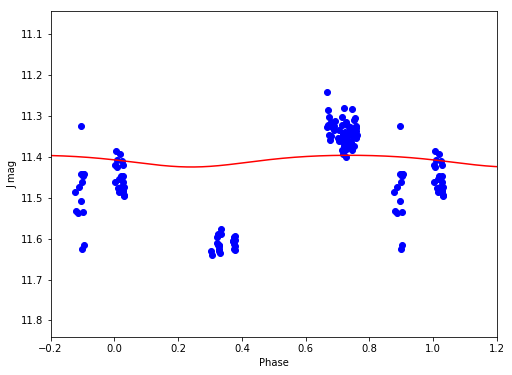

J 11.4087007874 0.0285811165563


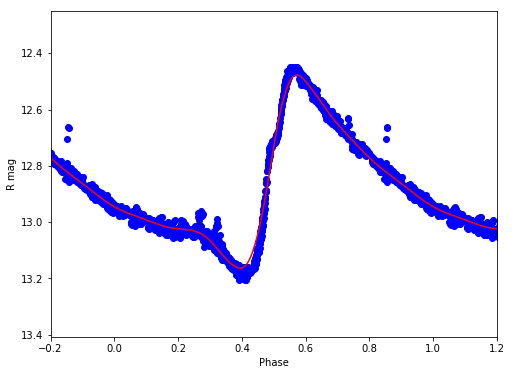

R 12.8518738568 0.685507086302


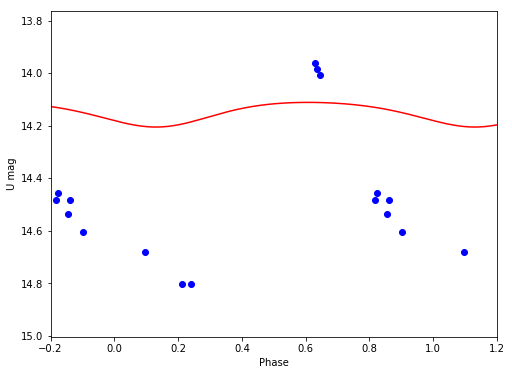

U 14.1492768909 0.0938527882011


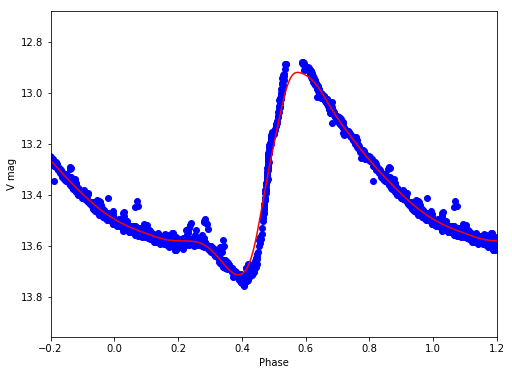

V 13.3549578422 0.792025112362
V18
/Volumes/Annie/CRRP/NGC6121/lcvs/V18.phased


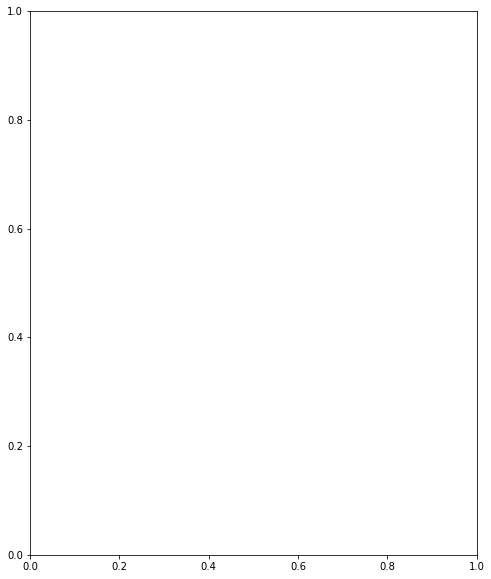

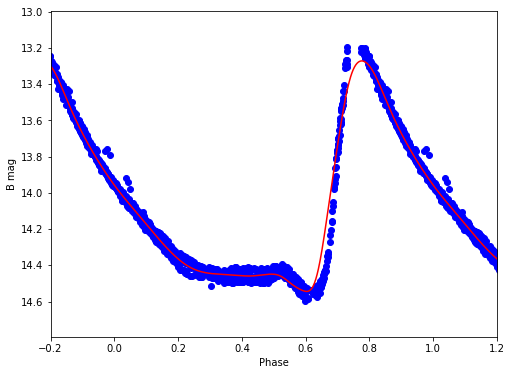

B 14.028541133 1.2722265212


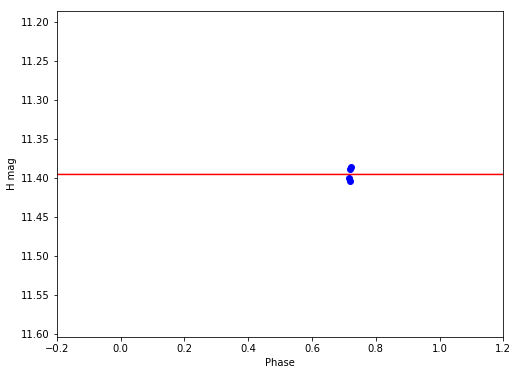

H 11.3959220776 1.11758294743e-05


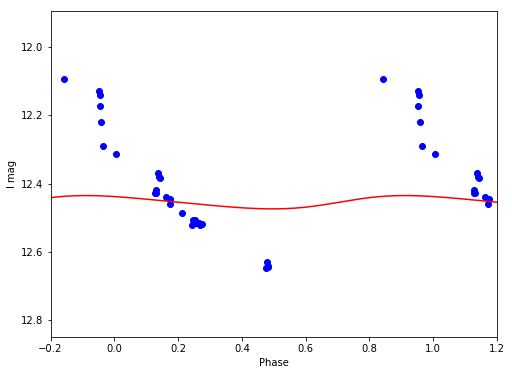

I 12.4544384256 0.0389708579251


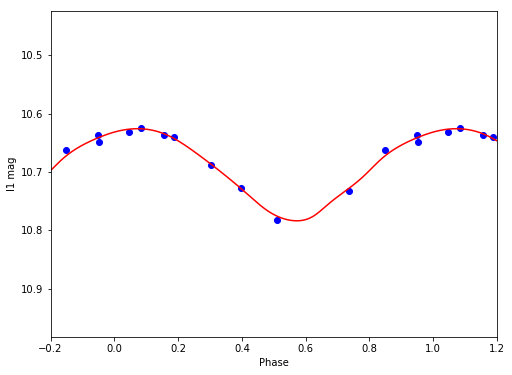

I1 10.6954789286 0.157582183069


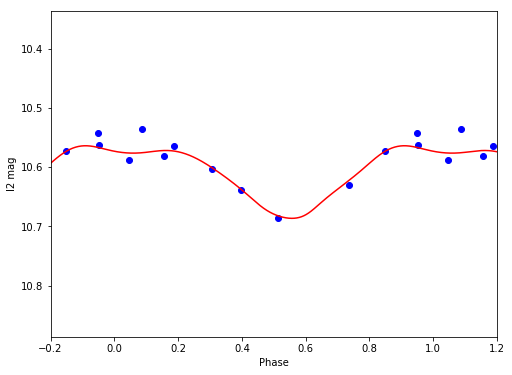

I2 10.6104226313 0.122389839642


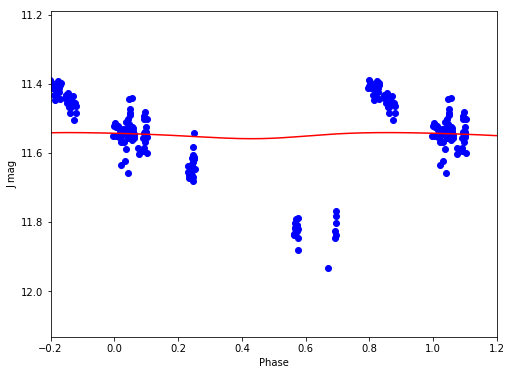

J 11.5482871809 0.0176705343391


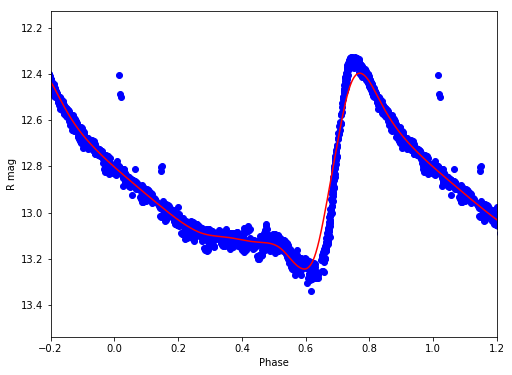

R 12.8840652155 0.845824567684


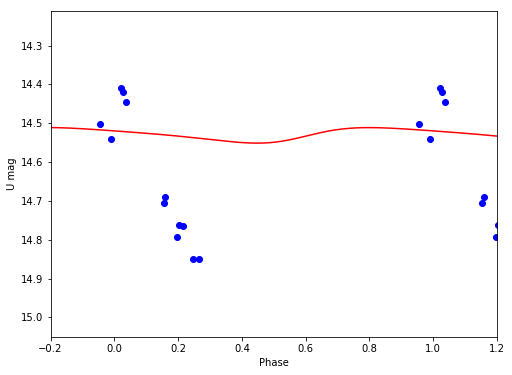

U 14.5293394485 0.0399818708999


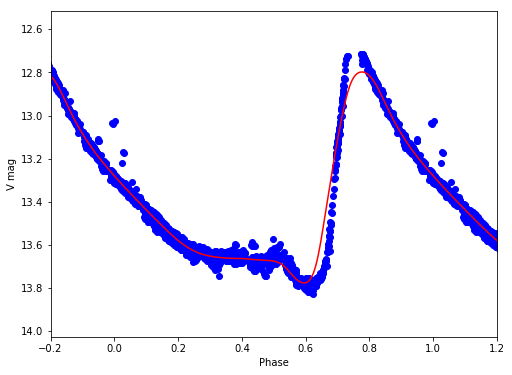

V 13.3630556267 0.979528512785
V19
/Volumes/Annie/CRRP/NGC6121/lcvs/V19.phased


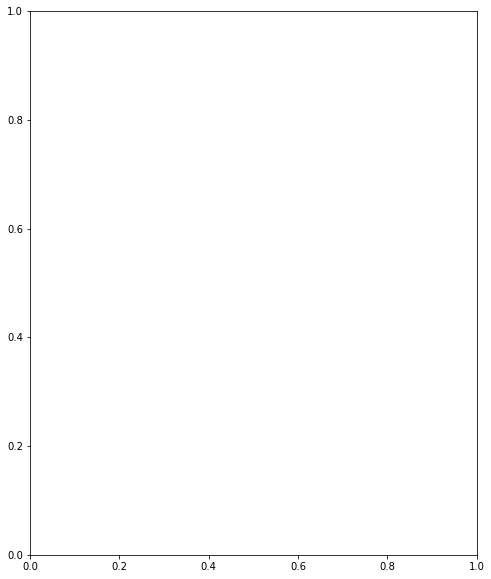

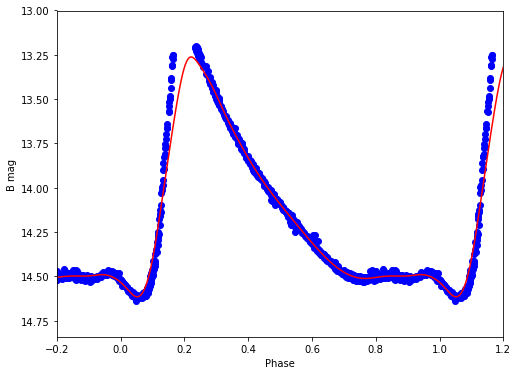

B 14.0580892991 1.35234783603


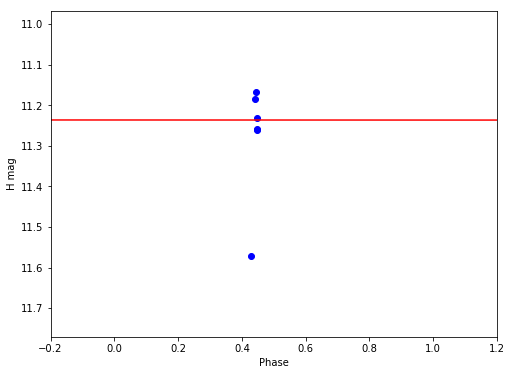

H 11.2359772399 0.000272727926209


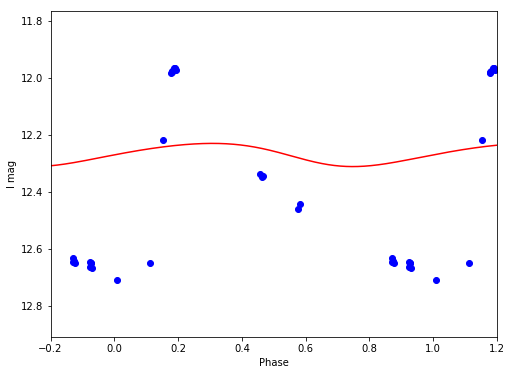

I 12.2675782864 0.0812393828012


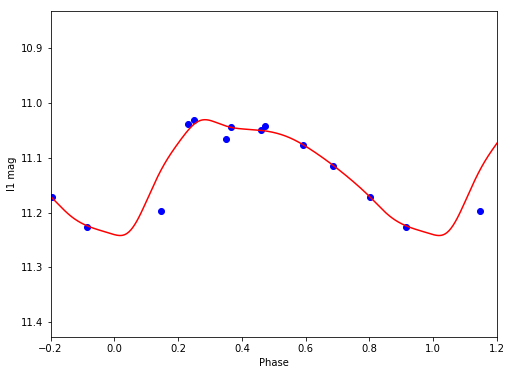

I1 11.1192232545 0.211637133418


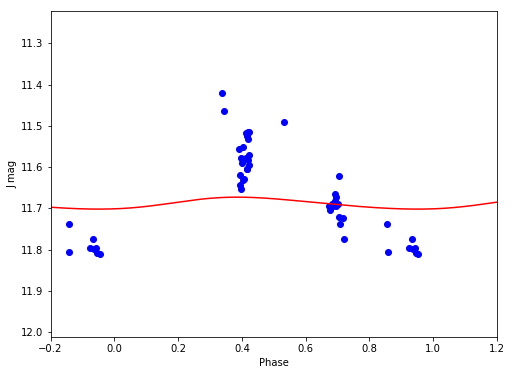

J 11.6878340022 0.0289644689308


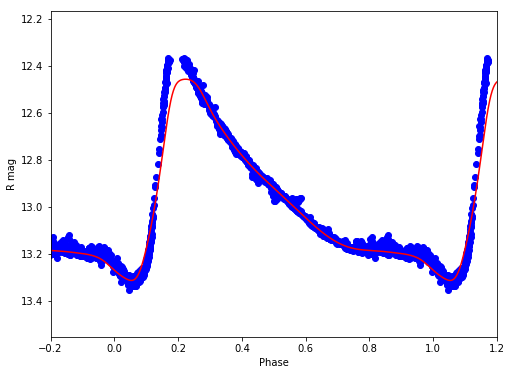

R 12.9449193192 0.855769975412


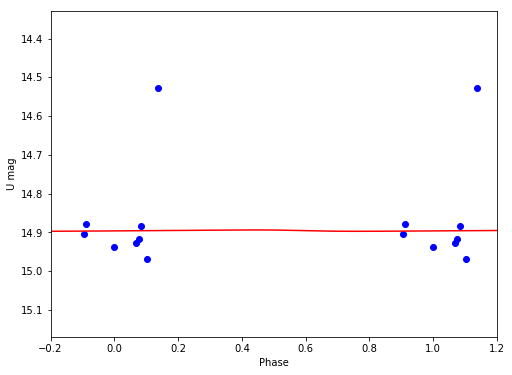

U 14.8953362743 0.00351170693945


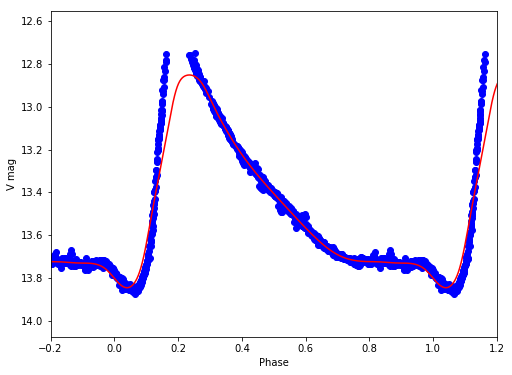

V 13.4191994182 0.994108444645
V20
/Volumes/Annie/CRRP/NGC6121/lcvs/V20.phased


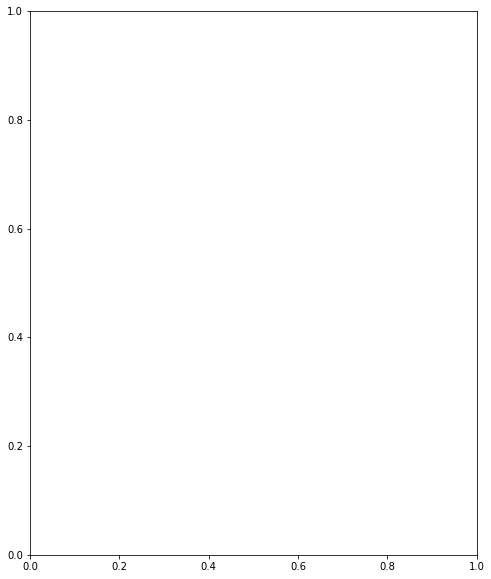

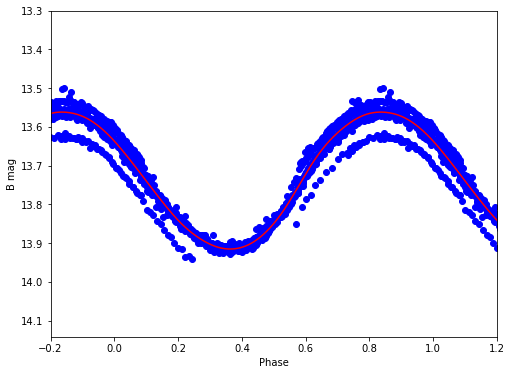

B 13.7281605812 0.353532717689


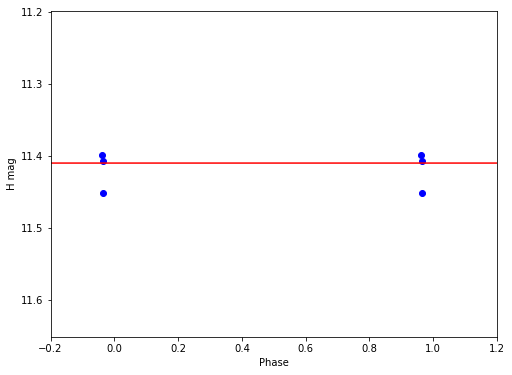

H 11.4097020606 1.15383628341e-06


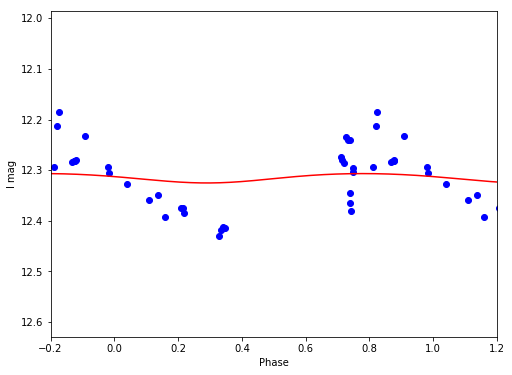

I 12.3152483627 0.0184995489177


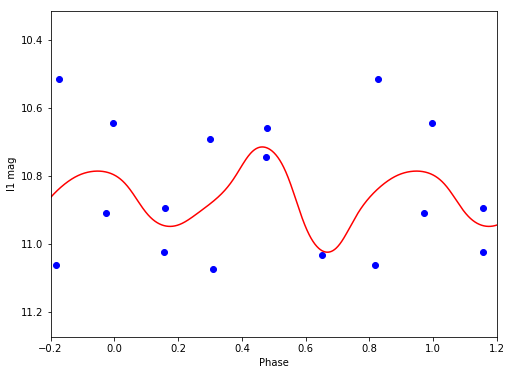

I1 10.8597262873 0.309499651258


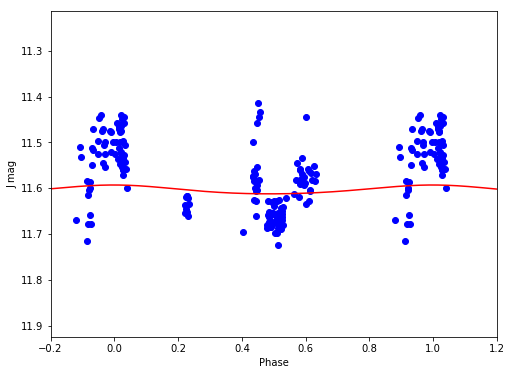

J 11.6031929494 0.0192679834268


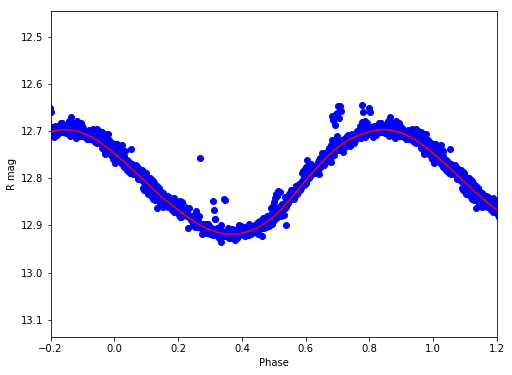

R 12.8047794066 0.221241784169


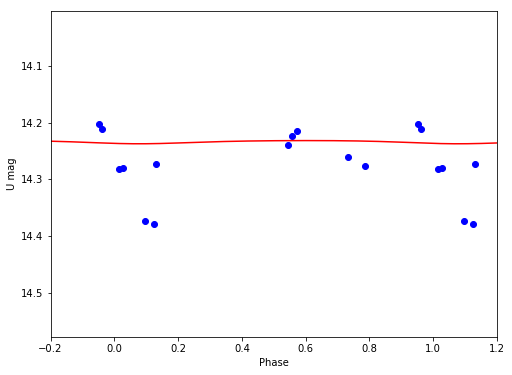

U 14.2337209661 0.00564608113345


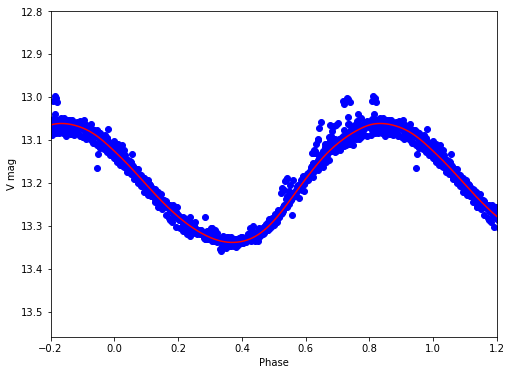

V 13.1945261438 0.27715468988
V21
/Volumes/Annie/CRRP/NGC6121/lcvs/V21.phased


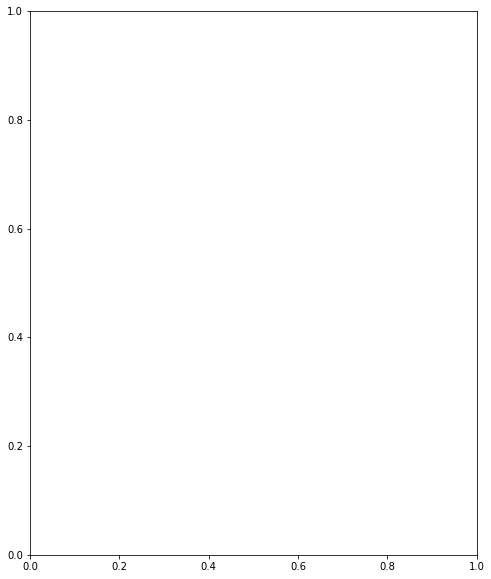

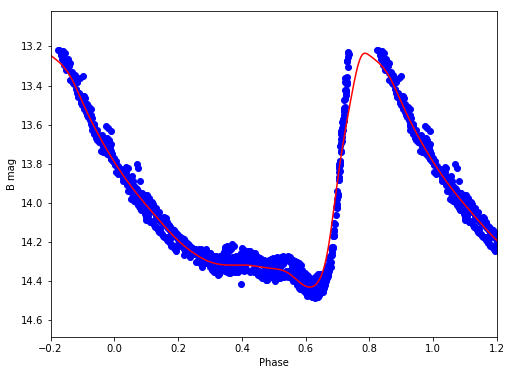

B 13.9284160579 1.19606182065


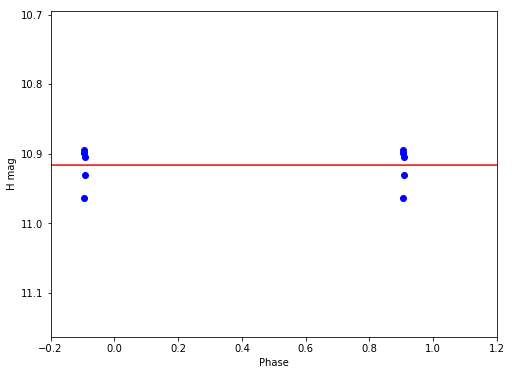

H 10.9160667848 9.55876812547e-06


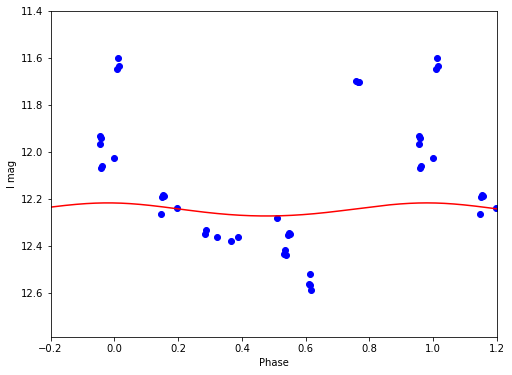

I 12.2453700375 0.0557343405892


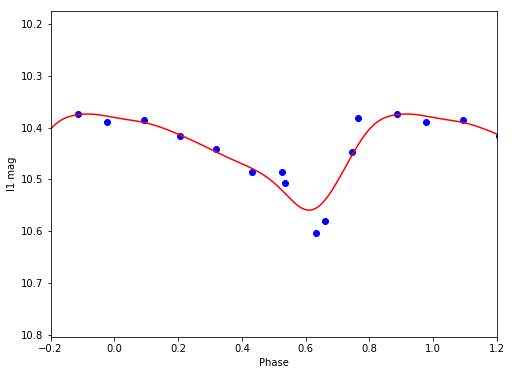

I1 10.4423484759 0.185638203233


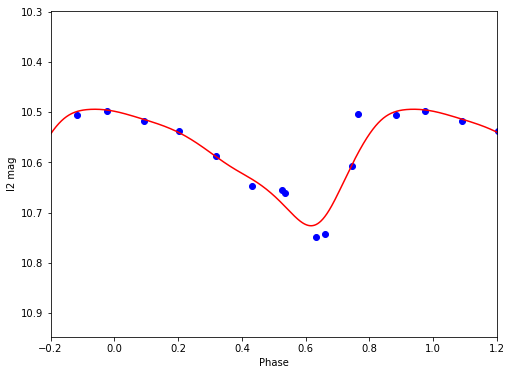

I2 10.5820952882 0.232526682644


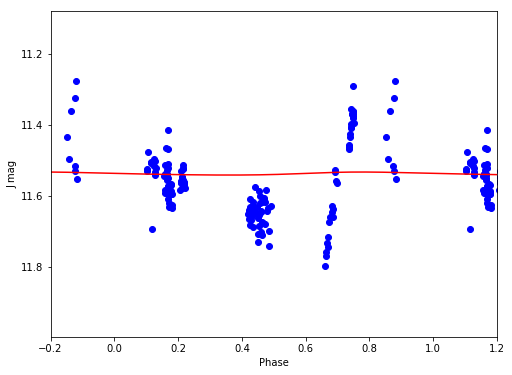

J 11.537423449 0.00854351547259


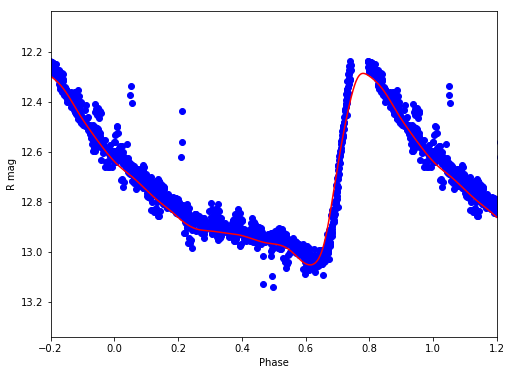

R 12.7298753121 0.766405355167


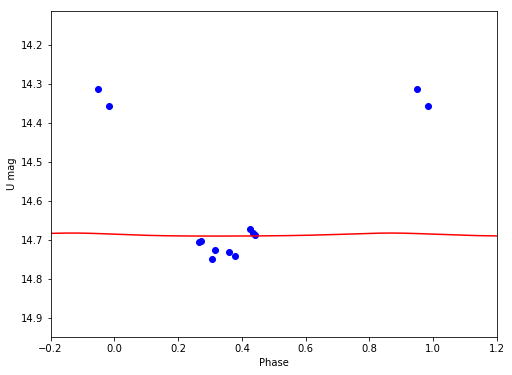

U 14.6869462801 0.00775493363428


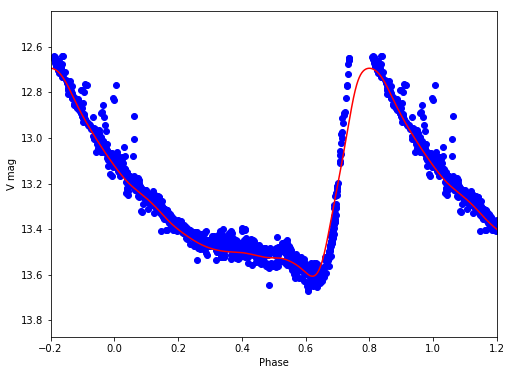

V 13.2308104623 0.913103138403
V22
/Volumes/Annie/CRRP/NGC6121/lcvs/V22.phased


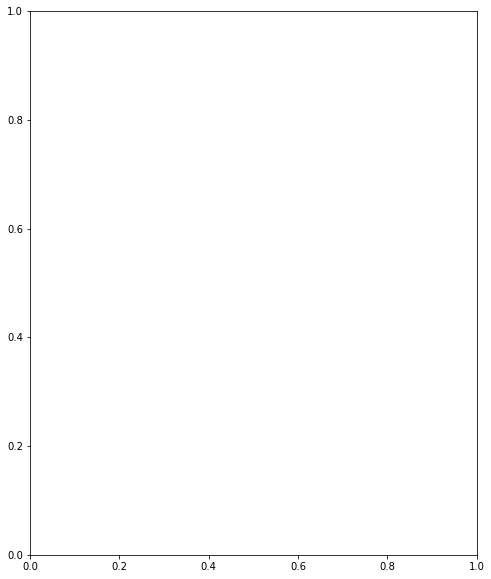

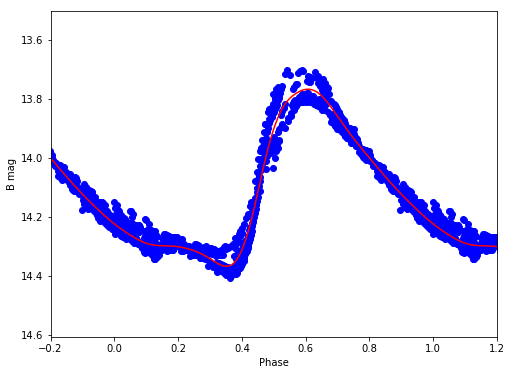

B 14.092582606 0.599788145564


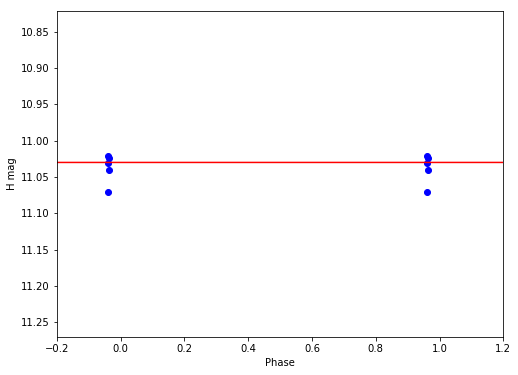

H 11.0299679206 5.16710665366e-07


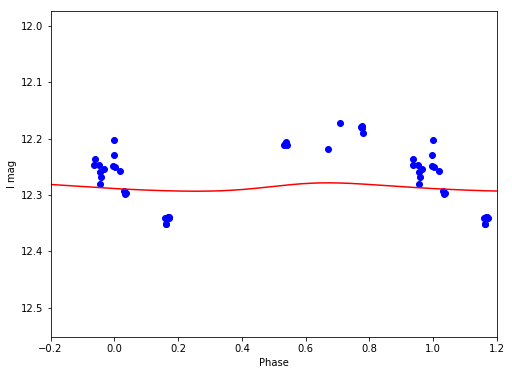

I 12.286824479 0.0148756716447


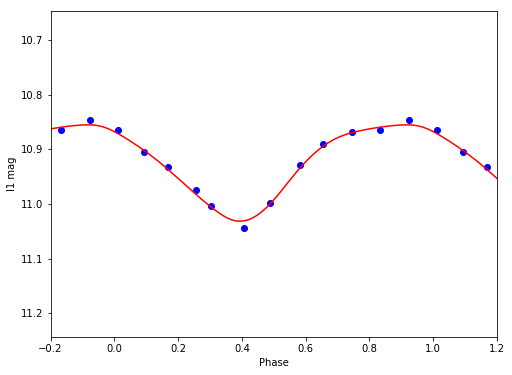

I1 10.9254726782 0.176404515139


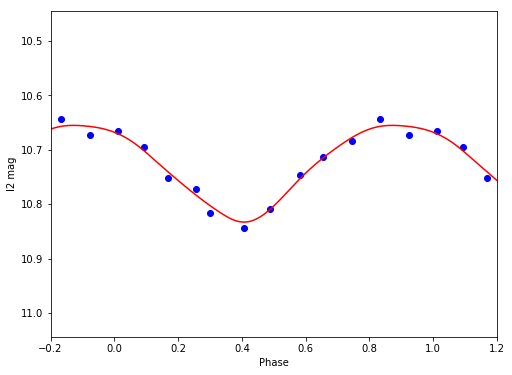

I2 10.7305958324 0.177909567576


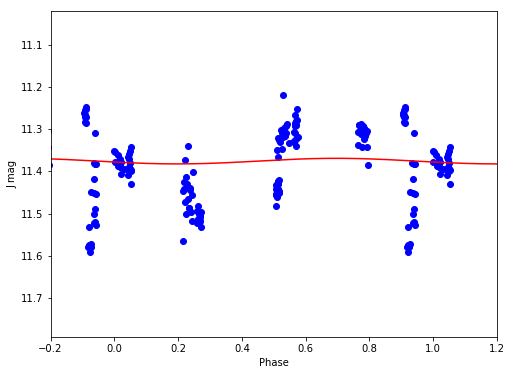

J 11.3756301813 0.0132506167819


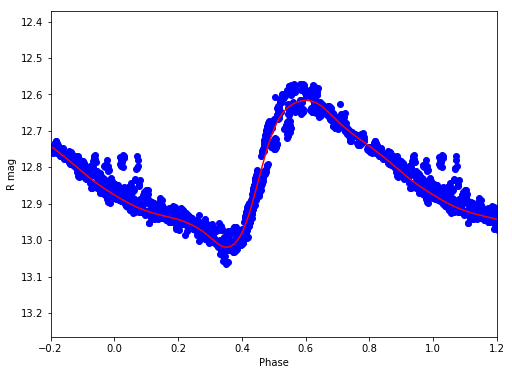

R 12.8173739835 0.402644593396


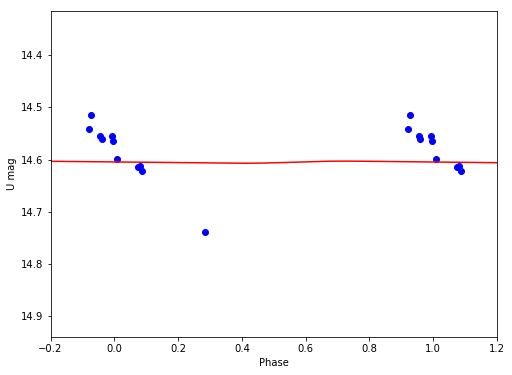

U 14.6049745964 0.00408288466098


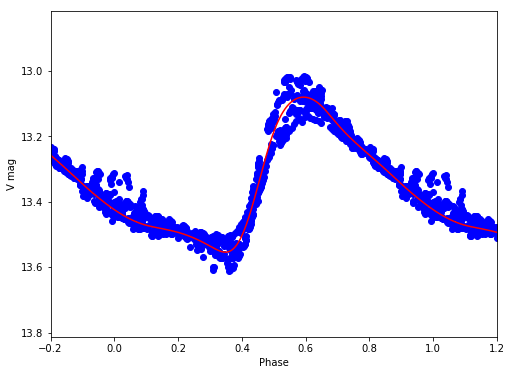

V 13.3346505328 0.474313972522
V23
/Volumes/Annie/CRRP/NGC6121/lcvs/V23.phased


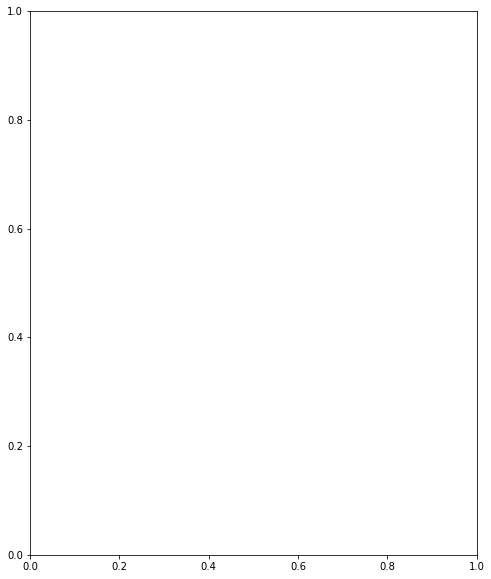

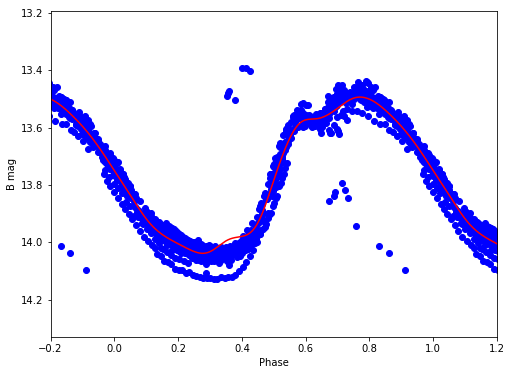

B 13.7490752572 0.544702412844


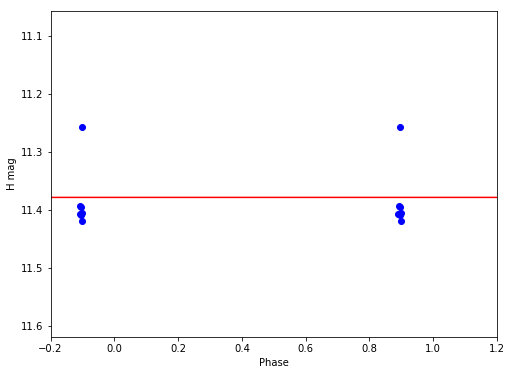

H 11.3788035102 3.36826922265e-06


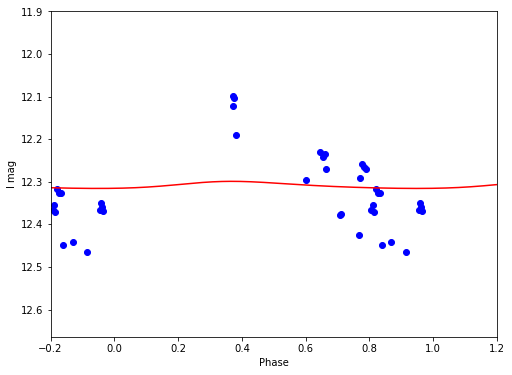

I 12.3084738144 0.0166571500206


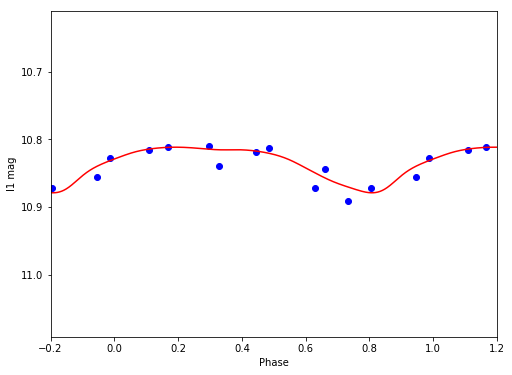

I1 10.8343333178 0.0672512252677


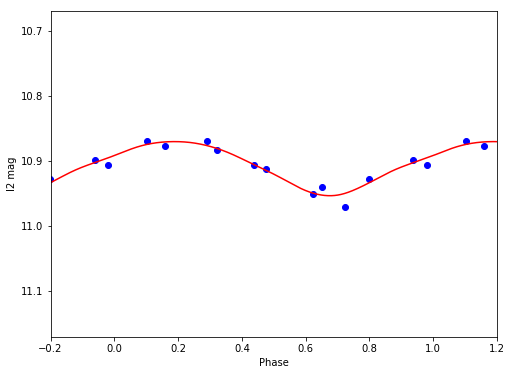

I2 10.9071768043 0.0832706351093


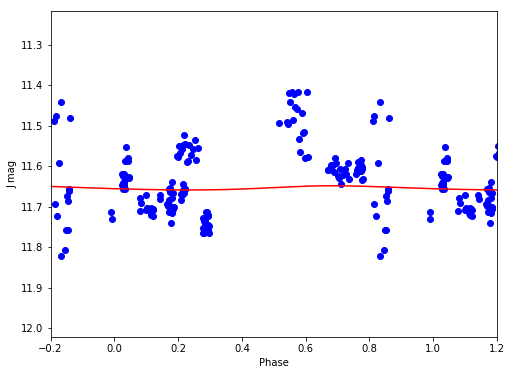

J 11.6538919283 0.0103617708574


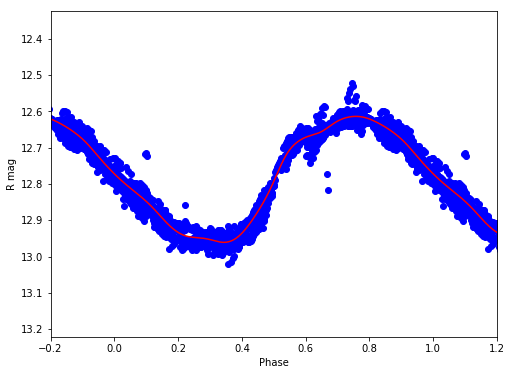

R 12.7758041775 0.347216684498


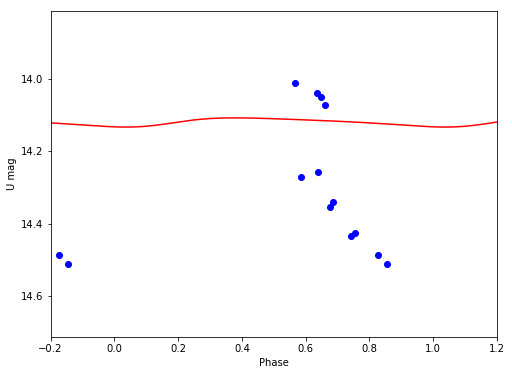

U 14.1187395704 0.0254516760248


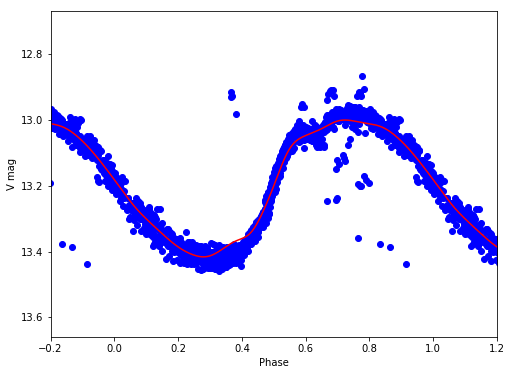

V 13.1854180583 0.416105628393
V24
/Volumes/Annie/CRRP/NGC6121/lcvs/V24.phased


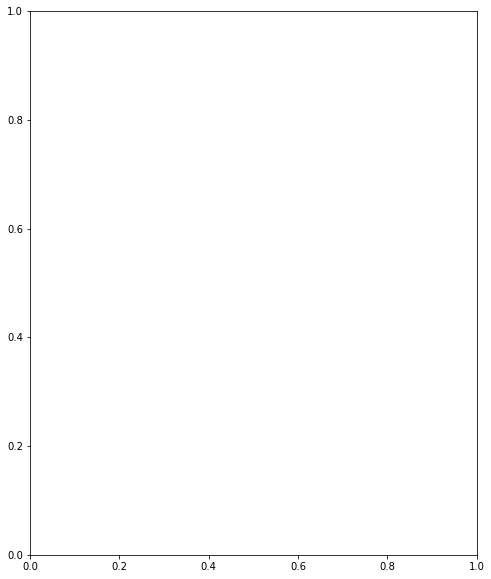

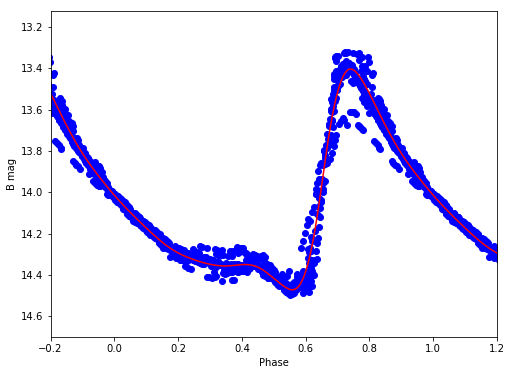

B 14.0298872366 1.06718965491


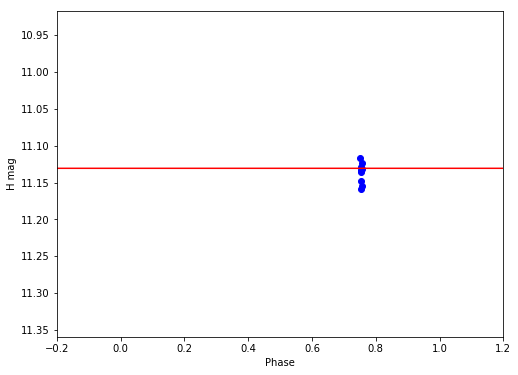

H 11.1306667684 1.12864240354e-05


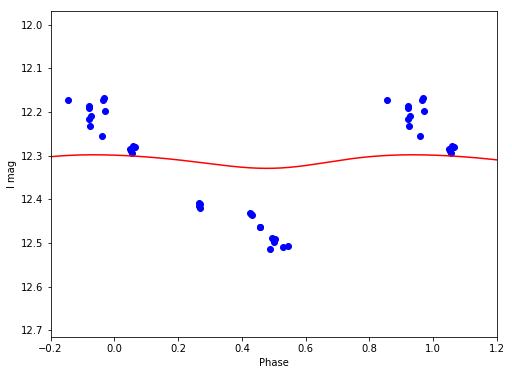

I 12.312070798 0.0310360350938


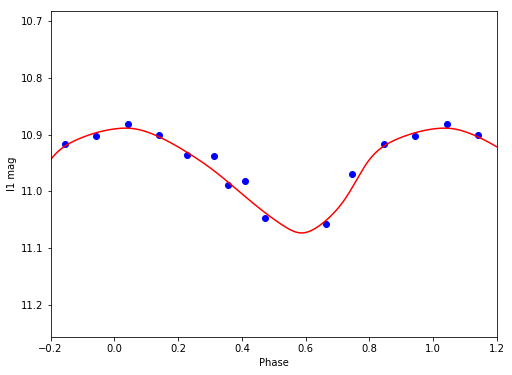

I1 10.9652574549 0.18511282121


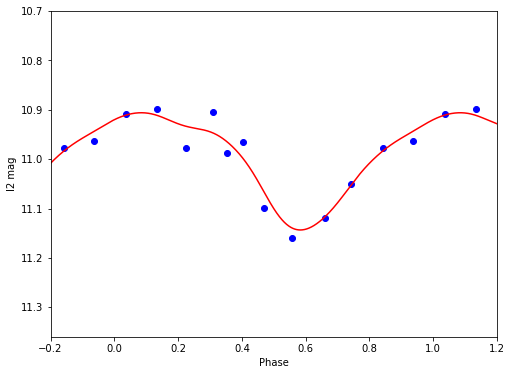

I2 10.9962602814 0.2375794955


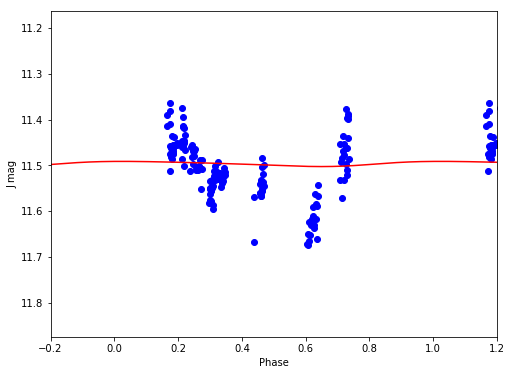

J 11.4962516705 0.0112681942212


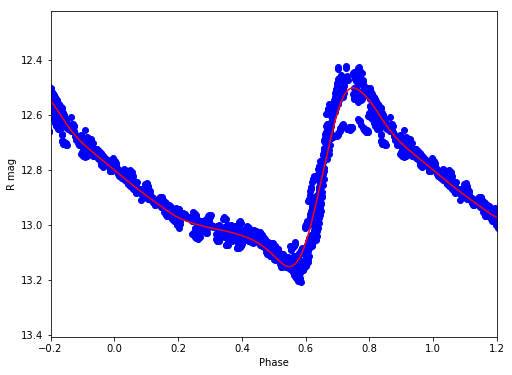

R 12.8553418688 0.648677011171


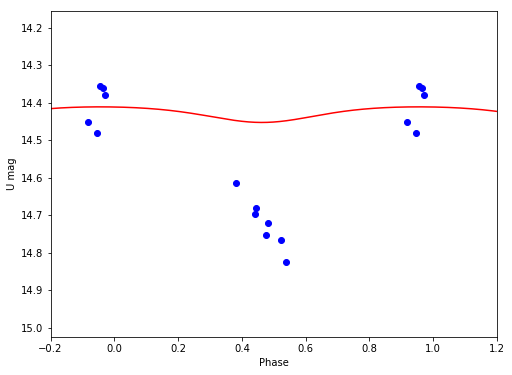

U 14.4281505394 0.0415292866372


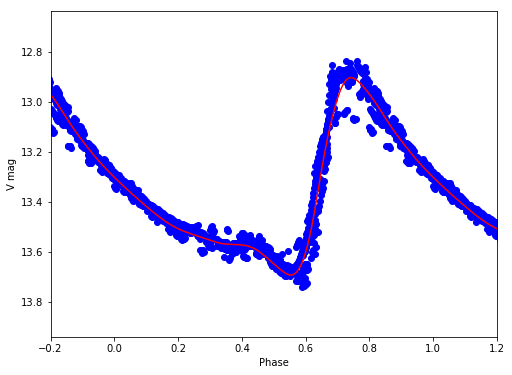

V 13.3430355385 0.790948751501
V25
/Volumes/Annie/CRRP/NGC6121/lcvs/V25.phased


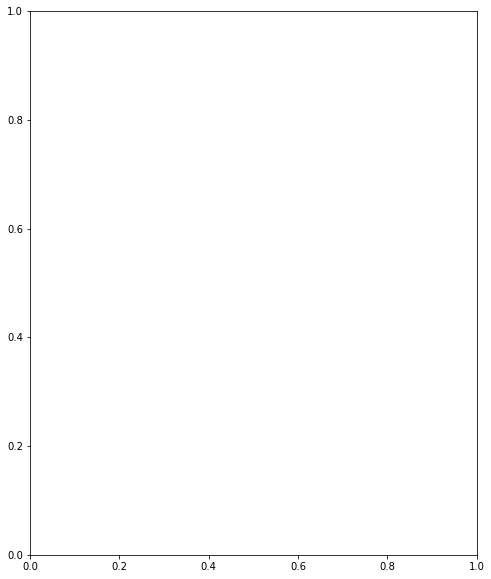

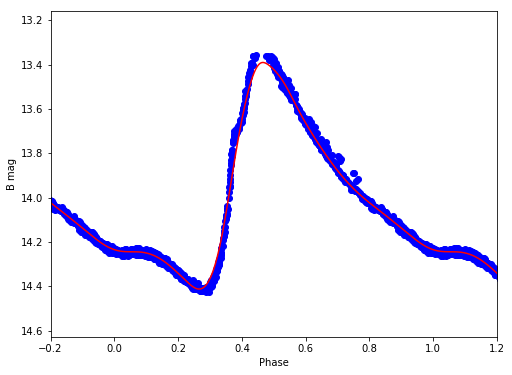

B 13.9484167146 1.02271718651


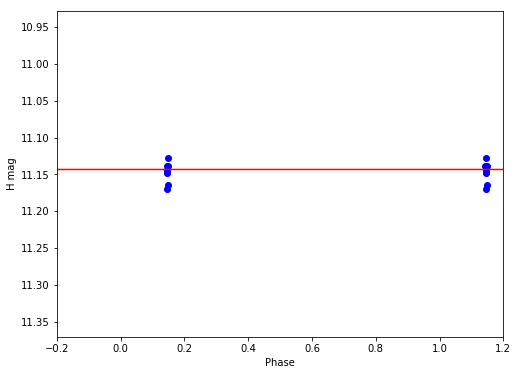

H 11.1432469961 1.94674827974e-05


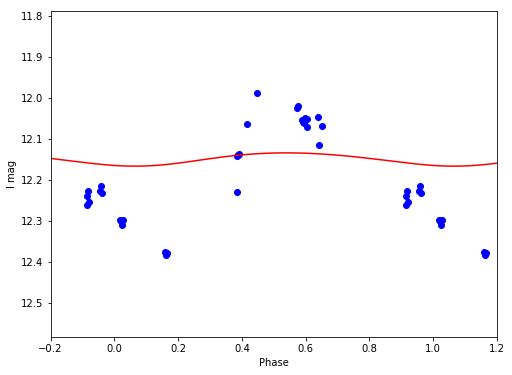

I 12.1491559044 0.0323629606214


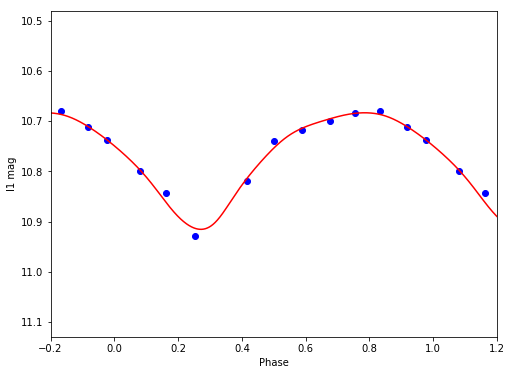

I1 10.7701511752 0.231935613411


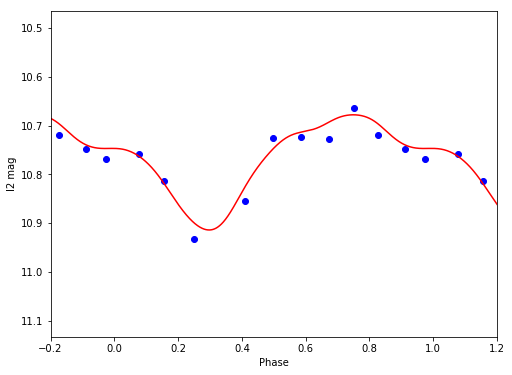

I2 10.7671677009 0.235539452424


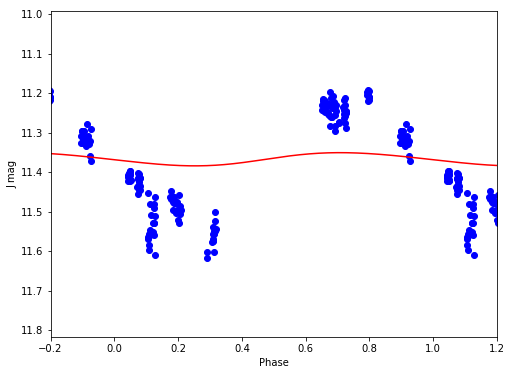

J 11.367003638 0.033419595939


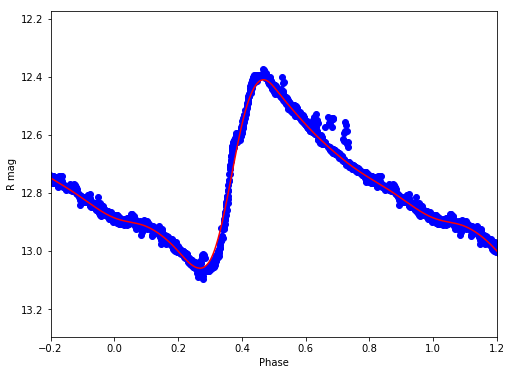

R 12.745021156 0.648800909439


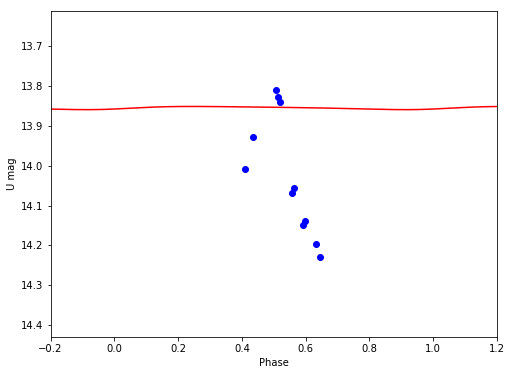

U 13.8543504939 0.00804630614785


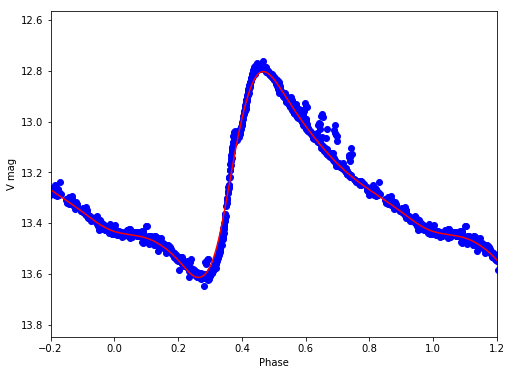

V 13.2361052101 0.811587393863
V26
/Volumes/Annie/CRRP/NGC6121/lcvs/V26.phased


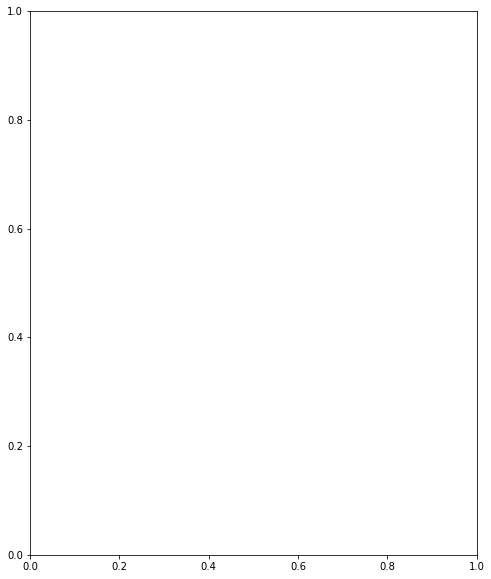

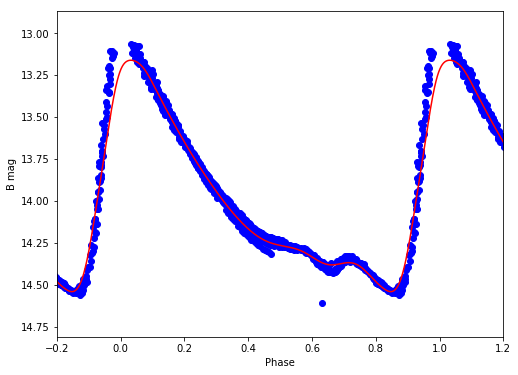

B 13.9101549436 1.37861586193


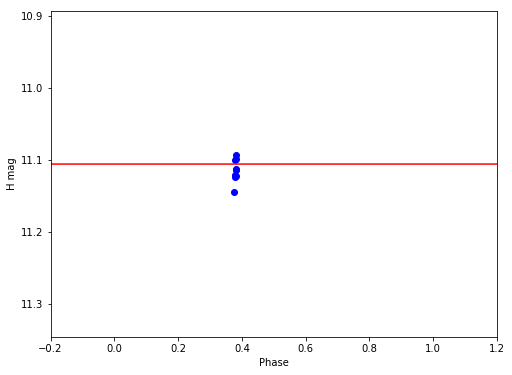

H 11.1056128952 1.07137204779e-05


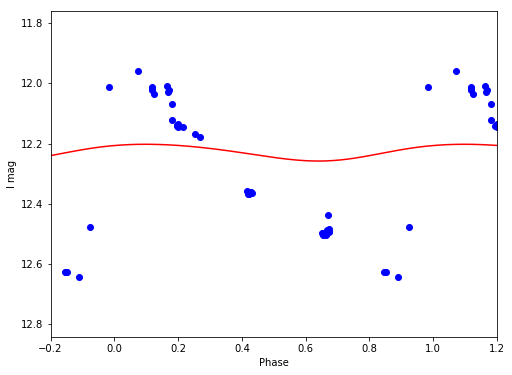

I 12.2280904307 0.0558216804178


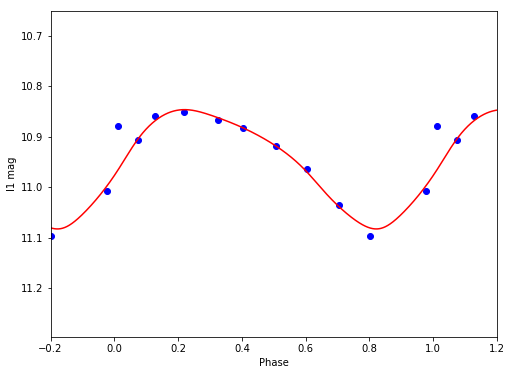

I1 10.946736483 0.23630734615


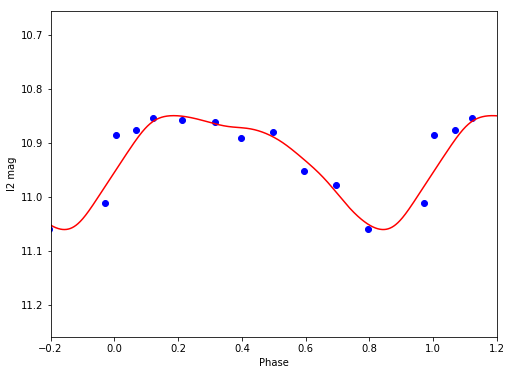

I2 10.9290708508 0.211238360246


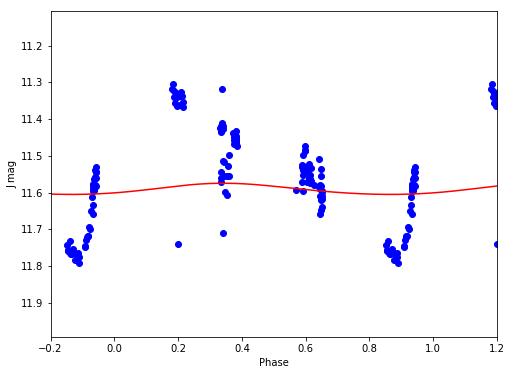

J 11.5906619131 0.0304062807039


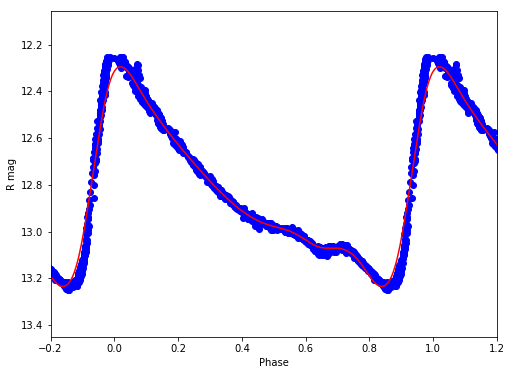

R 12.8024811212 0.93935880629


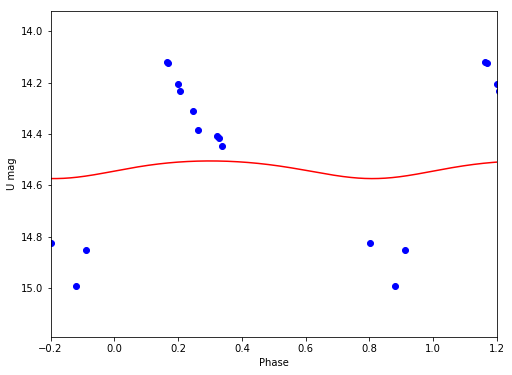

U 14.5356188778 0.0687964509365


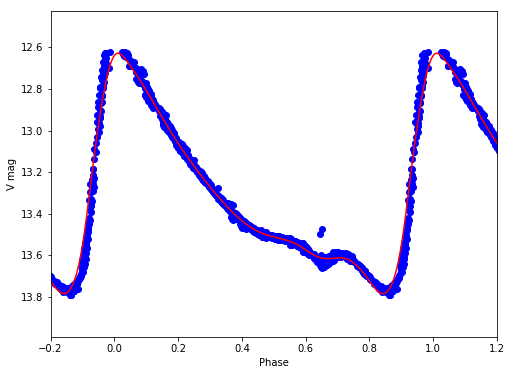

V 13.2606191166 1.15492723873
V27
/Volumes/Annie/CRRP/NGC6121/lcvs/V27.phased


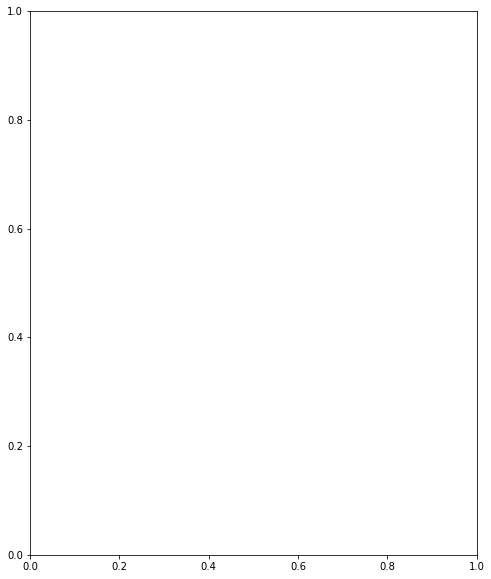

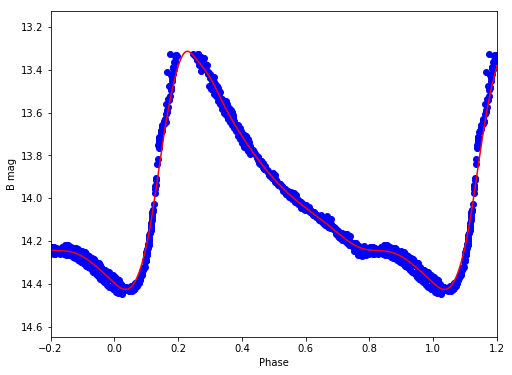

B 13.9233571748 1.10964172863


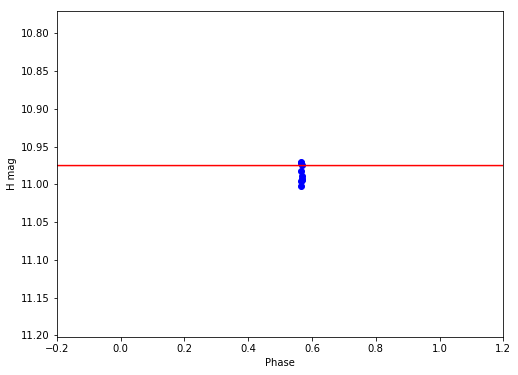

H 10.9752033487 1.32065781244e-06


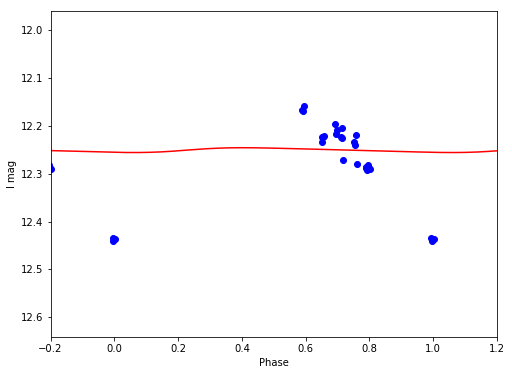

I 12.2505590283 0.0100788133312


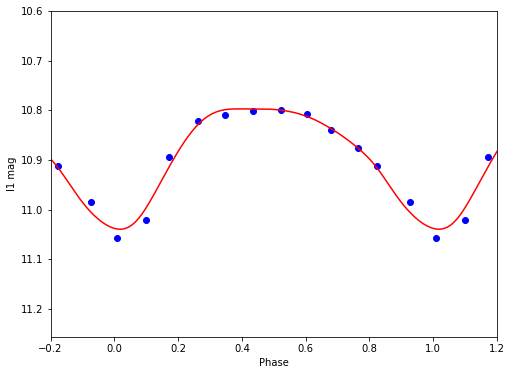

I1 10.8825814927 0.242400884481


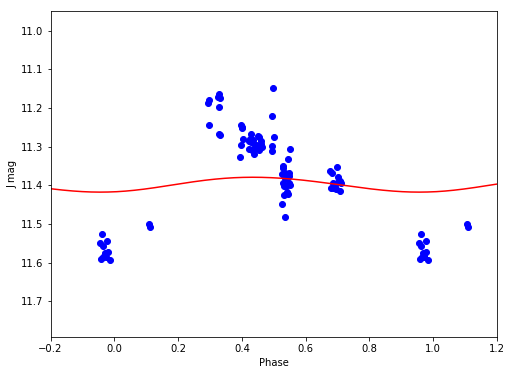

J 11.397790063 0.0384638843742


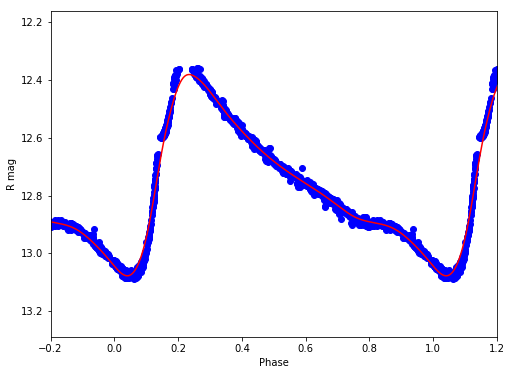

R 12.7330227403 0.69678199015


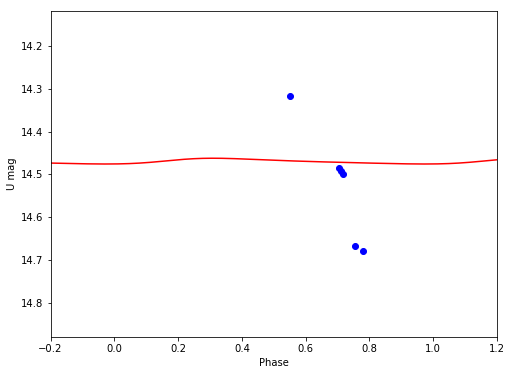

U 14.4698017258 0.0134670018114


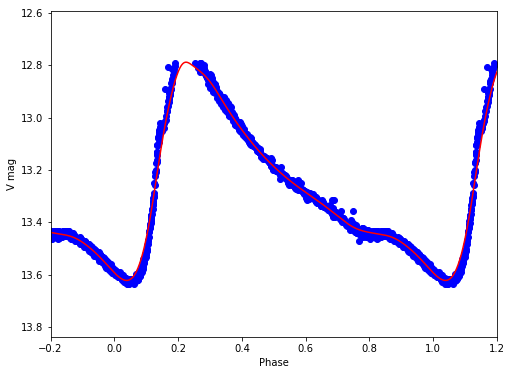

V 13.2260993288 0.833101773355
V28
/Volumes/Annie/CRRP/NGC6121/lcvs/V28.phased


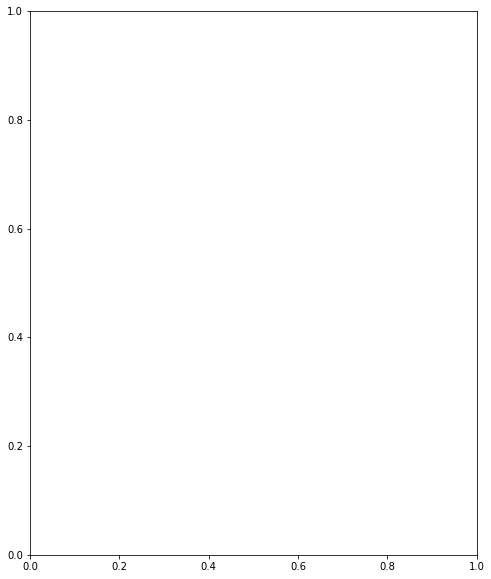

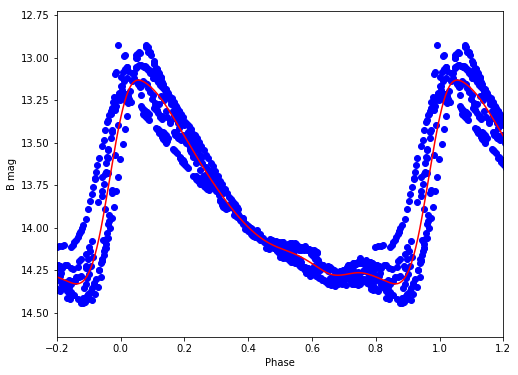

B 13.8137953662 1.19829567779


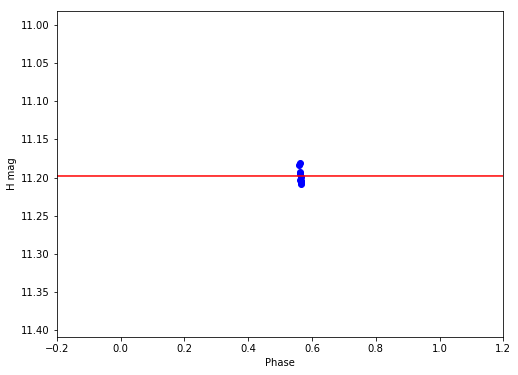

H 11.1979610667 4.83017372694e-05


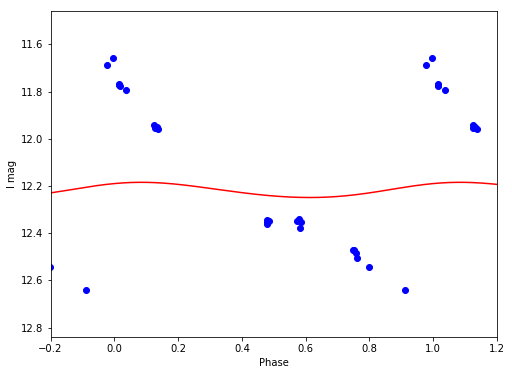

I 12.2175710768 0.0644010173386


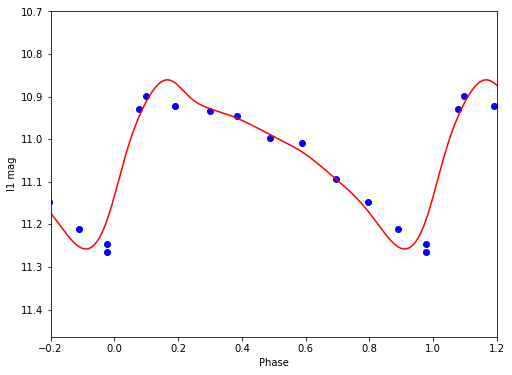

I1 11.0291911864 0.397198079255


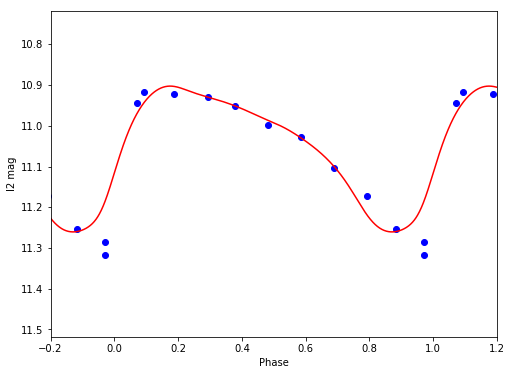

I2 11.0405081324 0.358076569453


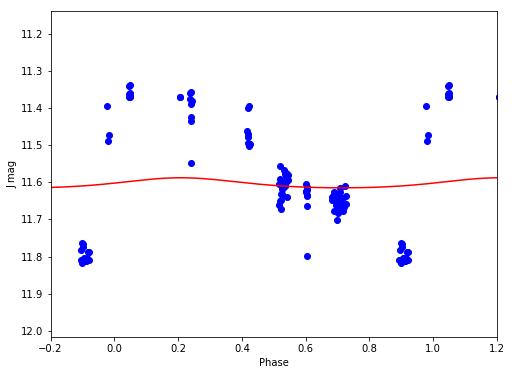

J 11.6035348347 0.0270614498484


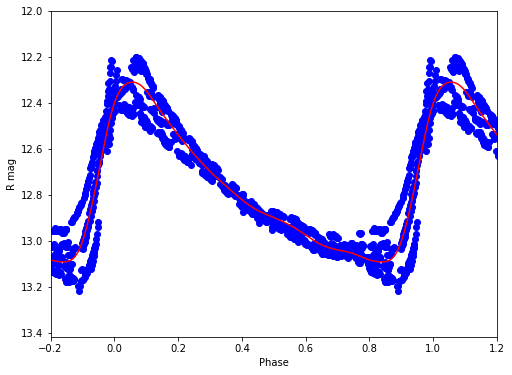

R 12.7512567456 0.781275790784


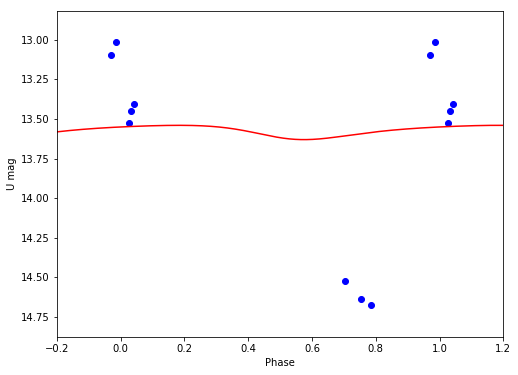

U 13.5754465154 0.0902085795622


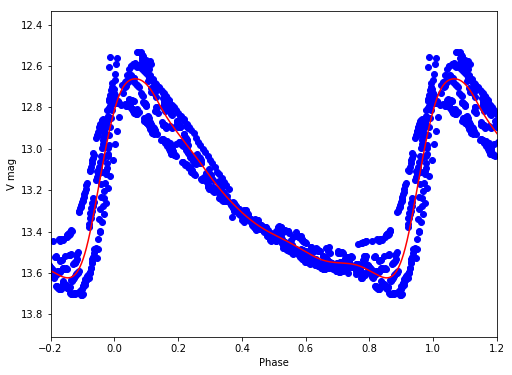

V 13.1987856795 0.961102432343
V29
/Volumes/Annie/CRRP/NGC6121/lcvs/V29.phased


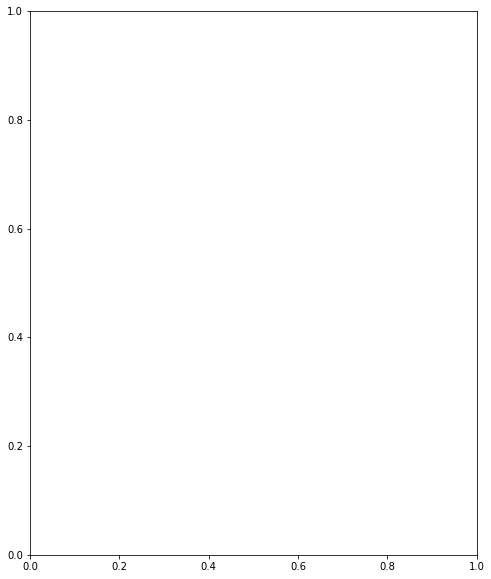

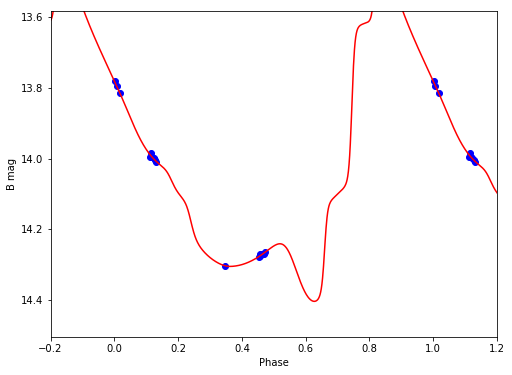

B 13.975779246 1.16735880297


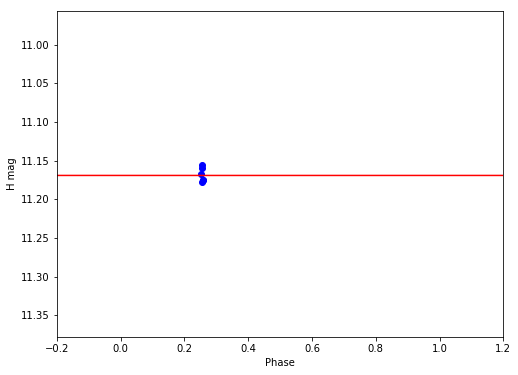

H 11.169228075 4.00062286126e-05


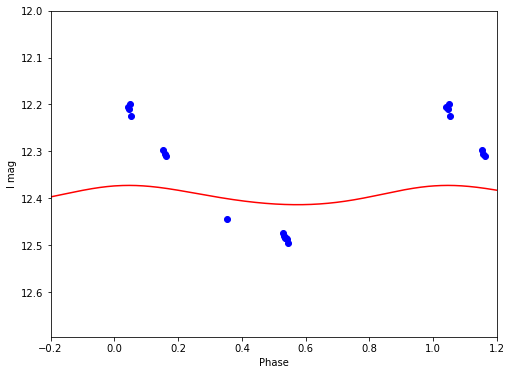

I 12.3942400779 0.0410829101614


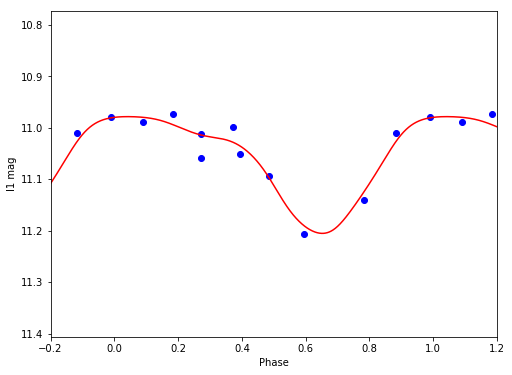

I1 11.0600965623 0.226921187353


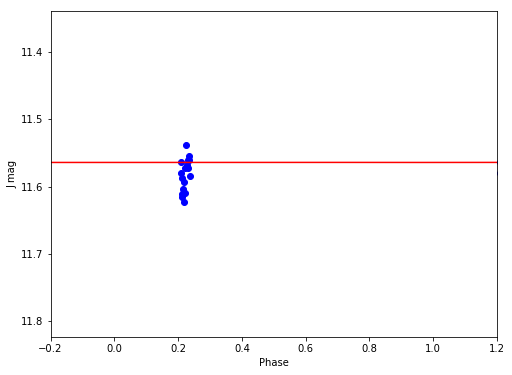

J 11.564207125 0.000172559095663


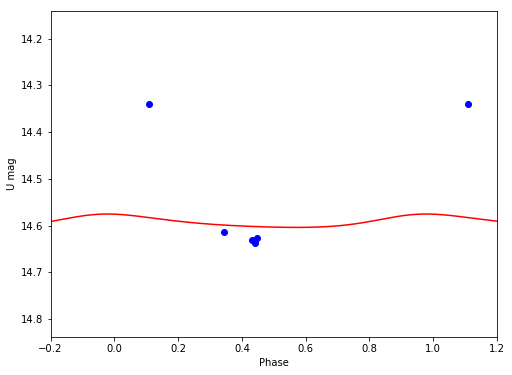

U 14.5923884552 0.0286554329249


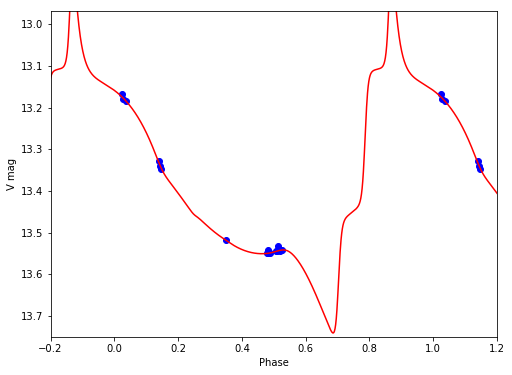

V 13.3679447901 0.886085281125
V30
/Volumes/Annie/CRRP/NGC6121/lcvs/V30.phased


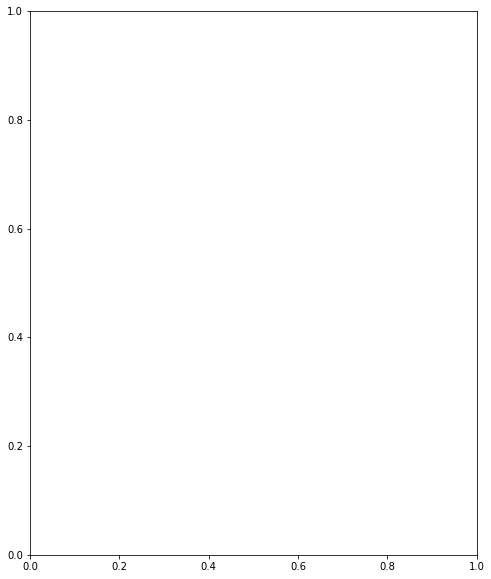

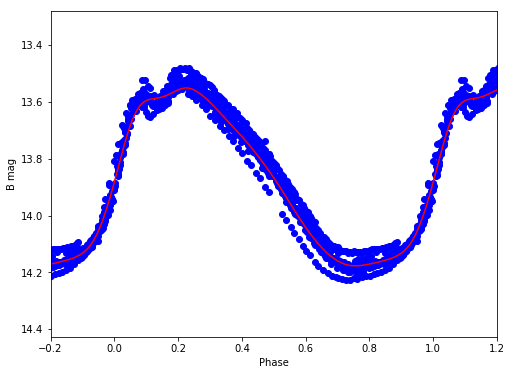

B 13.8484588025 0.624987363227


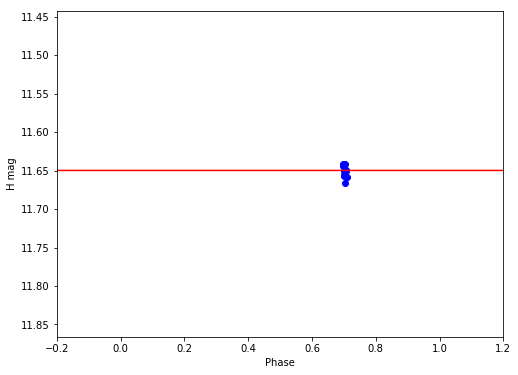

H 11.6497316928 1.82108580162e-05


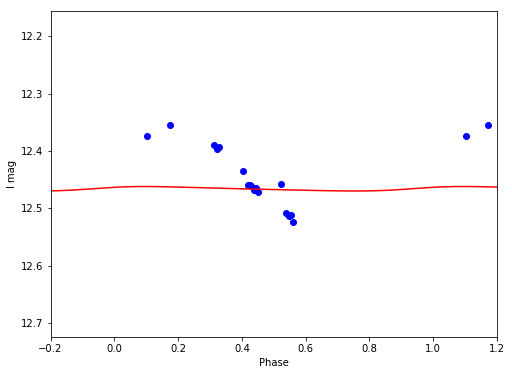

I 12.4659284498 0.00786588310947


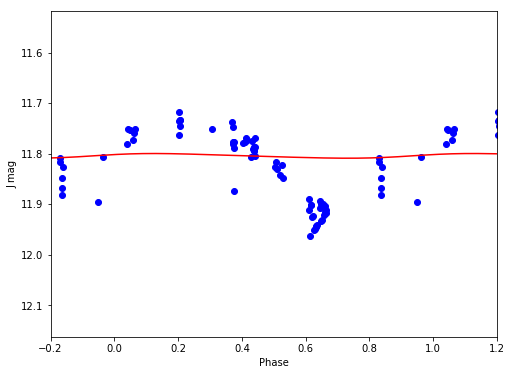

J 11.8043006744 0.00927769053542


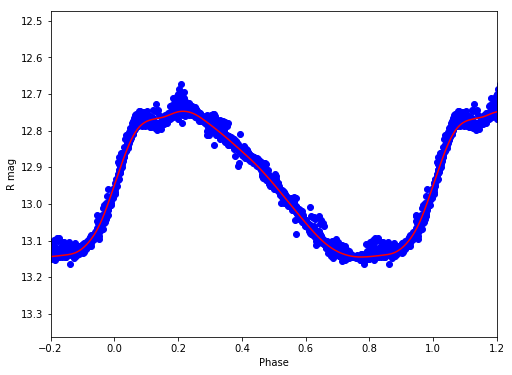

R 12.9406804566 0.398037136802


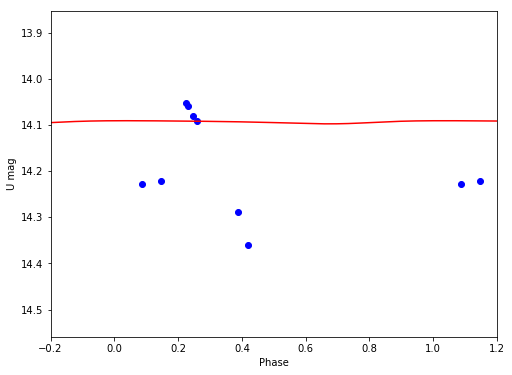

U 14.0932945495 0.00679638290257


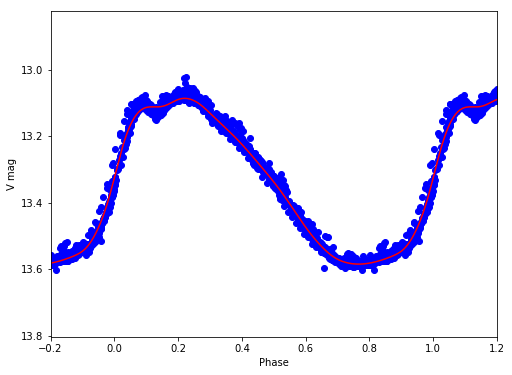

V 13.3234973081 0.49806540936
V31
/Volumes/Annie/CRRP/NGC6121/lcvs/V31.phased


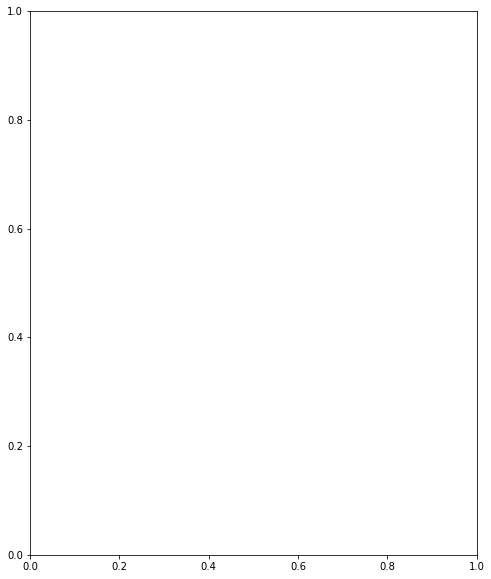

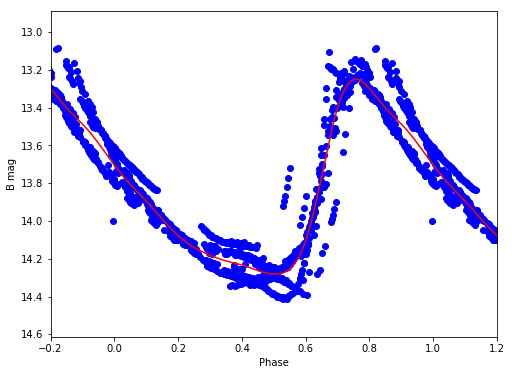

B 13.8089521956 1.03093130725


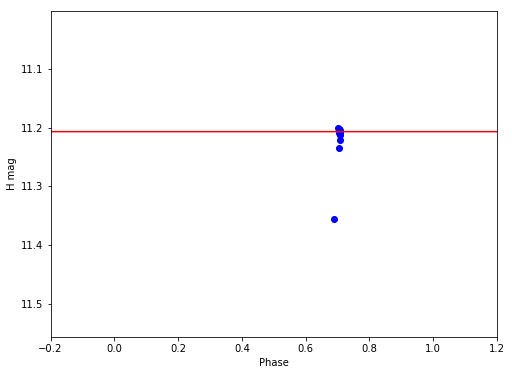

H 11.2068835789 5.50342843653e-06


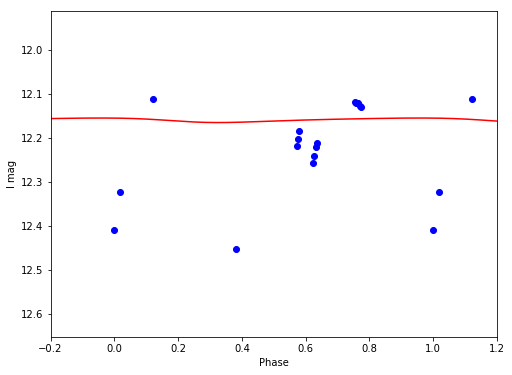

I 12.159066886 0.010265261221


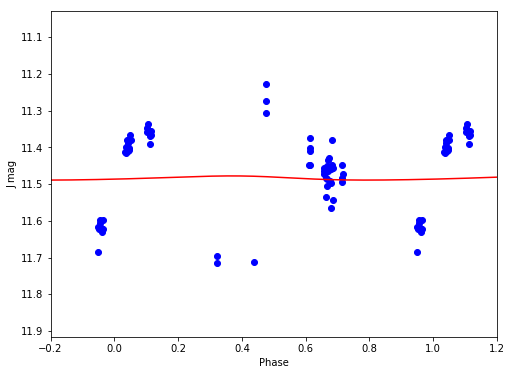

J 11.4837312296 0.0113557066805


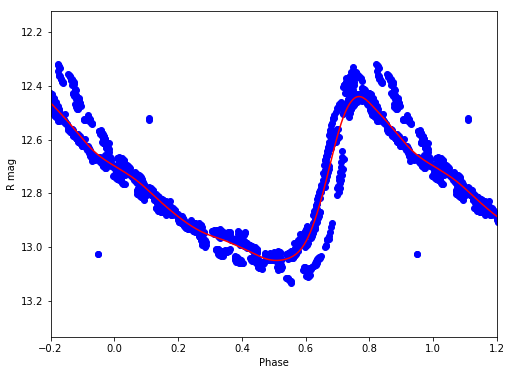

R 12.7820593674 0.61008665468


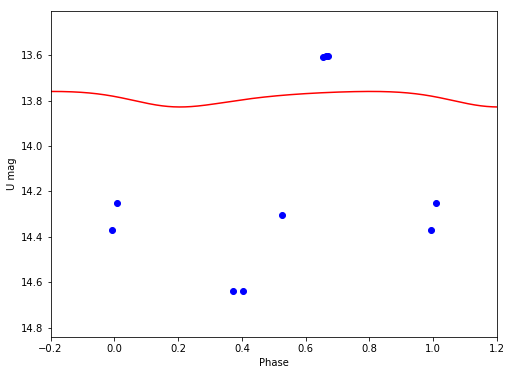

U 13.7864091246 0.0684557358663


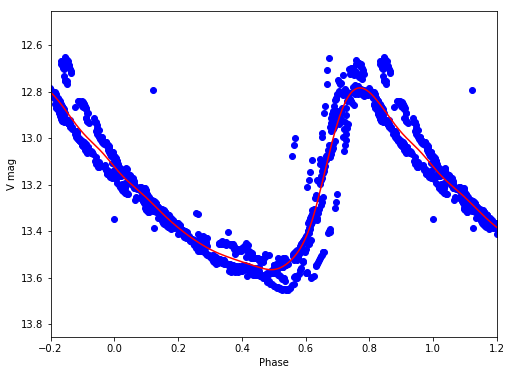

V 13.2160164007 0.782563969866
V32
/Volumes/Annie/CRRP/NGC6121/lcvs/V32.phased


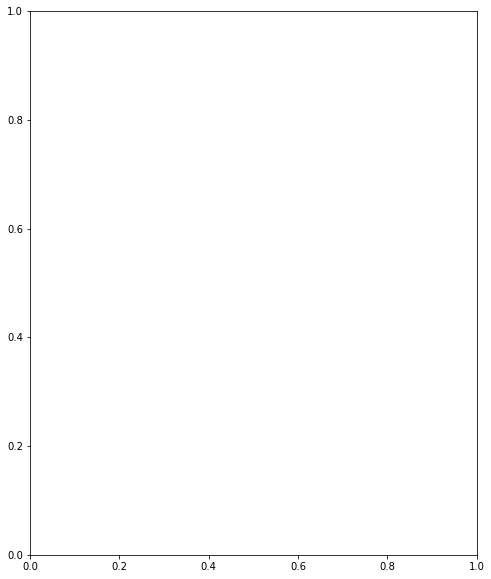

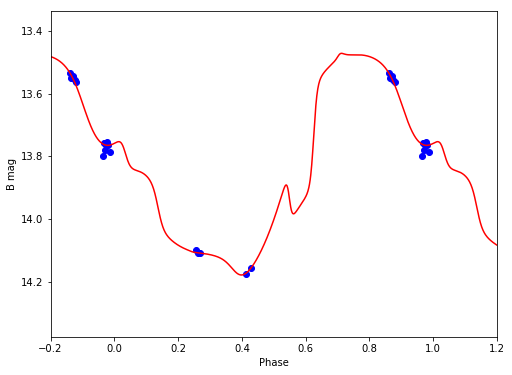

B 13.8193467761 0.707467319287


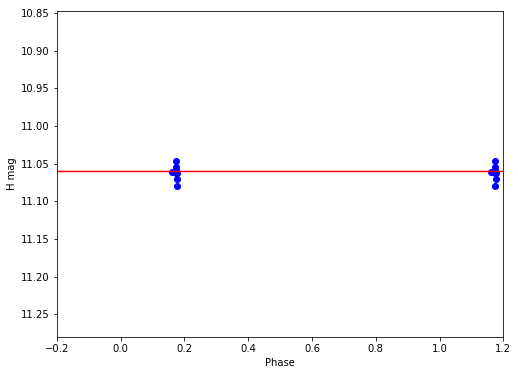

H 11.0605340525 1.82011383707e-05


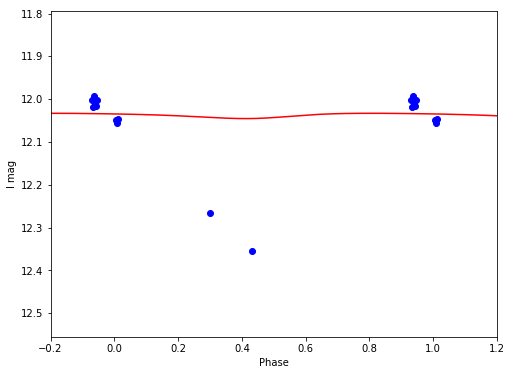

I 12.0376149941 0.0123808790426


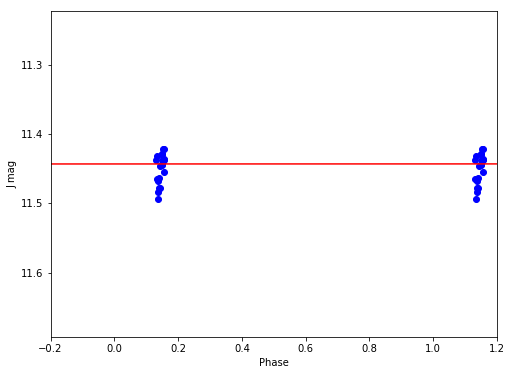

J 11.4428107501 0.000147946073589


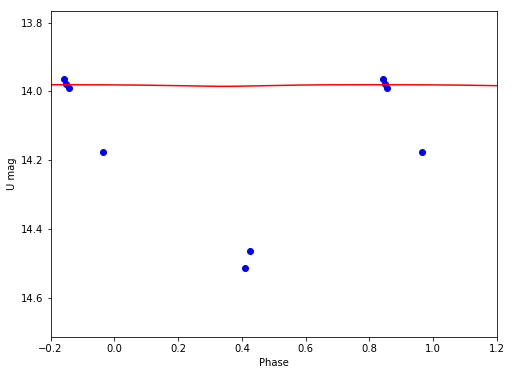

U 13.9821953593 0.00466244926458


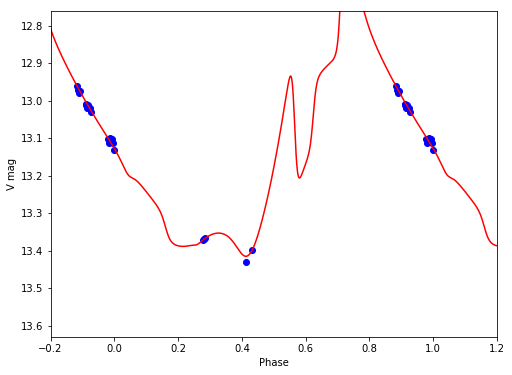

V 13.099771362 0.95262283905
V33
/Volumes/Annie/CRRP/NGC6121/lcvs/V33.phased


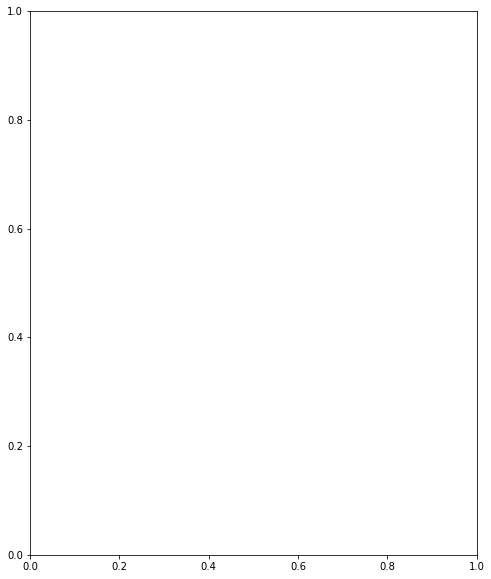

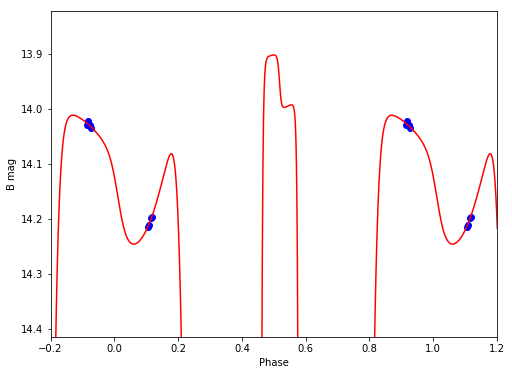

B 14.7469211631 18.7551063663


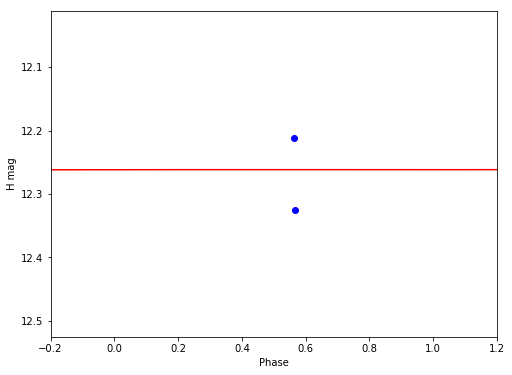

H 12.2616862019 0.000232568697049


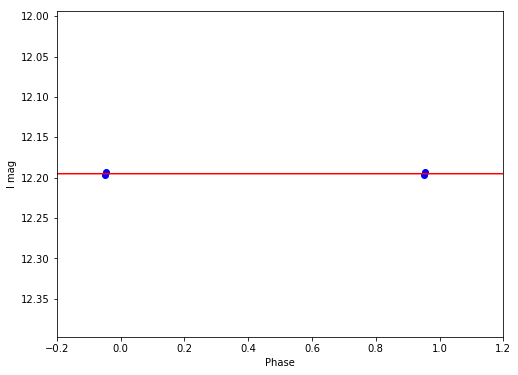

I 12.1949999975 1.12201674547e-05


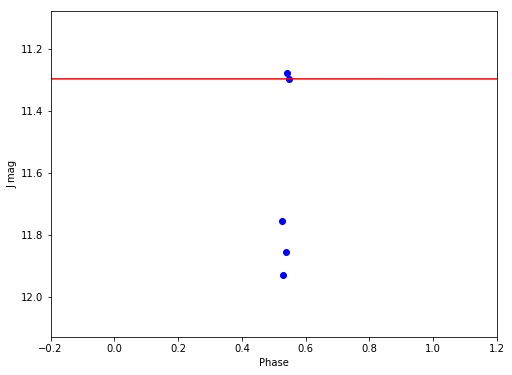

J 11.2951579299 0.000130724850266


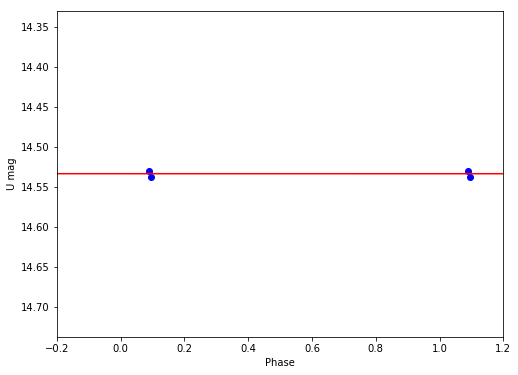

U 14.5334999918 4.13185918671e-05


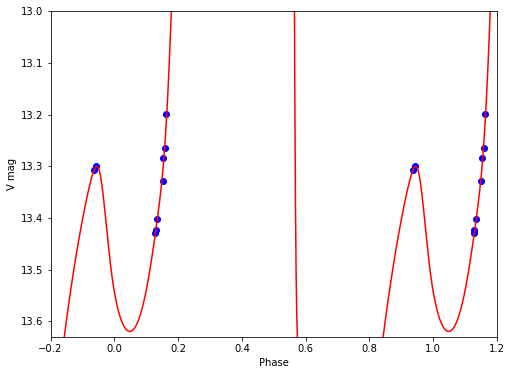

V -5.88181582836 25.3694206565
V34
/Volumes/Annie/CRRP/NGC6121/lcvs/V34.phased


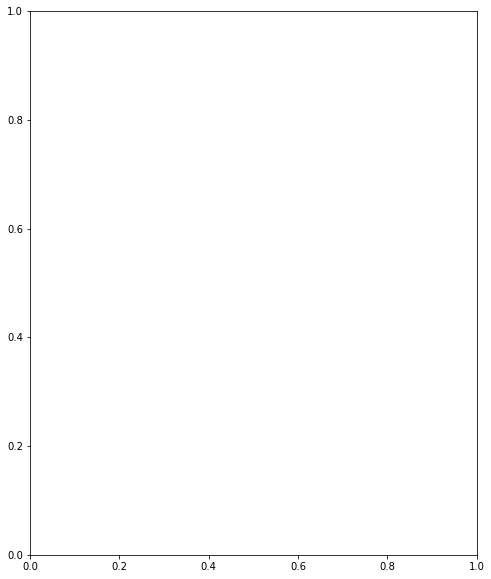

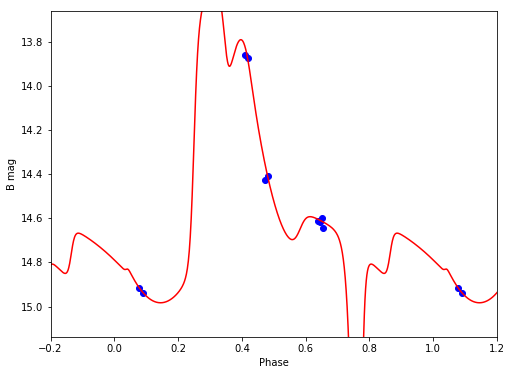

B 14.4889393275 3.3726243257


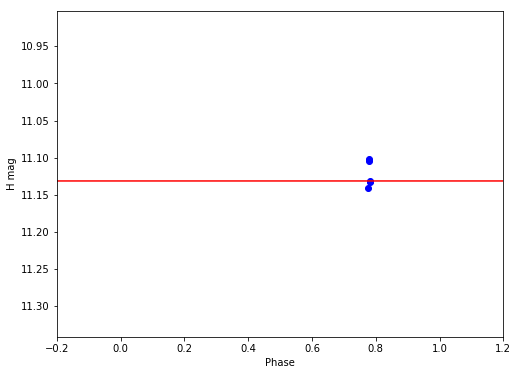

H 11.1312468955 2.03123396361e-05


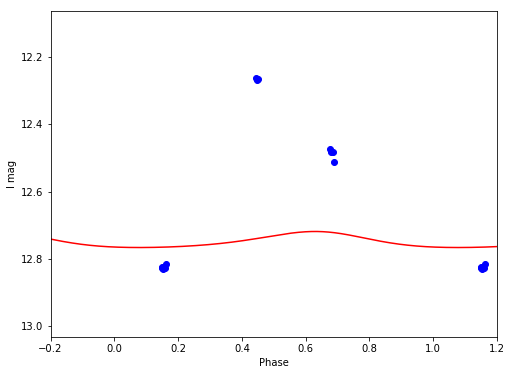

I 12.7464095026 0.0476589452665


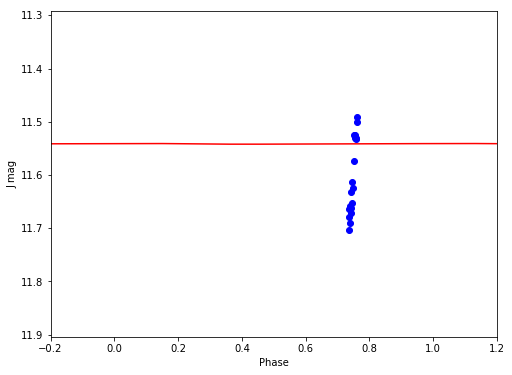

J 11.5413637576 0.00126760769872
V35
/Volumes/Annie/CRRP/NGC6121/lcvs/V35.phased


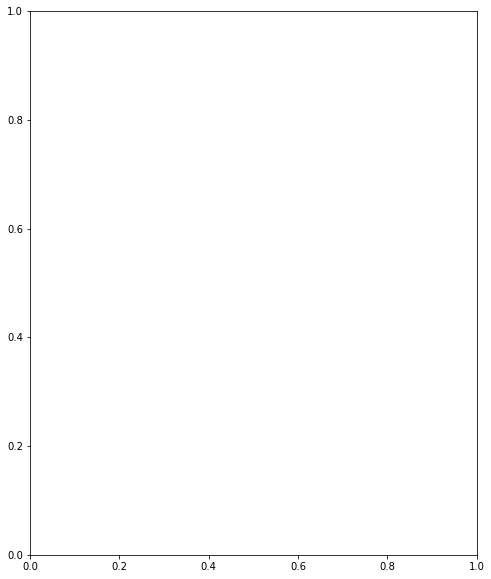

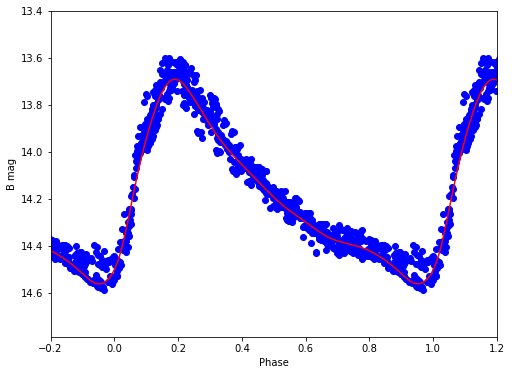

B 14.1553948353 0.871043357625


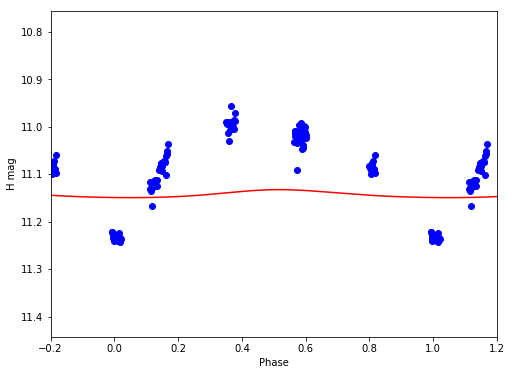

H 11.141755991 0.0168524217948


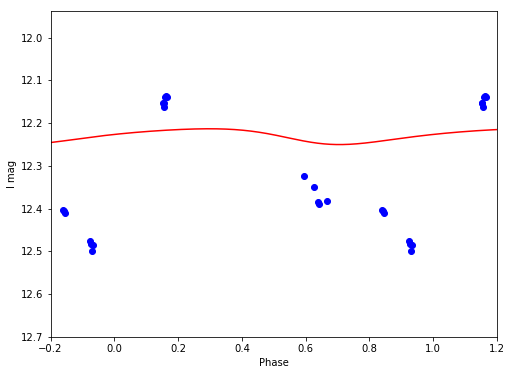

I 12.2292642701 0.0369411747601


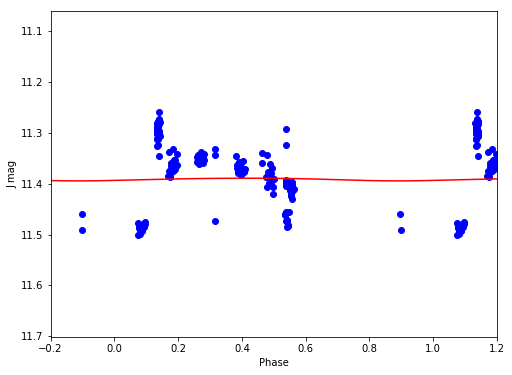

J 11.3916125041 0.00526672234538


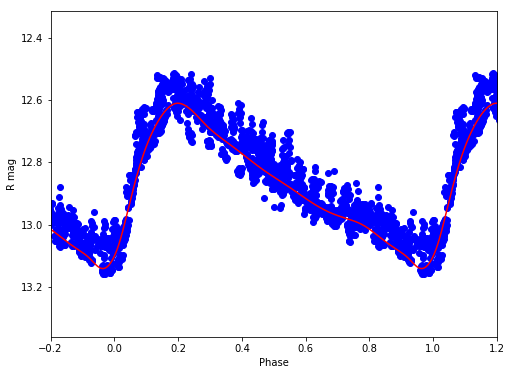

R 12.8645437145 0.530745423836


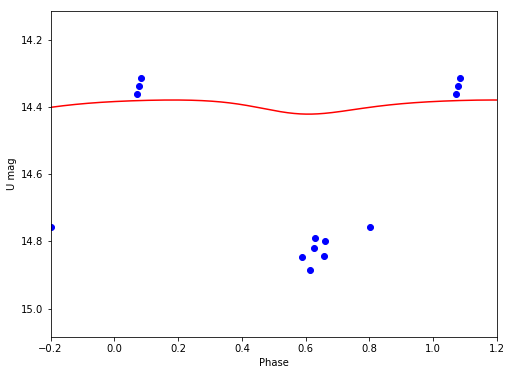

U 14.3960916172 0.0419937124347


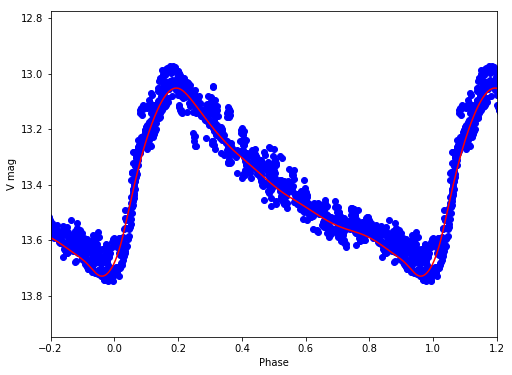

V 13.3956578482 0.677018673135
V36
/Volumes/Annie/CRRP/NGC6121/lcvs/V36.phased


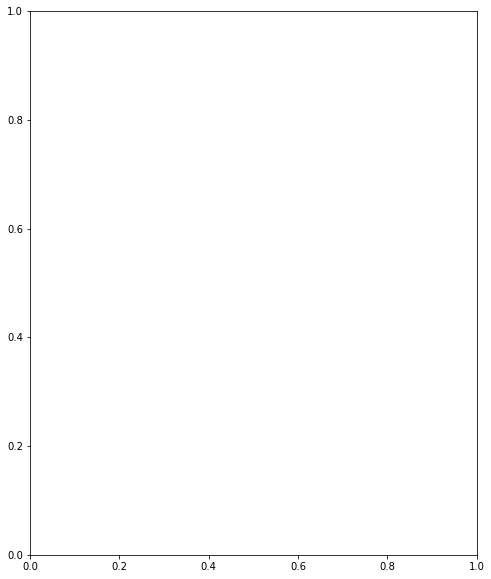

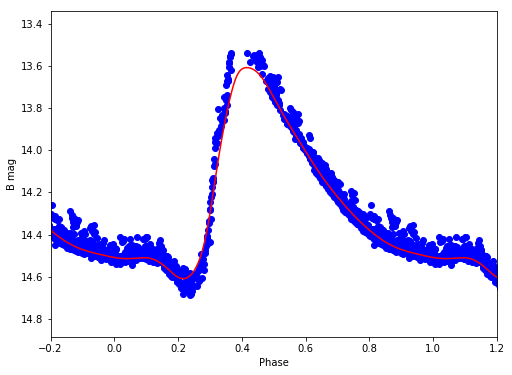

B 14.1841210813 0.999794580471


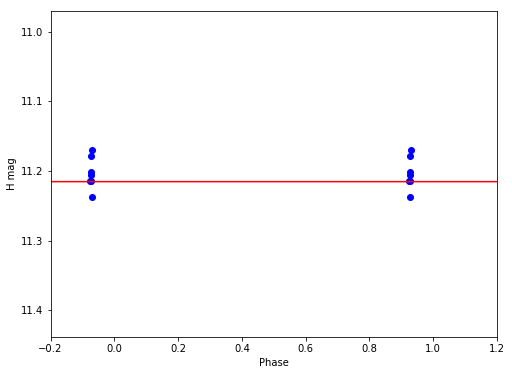

H 11.2153815382 2.54694349593e-05


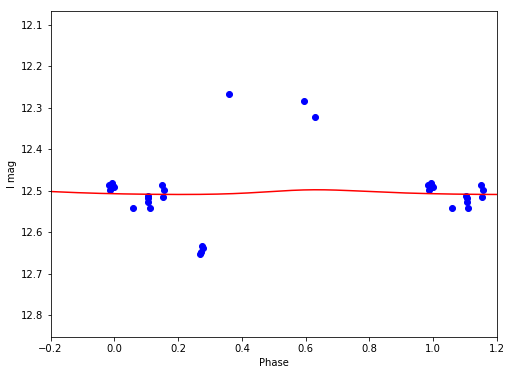

I 12.5044250185 0.0113223951342


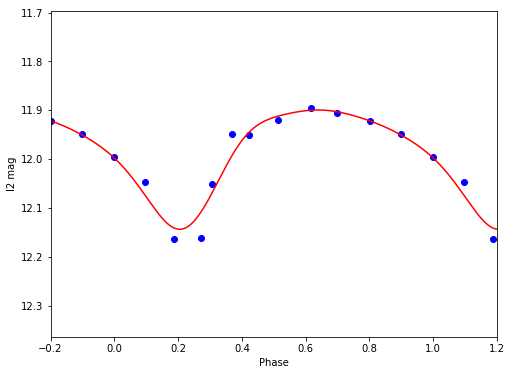

I2 11.9815002076 0.244038167721


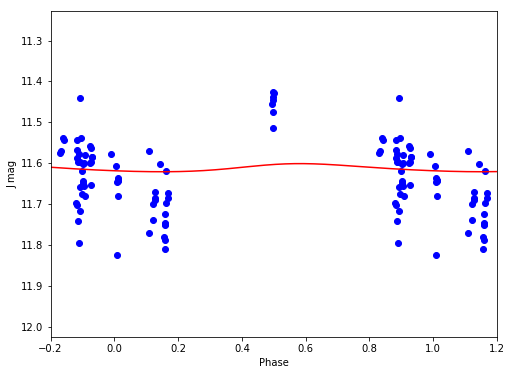

J 11.6117681527 0.019866883726


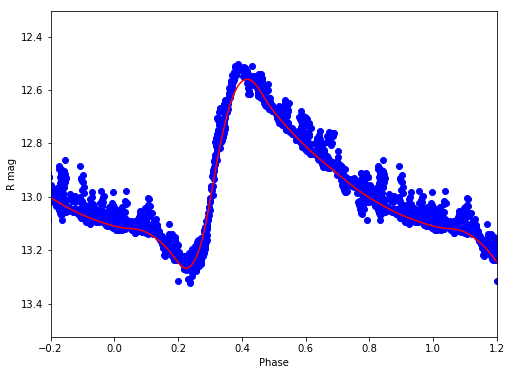

R 12.9348202537 0.707612985649


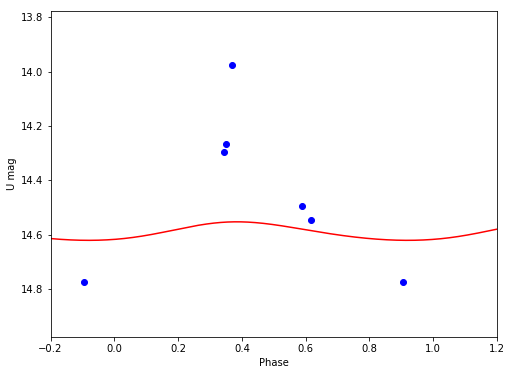

U 14.588900495 0.0681849670266


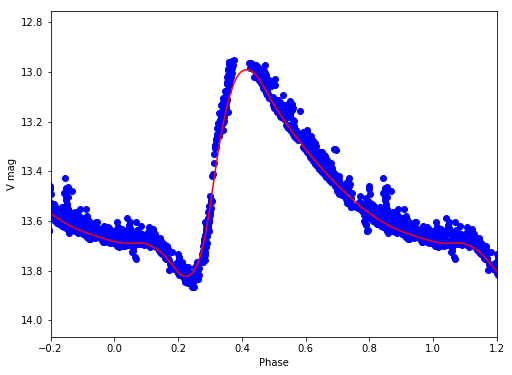

V 13.4515571836 0.832359097278
V37
/Volumes/Annie/CRRP/NGC6121/lcvs/V37.phased


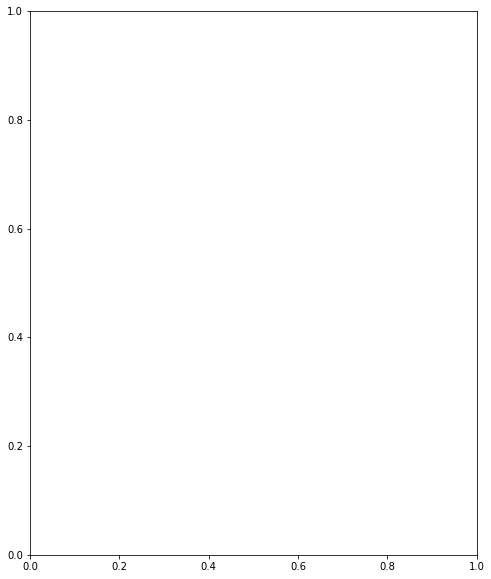

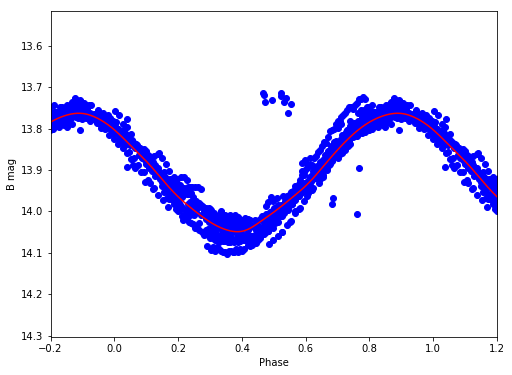

B 13.9013701274 0.286155819953


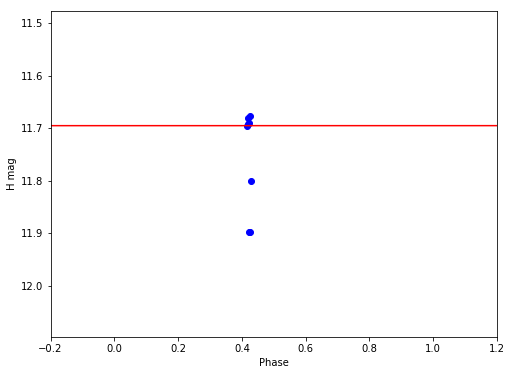

H 11.69498761 4.67229539272e-05


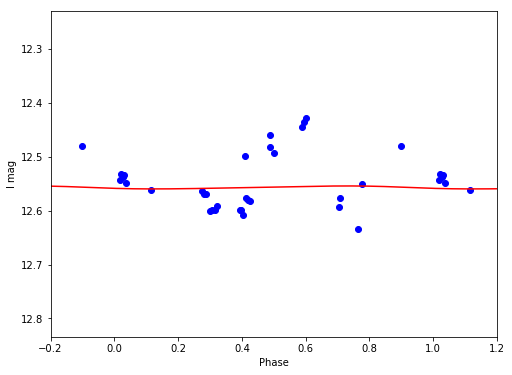

I 12.5570136976 0.00550958741984


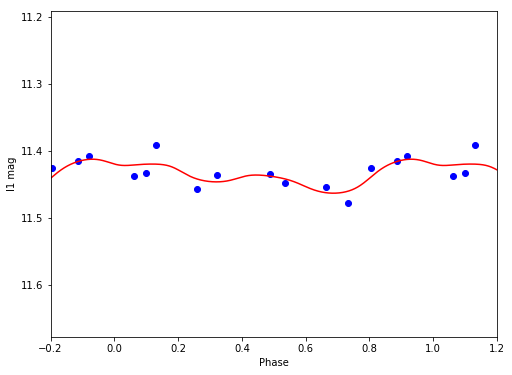

I1 11.4355281715 0.0507457657148


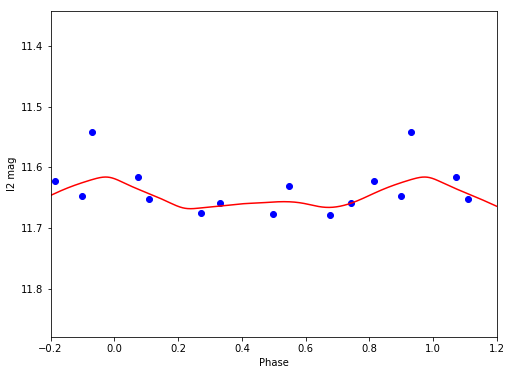

I2 11.6502143831 0.0521333051795


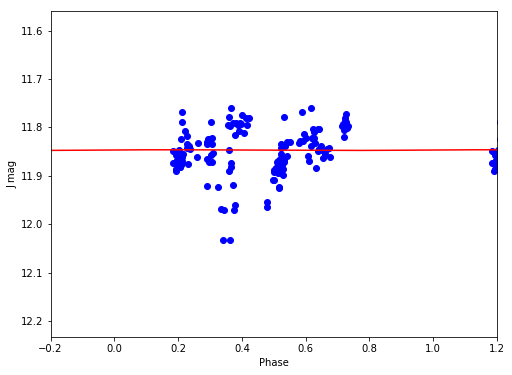

J 11.8467295024 0.00130356045594


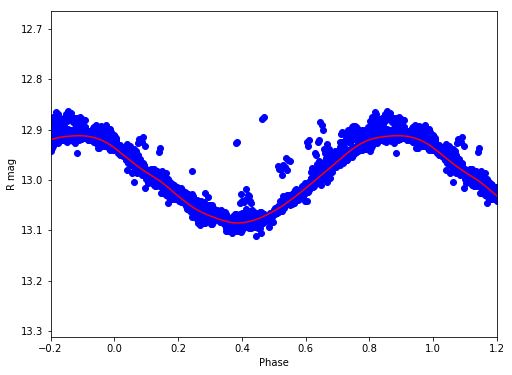

R 12.9964541201 0.173136448543


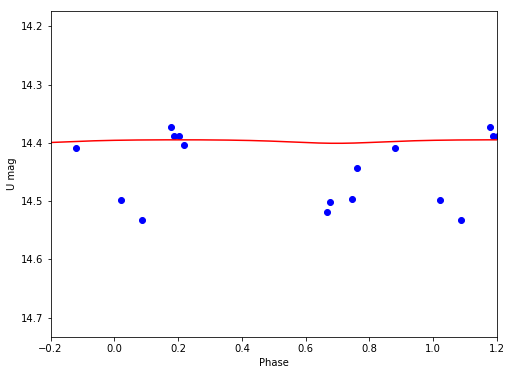

U 14.397000978 0.00598103880688


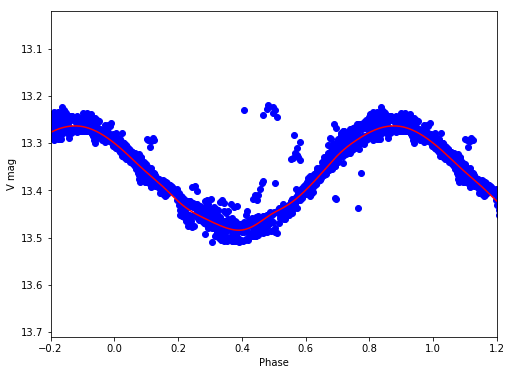

V 13.3719870337 0.220988535202
V38
/Volumes/Annie/CRRP/NGC6121/lcvs/V38.phased


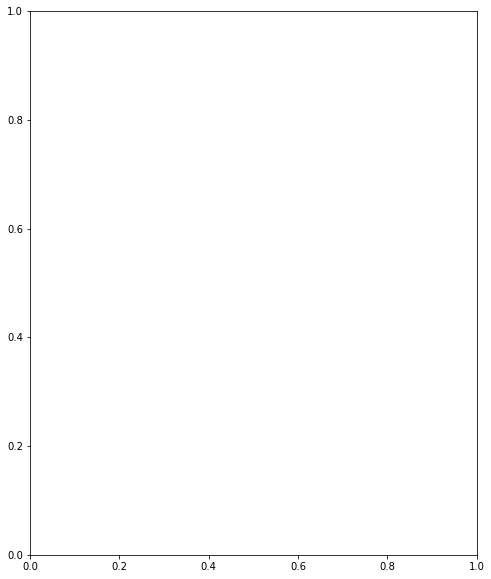

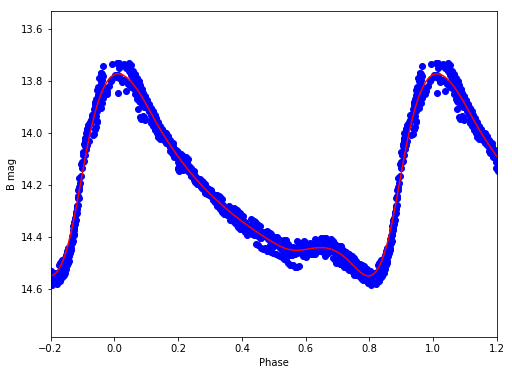

B 14.2077477243 0.775868599092


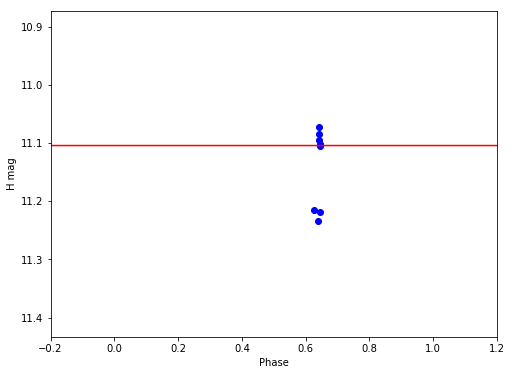

H 11.1040389546 4.3720318601e-06


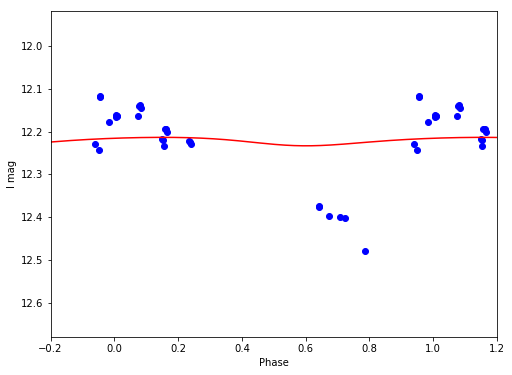

I 12.2220044433 0.0197113905184


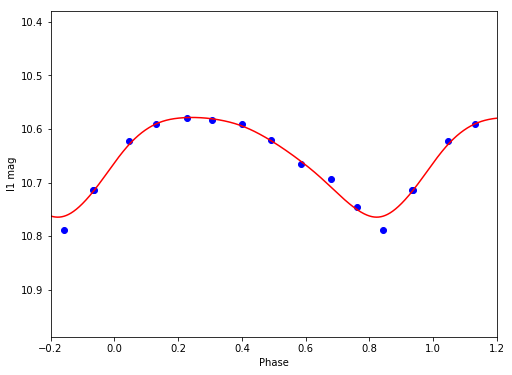

I1 10.6513549934 0.186145740869


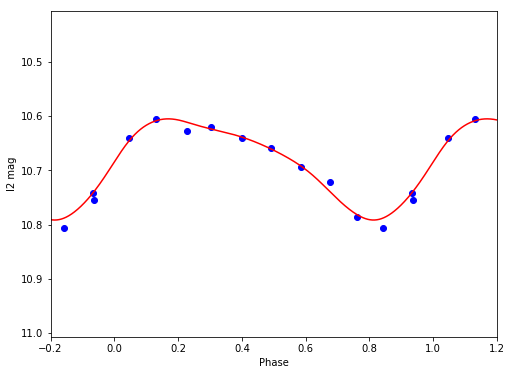

I2 10.6818548844 0.186737776972


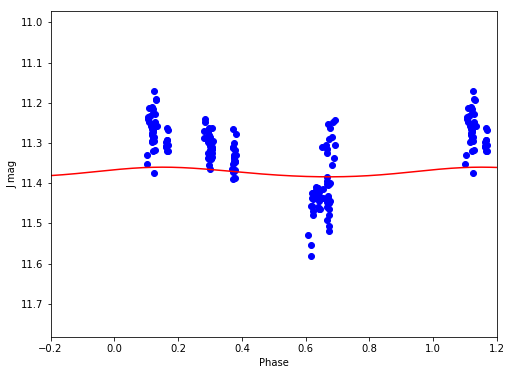

J 11.3729606279 0.0239958132289


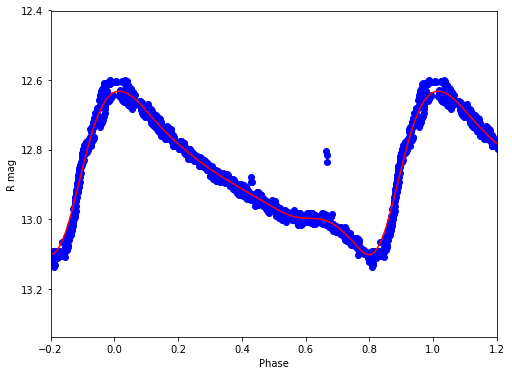

R 12.8725041027 0.469680133355


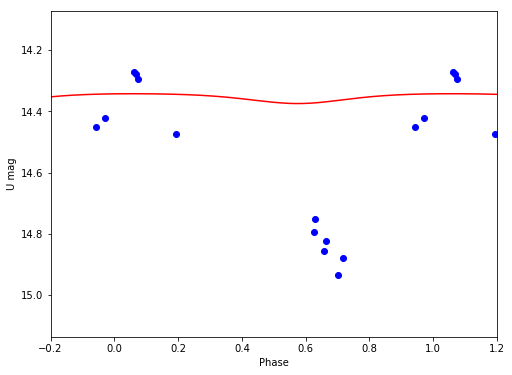

U 14.3540766464 0.0320595755335


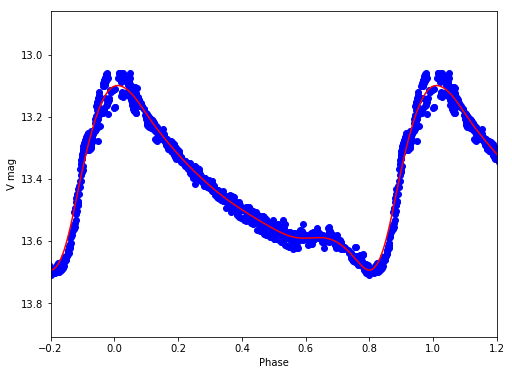

V 13.4197670736 0.593012889687
V39
/Volumes/Annie/CRRP/NGC6121/lcvs/V39.phased


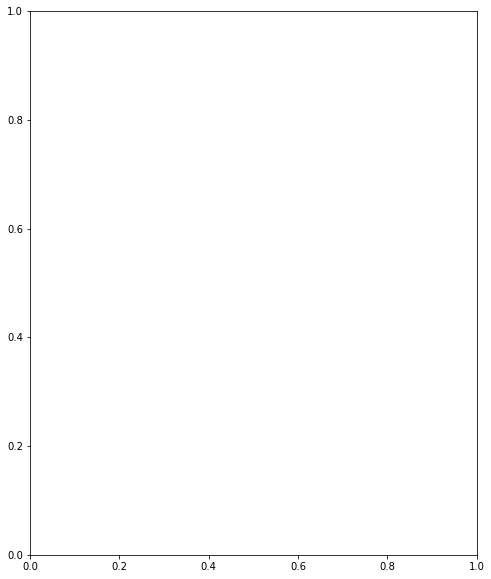

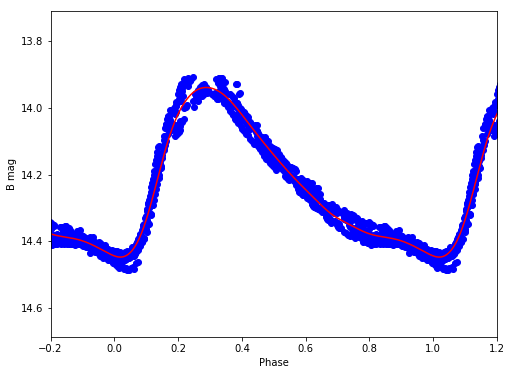

B 14.2110512825 0.508136483603


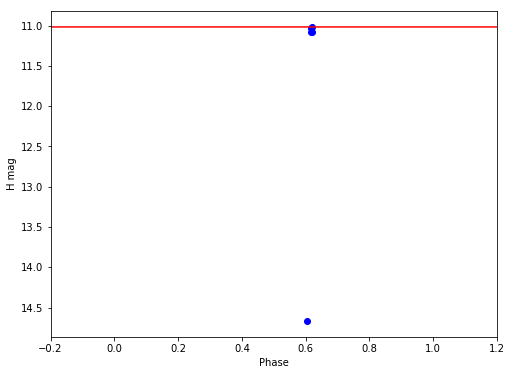

H 11.0163562947 0.000100181211694


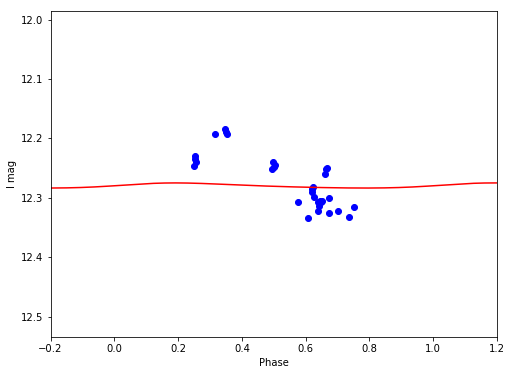

I 12.2798397223 0.00860335075581


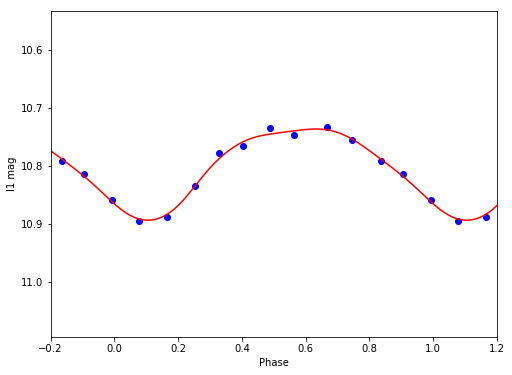

I1 10.798447548 0.157111128177


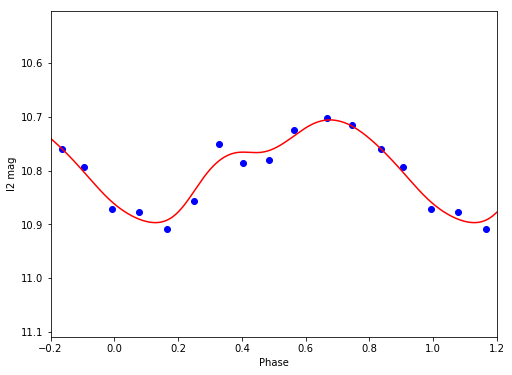

I2 10.7902988443 0.19118255636


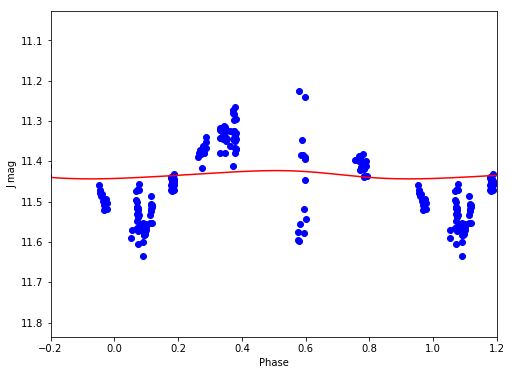

J 11.4332840205 0.0205652415656


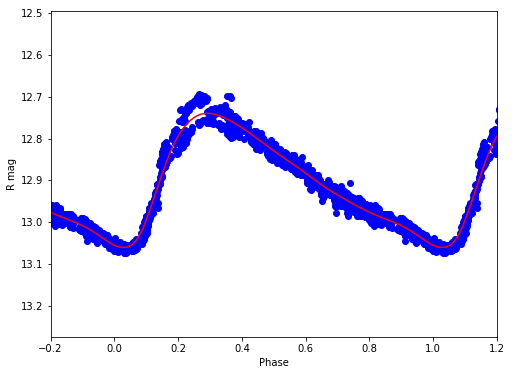

R 12.8938912925 0.320810637272


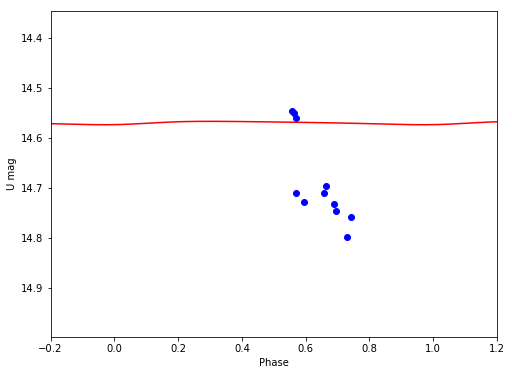

U 14.5692202985 0.00681944562831


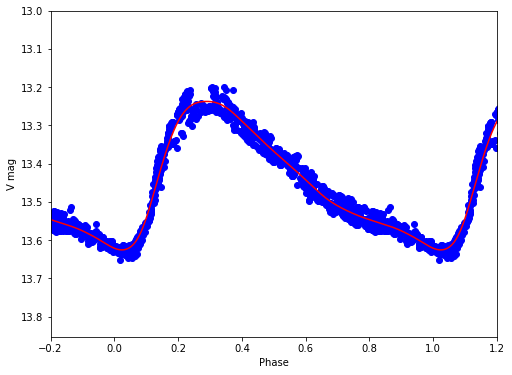

V 13.4343335532 0.388283712876
V40
/Volumes/Annie/CRRP/NGC6121/lcvs/V40.phased


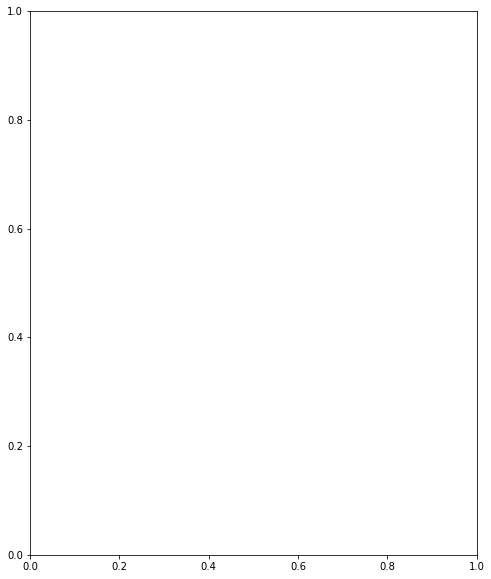

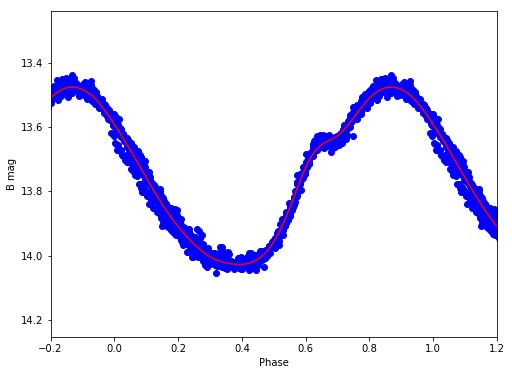

B 13.7414726323 0.552382235541


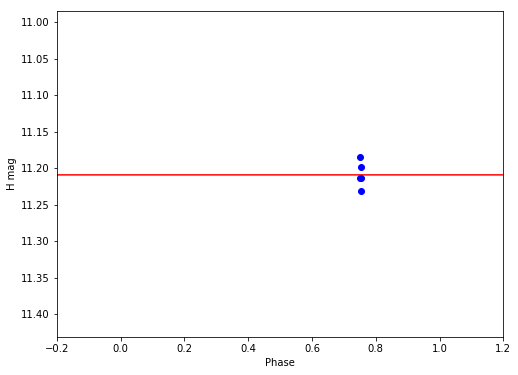

H 11.2090985492 4.97359802267e-05


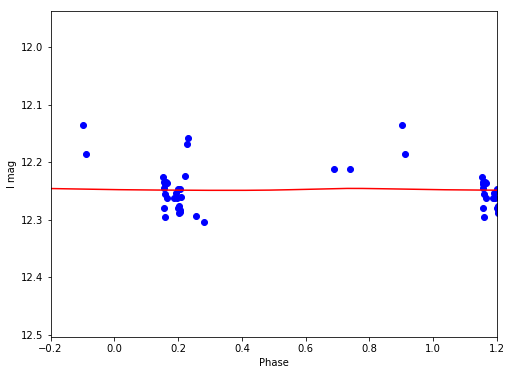

I 12.2476344015 0.00337506040065


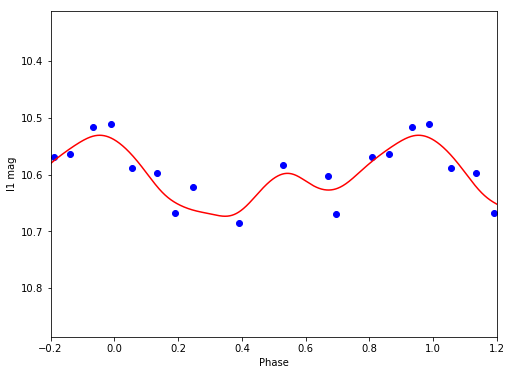

I1 10.6072976734 0.14226559615


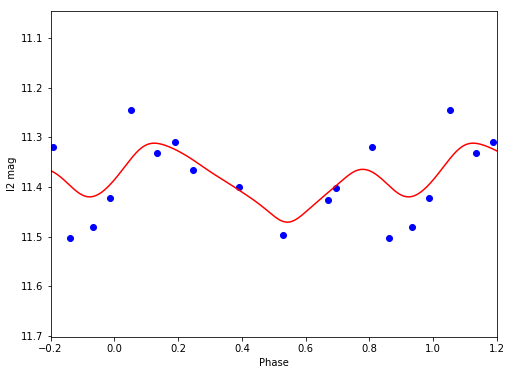

I2 11.3888008385 0.159084340846


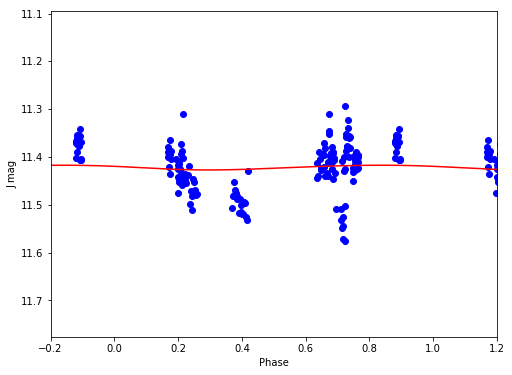

J 11.4219299378 0.00997051531645


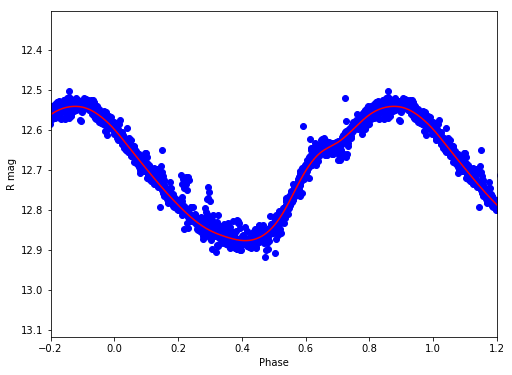

R 12.702163437 0.335078081151


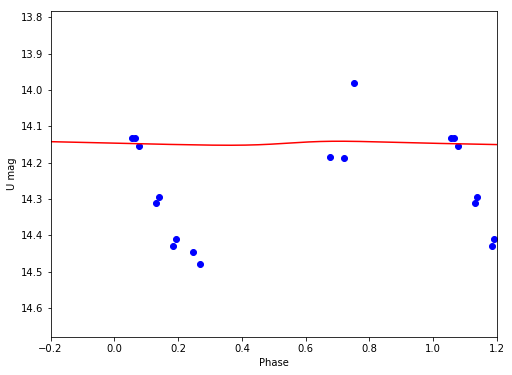

U 14.1470003076 0.0110547003176


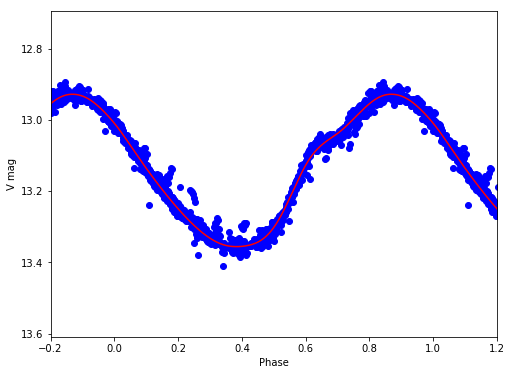

V 13.13270566 0.428424940434
V41
/Volumes/Annie/CRRP/NGC6121/lcvs/V41.phased


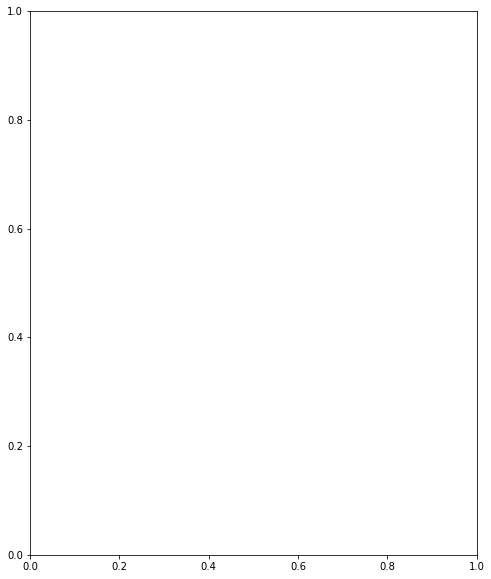

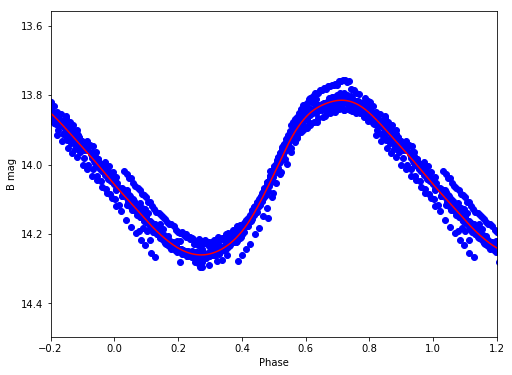

B 14.0297086158 0.445777417526


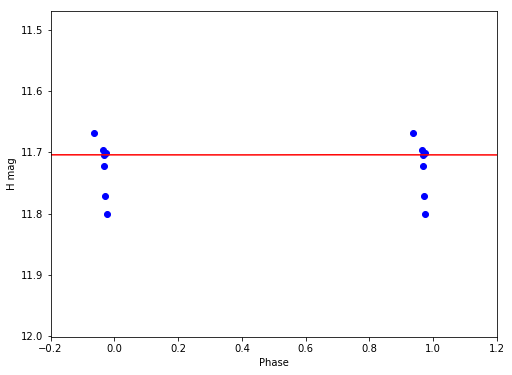

H 11.7042329355 0.000289276183297


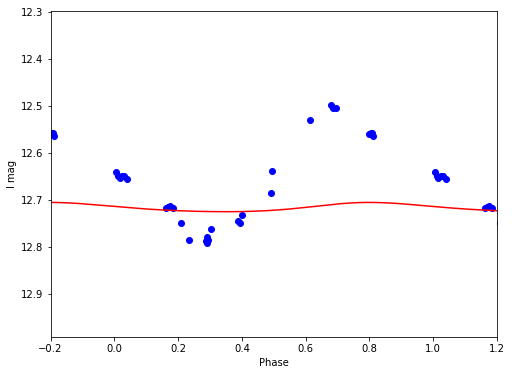

I 12.7160883234 0.0196848190918


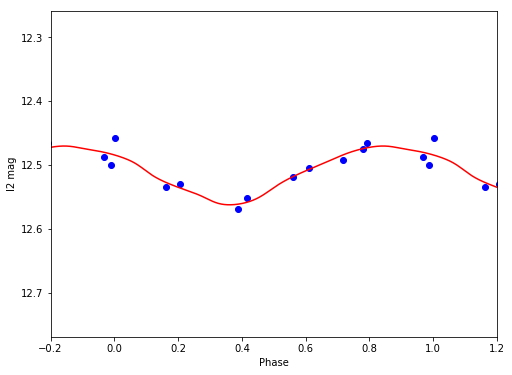

I2 12.5116270146 0.0920738032694


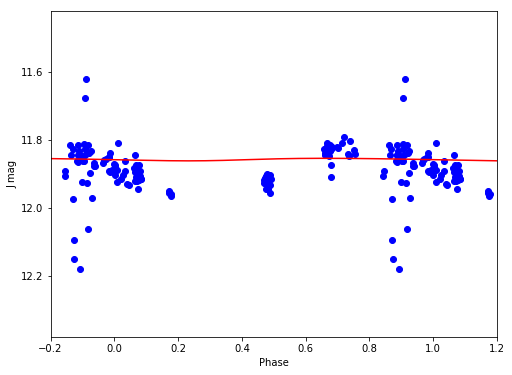

J 11.8565082029 0.0074562782166


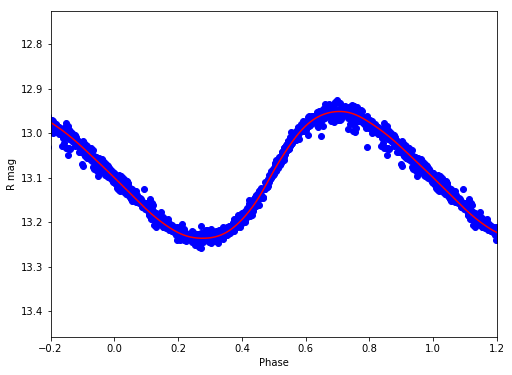

R 13.0902783716 0.285360604984


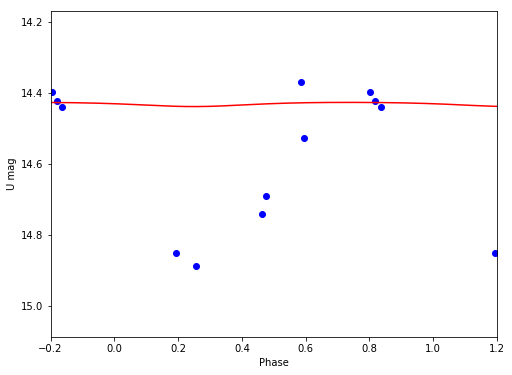

U 14.4321880179 0.0117676122082


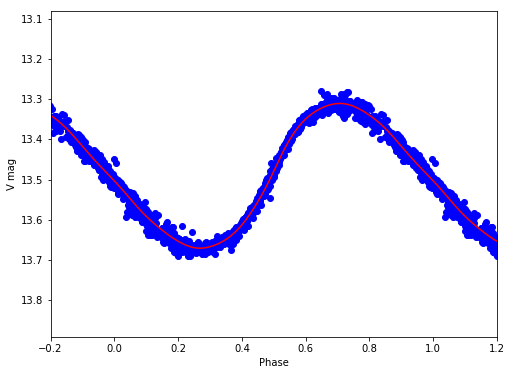

V 13.4848156638 0.359921696808
V42
/Volumes/Annie/CRRP/NGC6121/lcvs/V42.phased


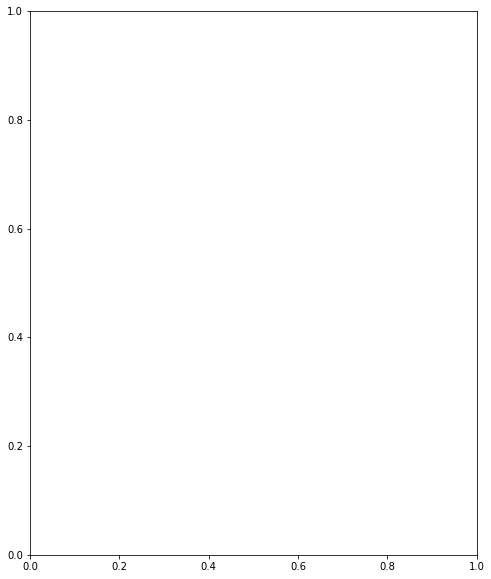

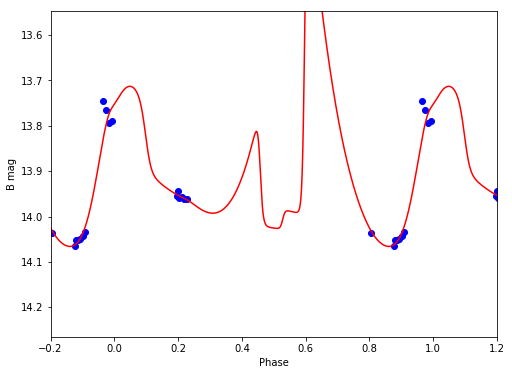

B 13.8755864876 0.768455767294


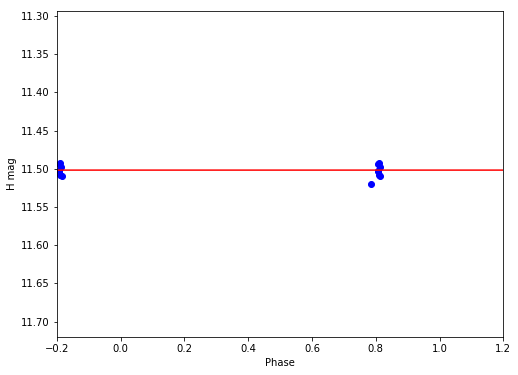

H 11.5017693191 6.19125362711e-06


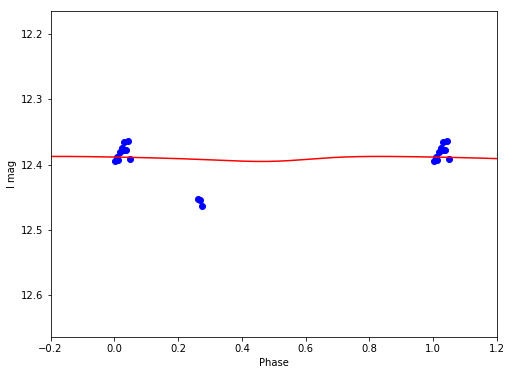

I 12.3907265688 0.00772806709963


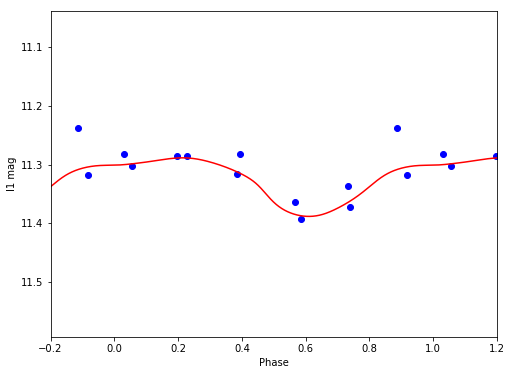

I1 11.325992349 0.0996650515895


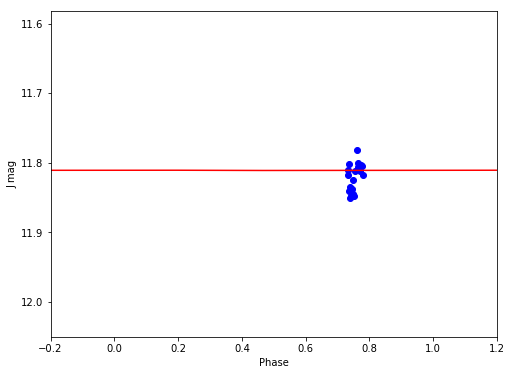

J 11.8106133884 0.000454449385474


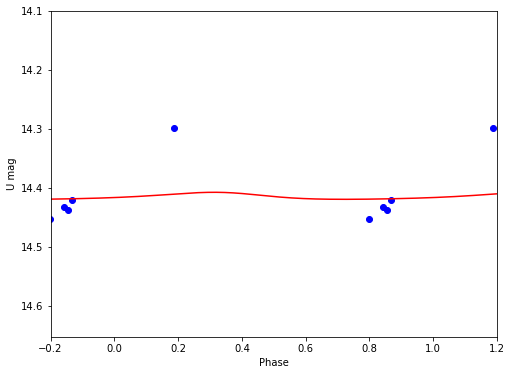

U 14.4147446941 0.0119228564489


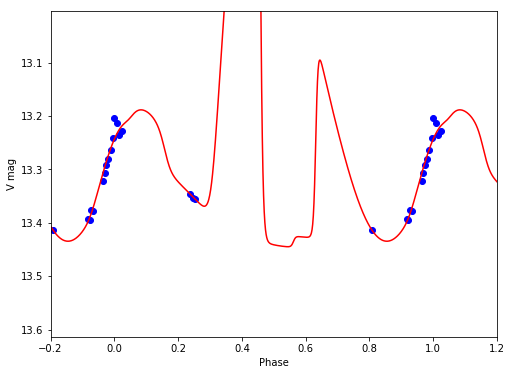

V 13.1545454782 1.56222107437
V43
V49
/Volumes/Annie/CRRP/NGC6121/lcvs/V49.phased


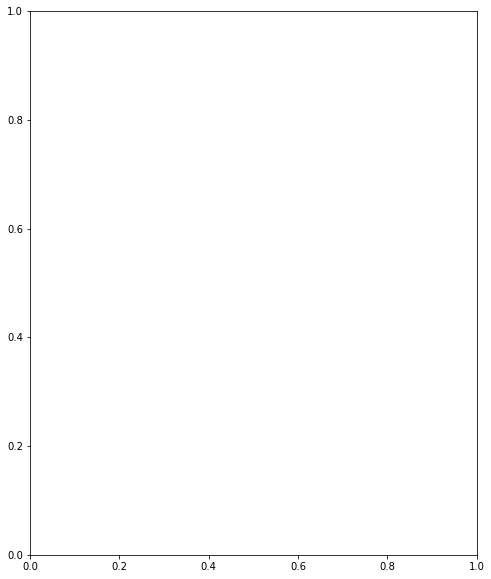

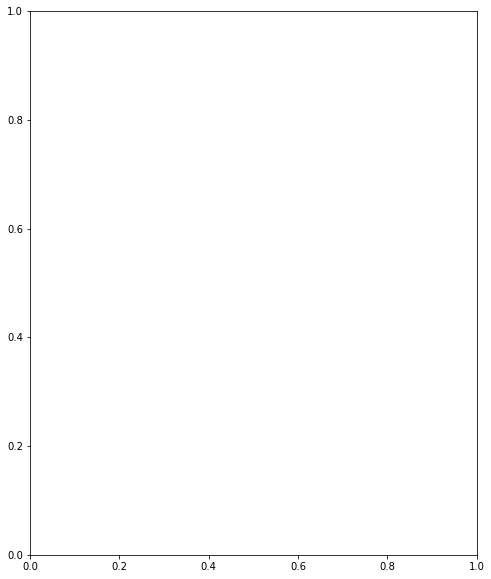

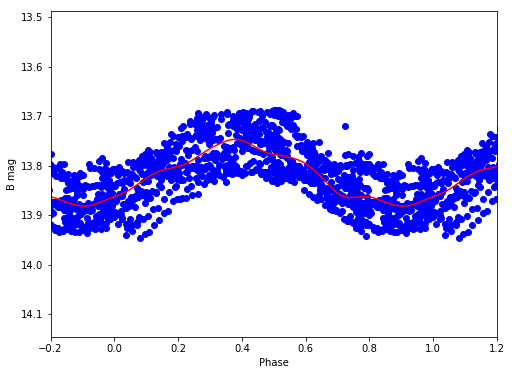

B 13.8172183082 0.134808825452


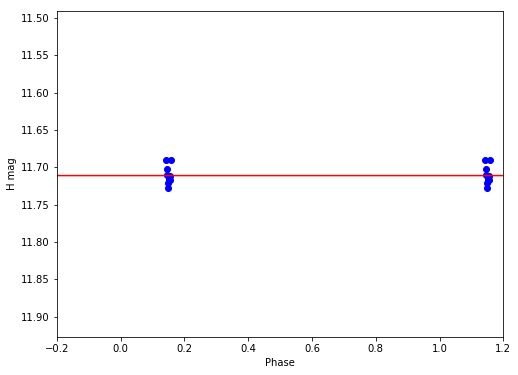

H 11.7109978478 1.0350014767e-05


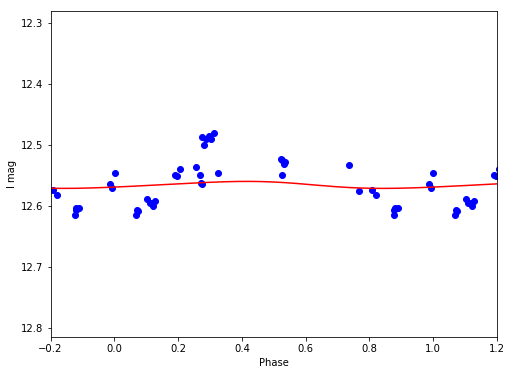

I 12.5659433261 0.0114833074621


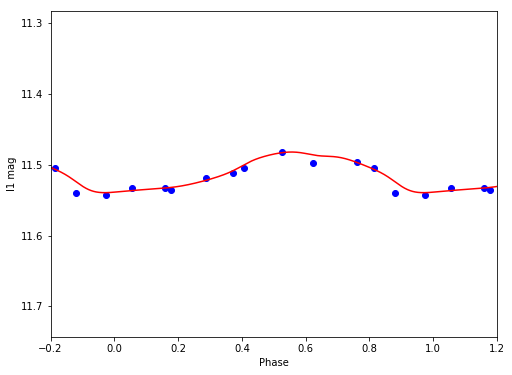

I1 11.511503336 0.0574392540929


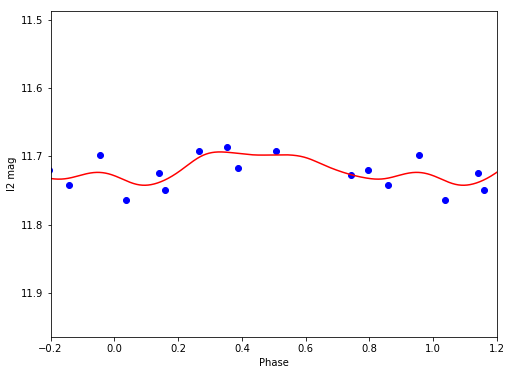

I2 11.7164710627 0.0487355766774


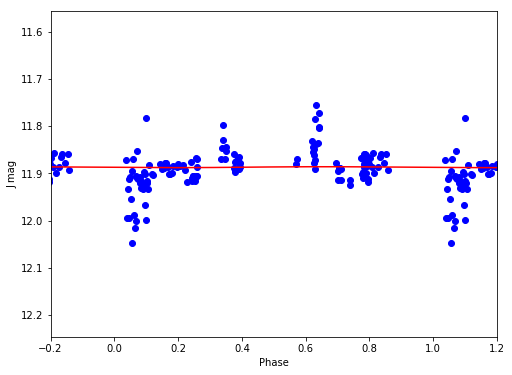

J 11.8866088378 0.00195914097275


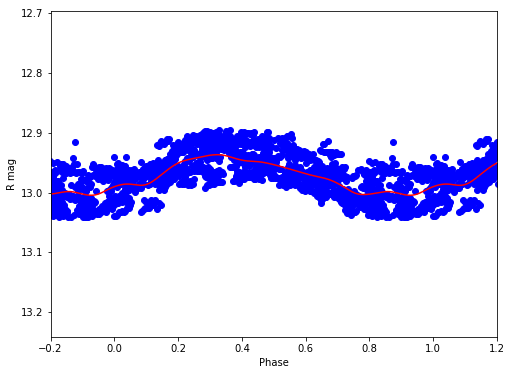

R 12.9719072627 0.067809289119


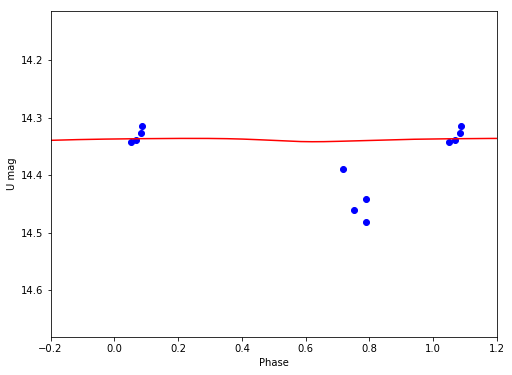

U 14.3383331165 0.00578416246868


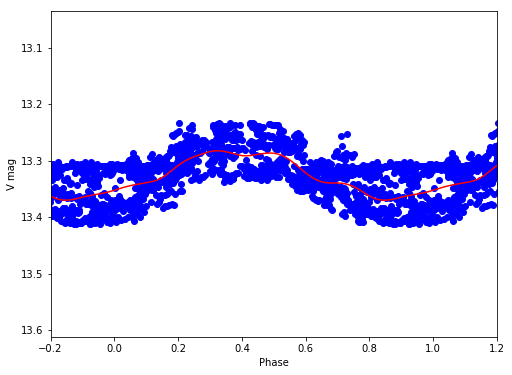

V 13.324542138 0.0875676635126
V52
/Volumes/Annie/CRRP/NGC6121/lcvs/V52.phased


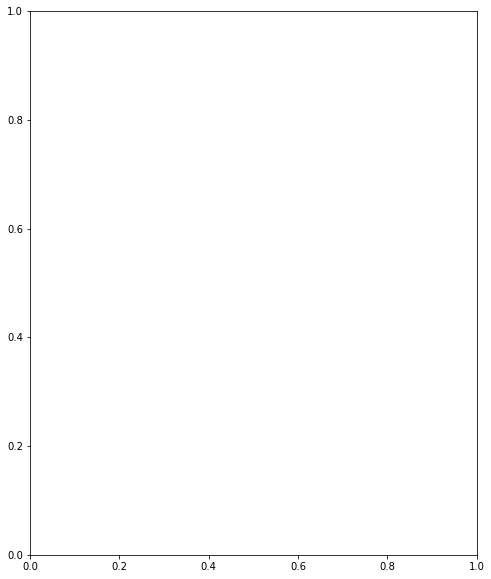

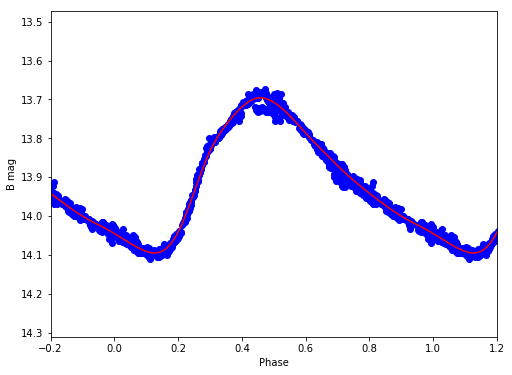

B 13.8947893503 0.39829136461


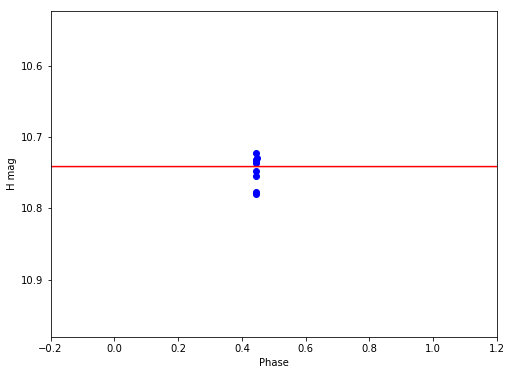

H 10.7415008176 2.02855348377e-05


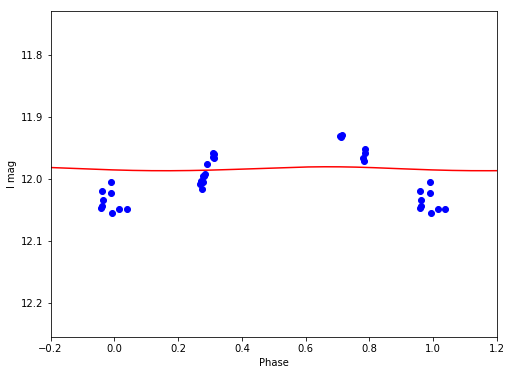

I 11.9836580028 0.00637298371372


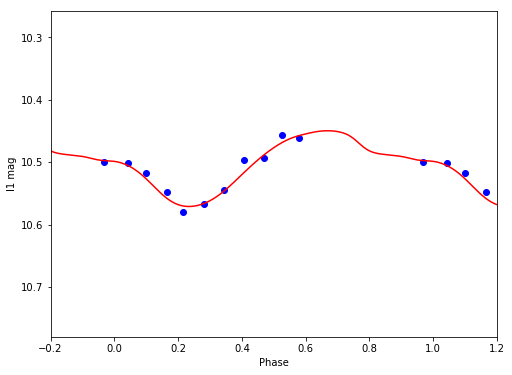

I1 10.5022325932 0.121443668673


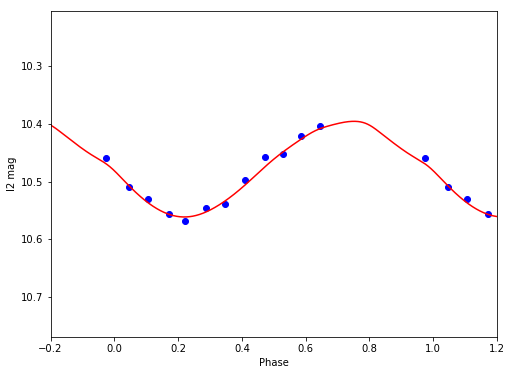

I2 10.475048931 0.165698831761


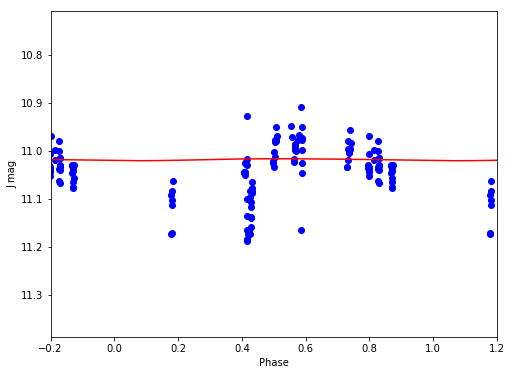

J 11.0177027614 0.00400140777188


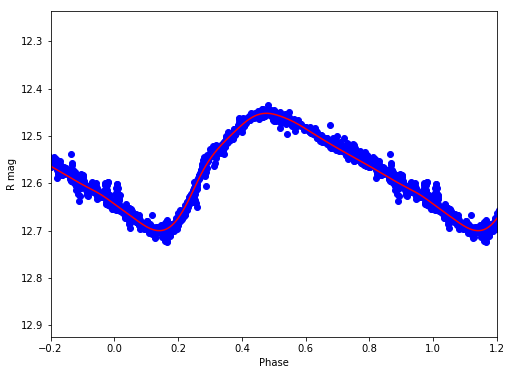

R 12.563301295 0.247958104507


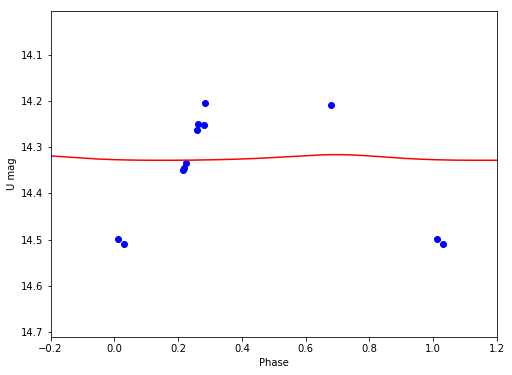

U 14.3236874238 0.012242918732


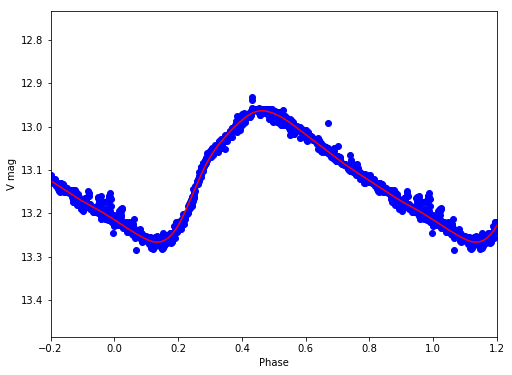

V 13.1069980335 0.303252357852
V61
/Volumes/Annie/CRRP/NGC6121/lcvs/V61.phased


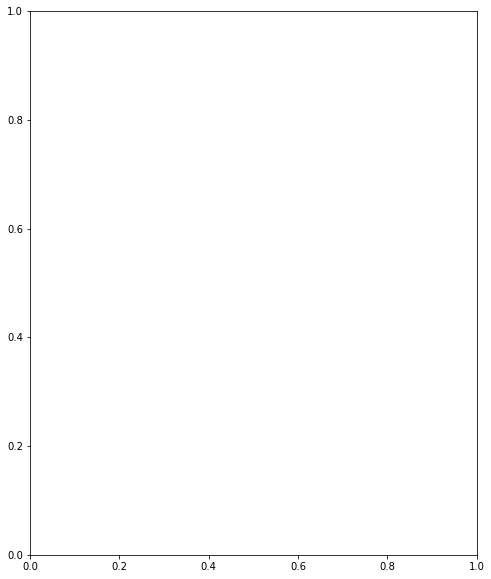

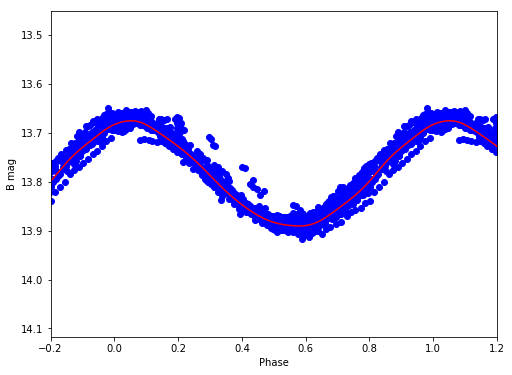

B 13.7858179639 0.215158522023


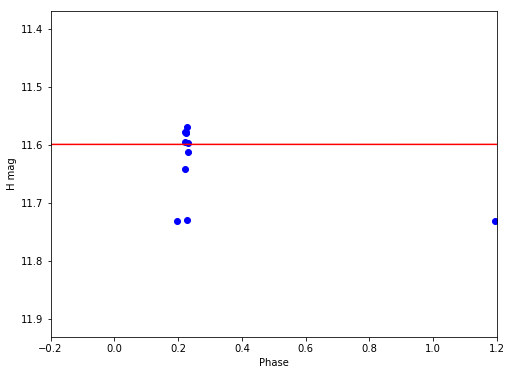

H 11.5988410011 0.000160444118357


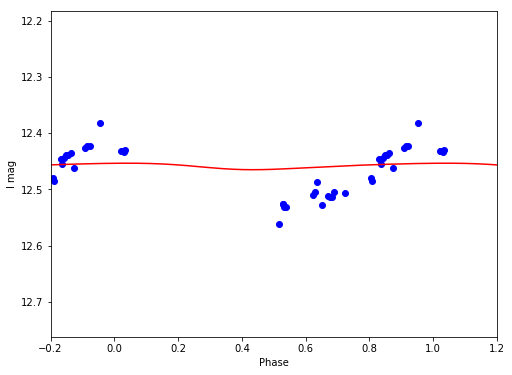

I 12.4584089196 0.0115807425575


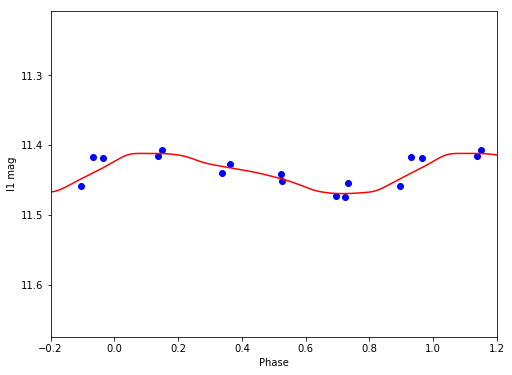

I1 11.439930347 0.0576839441977


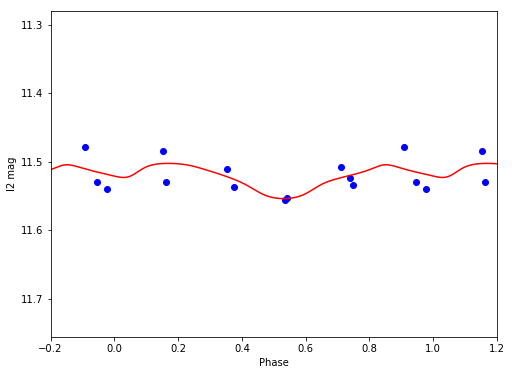

I2 11.5219469108 0.0515739692737


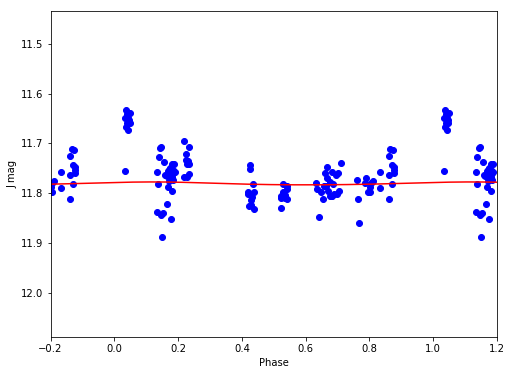

J 11.7807846318 0.00582006007162


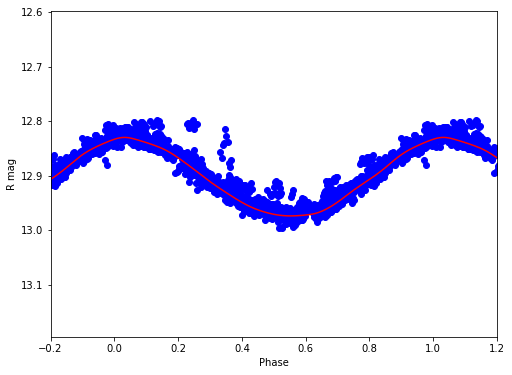

R 12.9048442998 0.144158908085


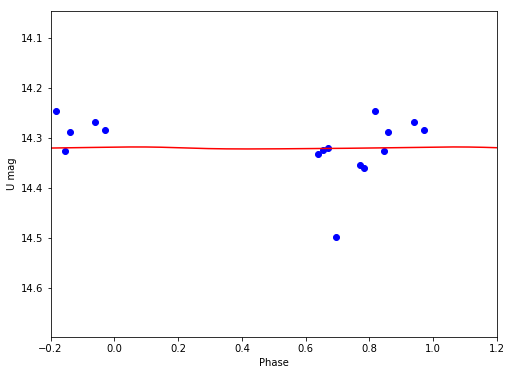

U 14.3201890199 0.00399682267048


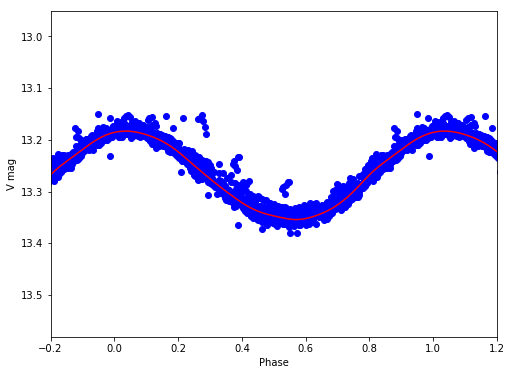

V 13.269013426 0.171129280069
V64
V75
/Volumes/Annie/CRRP/NGC6121/lcvs/V75.phased


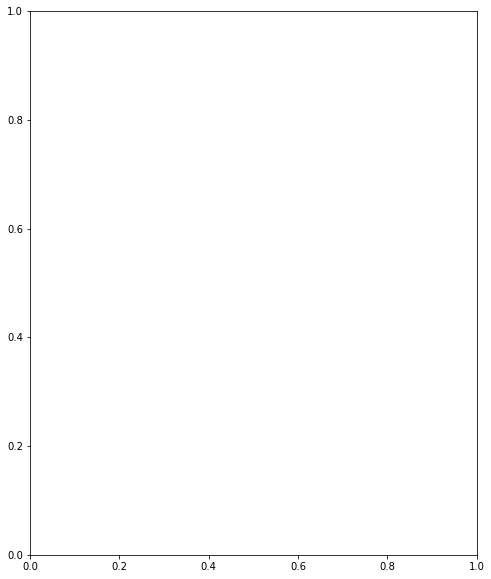

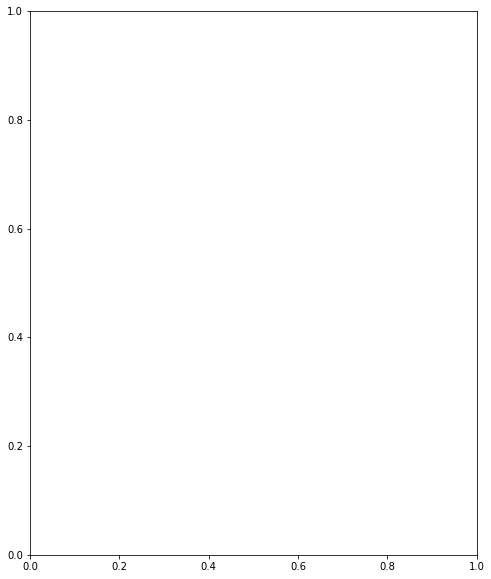

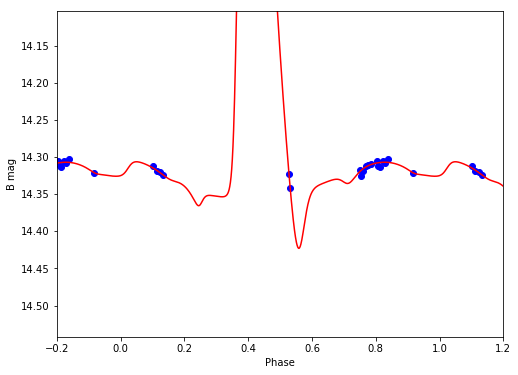

B 14.2664306037 0.554517784722


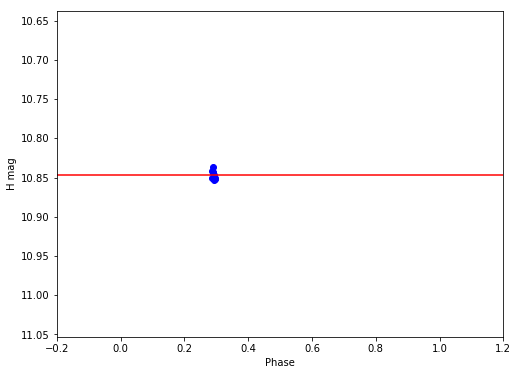

H 10.8466352595 2.94905930485e-05


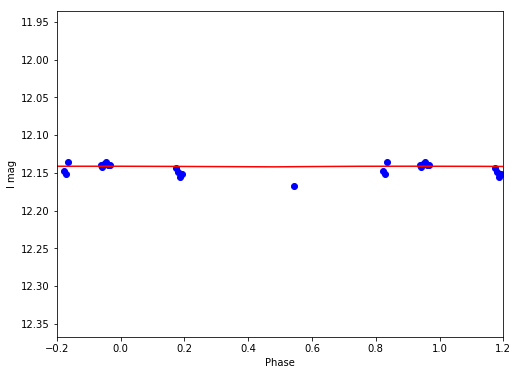

I 12.1413917873 0.000901357582459


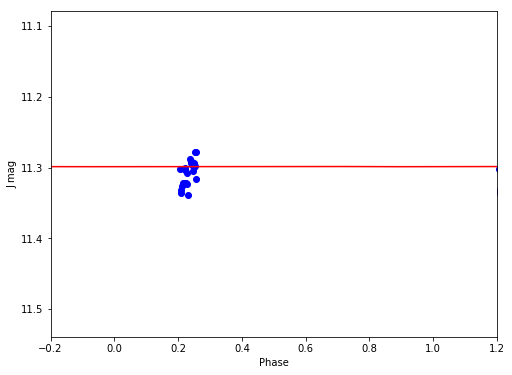

J 11.298365088 0.000390566244972


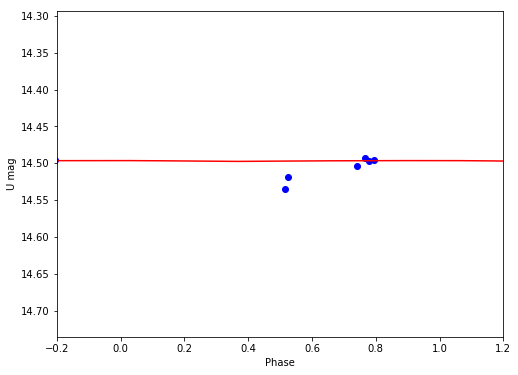

U 14.4966427494 0.00110874661726


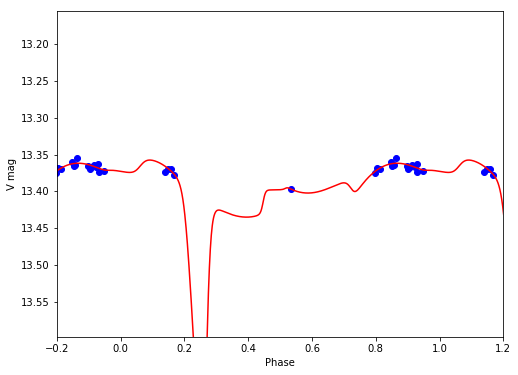

V 13.4060472529 0.402618758372
V76
/Volumes/Annie/CRRP/NGC6121/lcvs/V76.phased


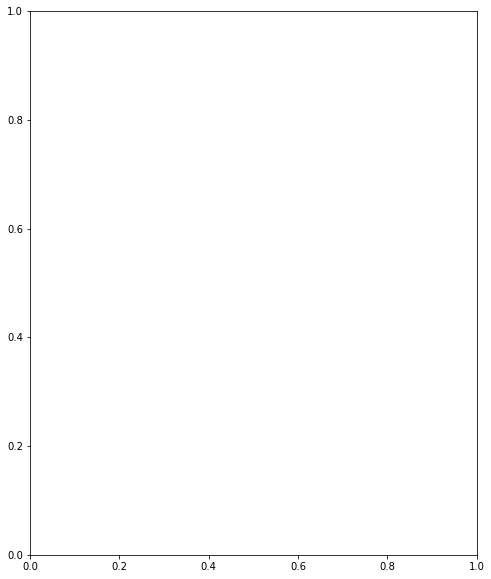

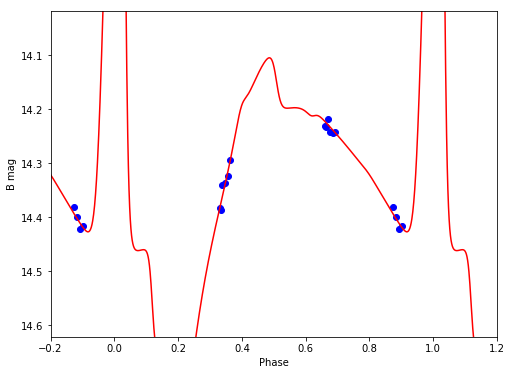

B 14.2233101018 1.90687804458


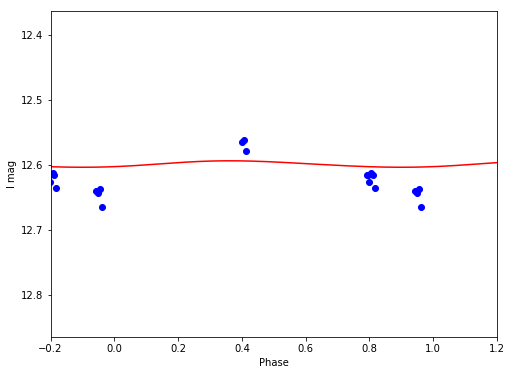

I 12.5986516584 0.00997957663357


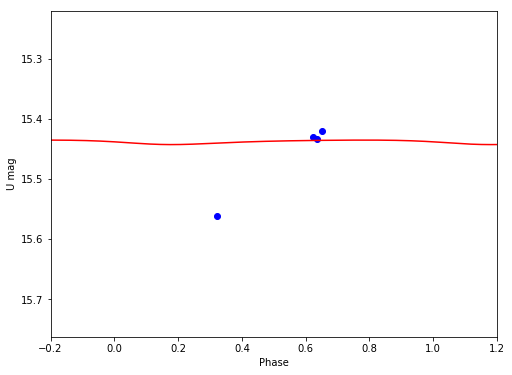

U 15.4379847912 0.00747428318681


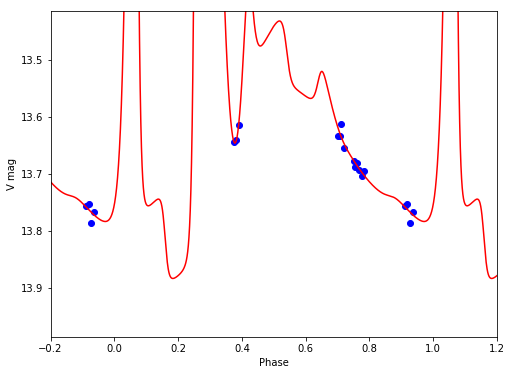

V 13.314020797 2.5623166579
C1
/Volumes/Annie/CRRP/NGC6121/lcvs/C1.phased


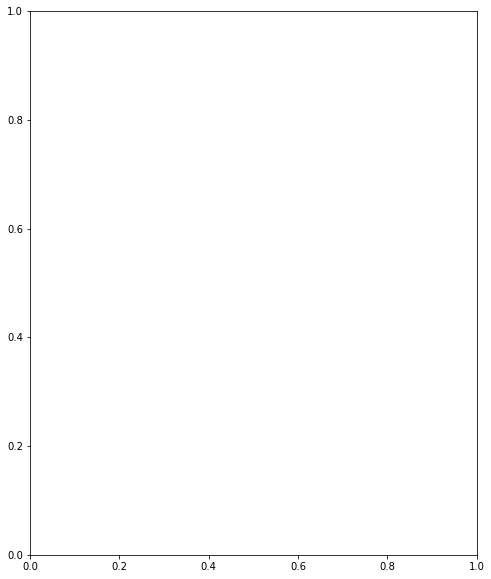

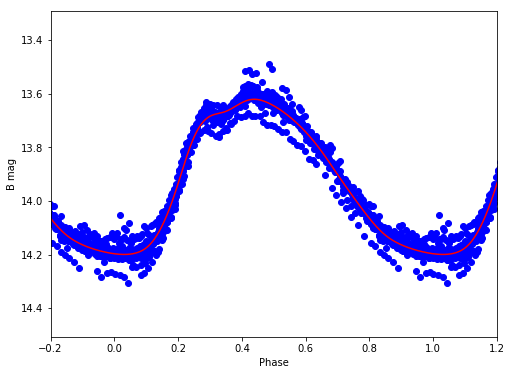

B 13.8921737592 0.579497753395


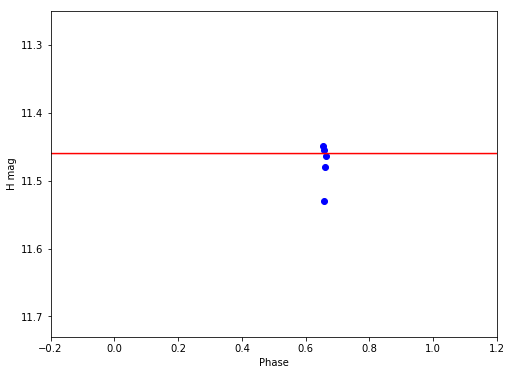

H 11.4597561174 6.84419343404e-05


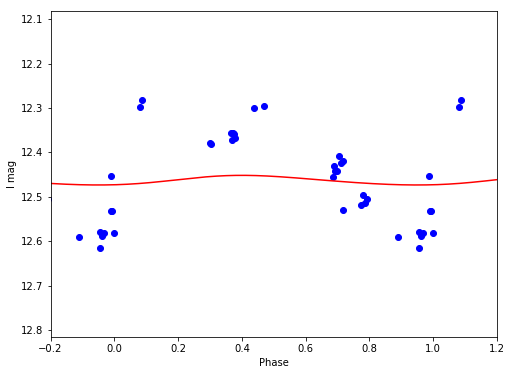

I 12.4629664259 0.0216518816607


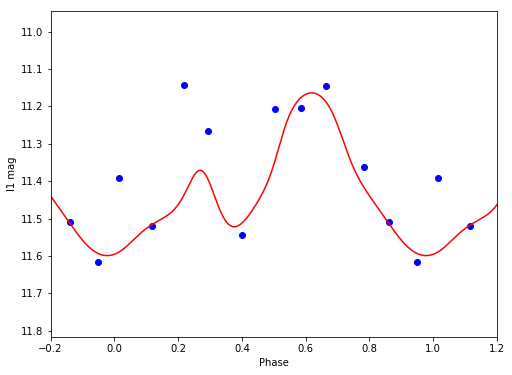

I1 11.4188434982 0.434899128901


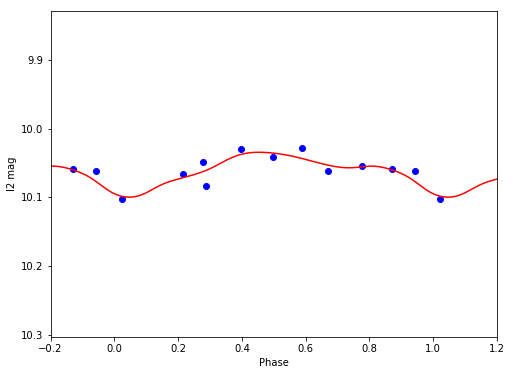

I2 10.0609719056 0.0653964172039


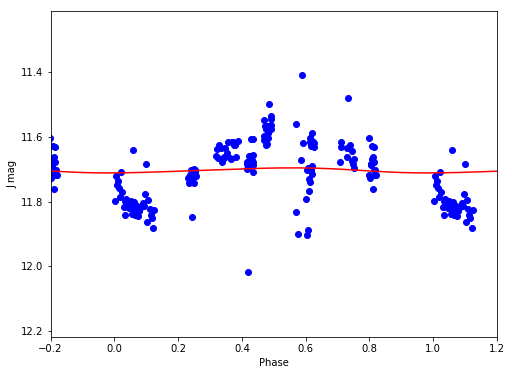

J 11.70362821 0.0156307260574


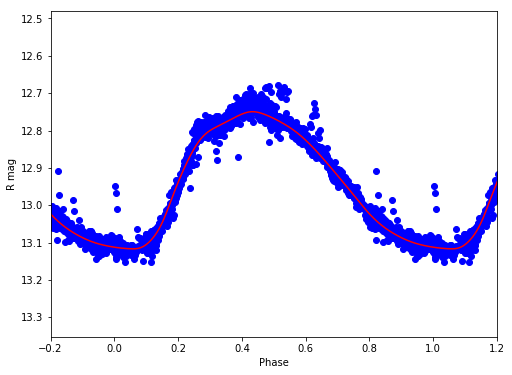

R 12.9253166748 0.367085307705


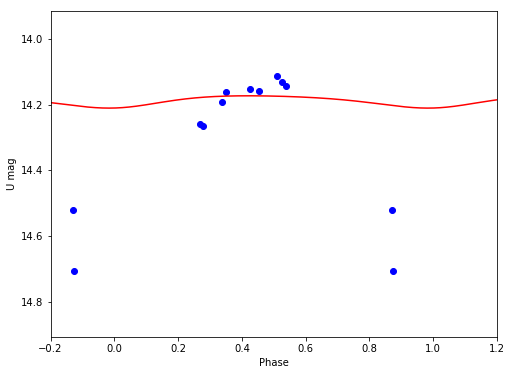

U 14.1881097184 0.0374469018633


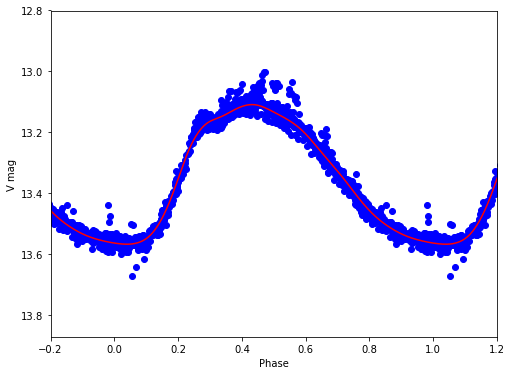

V 13.3274692237 0.458452158286


In [18]:
dtype1 = np.dtype([('id', 'S5'), ('cc_period', float), ('new_period', float)])
data = np.loadtxt(folder+target+'-variables.txt', dtype=dtype1, usecols=(0,1,2))
sp = np.array([0.9, 0.1, 0.1, 0.1, 0.9, 0.9, 0.9, 0.9, 0.2, 0.2])
f = open(folder+'avg_mags_test.txt', 'w')
#star = 'V10'

for ind, star in enumerate(data['id']):
    print star
    try:
        r1, r2, r3, r4 = lightcurves.gloess(folder+'lcvs/'+star+'.phased', smoothing_params=sp, plot_save=1, clean=1)
        datasave = np.array(zip(np.repeat(star, len(r1)), r1, np.repeat(data['new_period'][ind], len(r1)), r2, r3, r4), dtype=[('c1', 'S5'), ('c2', 'S2'), ('c3', float), ('c4', float), ('c5', float), ('c6', float)])
        np.savetxt(f, datasave, fmt='%5s %2s %10.8f %6.3f %4.2f %4.2f')
    except:
        continue
f.close()

/Users/Jill/anaconda2/envs/astroconda/lib/python2.7/site-packages/ipykernel_launcher.py:19: RuntimeWarning: divide by zero encountered in divide


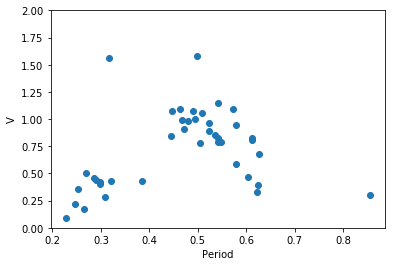

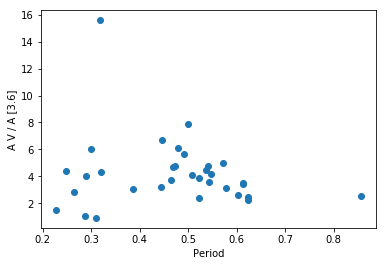

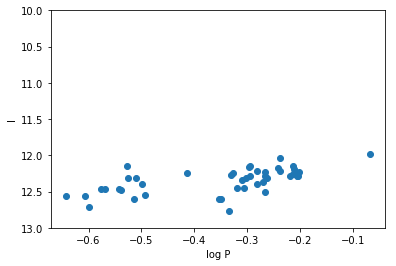

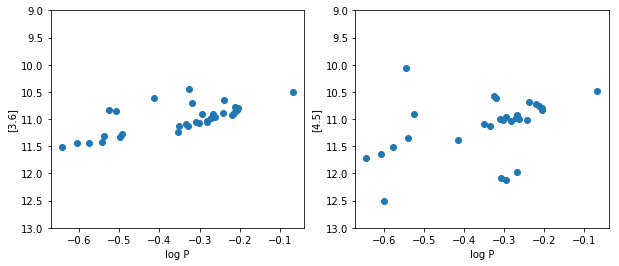

In [21]:
dtype = np.dtype([('star', 'S5'), ('filt', 'S2'), ('period', float), ('avg', float), ('amp', float)])
data = np.loadtxt(folder+'avg_mags_test.txt', dtype=dtype, usecols=(0,1,2,3,4))

# Bailey diagram
x = data['period'][data['filt'] == 'V']
y = data['amp'][data['filt'] == 'V']
fig = mp.figure()
ax = fig.add_subplot(111)
ax.plot(x, y, 'o')
ax.set_ylim((0,2))
ax.set_xlabel('Period')
ax.set_ylabel('V')

# amplitude ratio 
per = data['period'][data['filt'] == 'V']
Vamp = data['amp'][data['filt'] == 'V']
I1amp = data['amp'][data['filt'] == 'I1']

R_amp = Vamp/I1amp

fig3 = mp.figure()
ax4 = fig3.add_subplot(111)
ax4.plot(per, R_amp, 'o')
ax4.set_xlabel('Period')
ax4.set_ylabel('A V / A [3.6]')

# I band PL relation
fig5 = mp.figure()
ax5 = fig5.add_subplot(111)
Iper = data['period'][data['filt'] == 'I']
Imag = data['avg'][data['filt'] == 'I']
ax5.plot(np.log10(Iper), Imag, 'o')
ax5.set_ylim((13,10))
ax5.set_xlabel('log P')
ax5.set_ylabel('I')

# IRAC PL relation
fig2 = mp.figure(figsize=(10,4))
ax1 = fig2.add_subplot(121)
ax2 = fig2.add_subplot(122)
x2 = data['period'][data['filt'] == 'I1']
y2 = data['avg'][data['filt'] == 'I1']
x3 = data['period'][data['filt'] == 'I2']
y3 = data['avg'][data['filt'] == 'I2']
ax1.plot(np.log10(x2), y2, 'o')
ax1.set_ylim((13,9))
ax1.set_xlabel('log P')
ax1.set_ylabel('[3.6]')
ax2.plot(np.log10(x3), y3, 'o')
ax2.set_ylim((13,9))
ax2.set_xlabel('log P')
ax2.set_ylabel('[4.5]')

[]


/Users/Jill/anaconda2/envs/astroconda/lib/python2.7/site-packages/ipykernel_launcher.py:10: RuntimeWarning: invalid value encountered in less
  # Remove the CWD from sys.path while we load stuff.
/Users/Jill/anaconda2/envs/astroconda/lib/python2.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in less
  # This is added back by InteractiveShellApp.init_path()


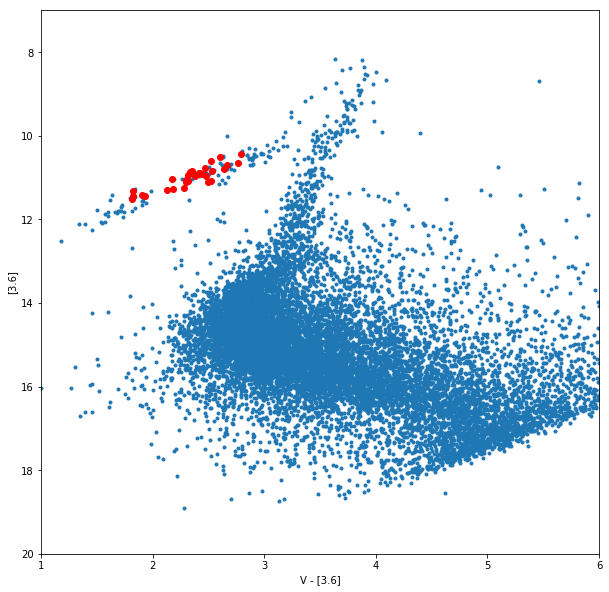

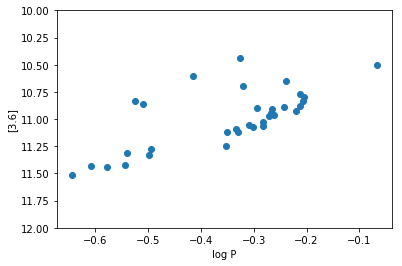

In [9]:
center_ra, center_dec = coordinates.radec_string2deg(cluster_ra, cluster_dec)
# change to read merged catalog
catalog_data, dist = analysis_routines.read_merged_catalog(folder, center_ra, center_dec)

thres = 500
color = catalog_data['V'][dist < thres] - catalog_data['3.6'][dist < thres]
mag = catalog_data['3.6'][dist < thres]
err = catalog_data['3.6er'][dist < thres]

good_mag = mag[err < 0.02]
good_color = color[err < 0.02]

fig2 = mp.figure(figsize=(10,10))
ax2 = fig2.add_subplot(111)
ax2.plot(good_color, good_mag, '.')
ax2.set_ylim((20,7))
ax2.set_xlim((1,6))
ax2.set_xlabel('V - [3.6]')
ax2.set_ylabel('[3.6]')

dtype = np.dtype([('star', 'S5'), ('filt', 'S2'), ('period', float), ('avg', float), ('amp', float)])
data = np.loadtxt(folder+'avg_mags_test.txt', dtype=dtype, usecols=(0,1,2,3,4))

var_color = data['avg'][data['filt'] == 'V'] - data['avg'][data['filt'] == 'I1']
var_mag = data['avg'][data['filt'] == 'I1']
var_id = data['star'][data['filt'] == 'I1']
var_period = data['period'][data['filt'] == 'I1']

bad_id = np.array([])
bad_color = np.array([])
bad_mag = np.array([])
bad_per = np.array([])
for ind, star in enumerate(var_id):
    if var_color[ind] >= 3.0 and var_mag[ind] > 1 : 
        bad_id = np.append(bad_id, star)
        bad_color = np.append(bad_color, var_color[ind])
        bad_mag = np.append(bad_mag, var_mag[ind])
        bad_per = np.append(bad_per, var_period[ind])
        
print bad_id
ax2.plot(var_color, var_mag, 'o', color='r')
ax2.plot(bad_color, bad_mag, 'x', color='k')

fig3 = mp.figure()
ax3 = fig3.add_subplot(111)
ax3.plot(np.log10(var_period), var_mag, 'o')
ax3.plot(np.log10(bad_per), bad_mag, 'x', color='k')
ax3.set_ylim((12,10))
ax3.set_xlabel('log P')
ax3.set_ylabel('[3.6]')

